# Entrenamiento y optimización de Modelos de Machine Learning

Deberás entregar tu Proyecto Final. Entrenarás y optimizarás diversos modelos de machine learning para resolver una problemática específica. El objetivo es que puedan utilizar modelos de ML para resolver el problema de una industria o negocio.

## Objetivos generales:

>-	 Utilizar modelos de Machine Learning para resolver un problema de una industria o negocio.

##Objetivos específicos:

>- Retomar el trabajo realizado en la segunda pre entrega, sumando el trabajo con Machine Learning.

>- Modelar la situación como un problema de Machine Learning.

>- Entrenar modelos de Machine Learning.

>- Realizar ingeniería de atributos y normalización/estandarización de variables.

>- Seleccionar el modelo con mejor performance.


##Requisitos base

###Un Notebook (Colab o Jupyter) junto a un pdf y/o prsentación que debe contener:

>1. Abstracto con motivación y audiencia:  Descripción de alto nivel de lo que motiva a analizar los datos elegidos y audiencia que se podría beneficiar de este análisis.

>2. Preguntas/Problema que buscamos resolver: Si bien puede haber más de una problemática a resolver, la problemática principal debe encuadrarse como un problema de clasificación o regresión.

>3. Breve Análisis Exploratorio de Datos (EDA): Análisis descriptivo de los datos mediante visualizaciones y herramientas estadísticas, análisis de valores faltantes.

>4. Ingeniería de atributos: Creación de nuevas variables, transformación de variables existentes (i.e normalización de variables, encoding, etc.).

>5. Entrenamiento y Testeo: Entrenamiento y testeo de al menos 2 modelos distintos de Machine Learning utilizando algún método de validación cruzada.

>6. Optimización: Utilizar alguna técnica de optimización de hiperparámetros (e.g gridsearch, randomizedsearch, etc.).

>7. Selección de modelos: utilizar las métricas apropiadas para la selección del mejor modelo (e.g AUC, MSE, etc.).

##Piezas sugeridas

>- Librerías: numpy - pandas - matplotlib - sklearn - xgboost - shap.

>- Claridad de código: Estructura - Markdown - Comentarios.

---

<center>
<h1><font color= "green" size="+5">Librerías</font></h1>
<p></p>
<img src="https://www.sensiocoders.com/blog/088/tools.png" alt="Librerías">
</center>

In [ ]:
import time
import warnings

warnings.filterwarnings('ignore')

In [ ]:
!pip install -q kaggle

In [ ]:
!pip install xgboost

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.7/535.7 kB 4.3 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import statsmodels.api as sm
import xgboost as xgb
import shap

from google.colab import files
from scipy.stats import chi2_contingency
from mlxtend.plotting import plot_decision_regions
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import (cross_val_score,
                                     train_test_split,
                                     StratifiedKFold,
                                     KFold,
                                     GridSearchCV,
                                     RandomizedSearchCV,
                                     HalvingGridSearchCV
                                     )
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.multiclass import OneVsRestClassifier
from sklearn import metrics
from sklearn.metrics import (confusion_matrix,
                             classification_report,
                             f1_score,
                             accuracy_score,
                             roc_curve,
                             roc_auc_score,
                             auc
                             )
from imblearn.over_sampling import SMOTE, RandomOverSampler

In [ ]:
from google.colab import drive

drive.mount('/drive/')

Mounted at /drive/


---

<center>
  <h1><font color= "green" size="+5">Credit Score Classifier</font></h1>
  <p></p>
  <img src="https://www.pnc.com/content/dam/pnc-thought-leadership/small-business/managing-business-finances/pnc_insights_sb_business-credit-score.jpg" alt="Credit Score logo">
</center>

# Dataset: [Credit score classification](https://www.kaggle.com/datasets/parisrohan/credit-score-classification)

# Información: [Finanzas](https://es.wikipedia.org/wiki/Finanzas)

# Fuente: [Kaggle](https://www.kaggle.com)

# Análisis del negocio y problemática a resolver

El dataset es de una compañía global de finanzas, a lo largo de los años la compañía a recopilado información bancaria básica y relacionada al crédito de los clientes.
Determinaremos que variables son mas relevantes para poder determinar si es posible predecir la puntuación de crédito de un individuo basándonos en atributos específicos, obtener el soporte de puntuación de crédito de los clientes, y clasificarlos según el resultado para minimizar el esfuerzo manual.

# Objetivo

Dada la información de crédito de una persona, crearemos un modelo de machine learning que pueda clasificar la puntuación de crédito.

El problema y/o objetivo planteado, apunta a la evaluación de solvencia crediticia. La solvencia financiera define la capacidad de una persona, física o jurídica, para cumplir con todas sus obligaciones. El puntaje de crédito es un número que determina su comportamiento crediticio, cuán probable es que usted realice los pagos de un préstamo, y de su puntualidad a la hora de realizar los pagos, es decir su capacidad de afrontar deudas presentes o futuras.

<div>
  <p>El puntaje de crédito se suele basar en cinco factores:</p><p></p>
  <ul>
   <li>El 35% del puntaje pesa sobre el historial de pago.</li><p></p>
   <li>Un 30% de el es la cantidad adeudada.</li><p></p>
   <li>La antigüedad de la historia de crédito representan un 15%.</li><p></p>
   <li>La clasificación del crédito variado un 10%.</li><p></p>
   <li>El restante 10% es la actividad actual.</li><p><img src="https://cdn.firstbranchcms.com/kcms-structure/5fd4168a-35ce-4bcf-92ec-fb4cbbdb3419/postImage.jpeg" alt="Credit Score Calculated" width="300" height="300"></p>
  </ul>
</div>

Para lograr nuestra meta utilizaremos modelos supervisados de clasificación, donde evaluaremos los resultados para resolver el problema planteado y lograr el objetivo.

---

<center>
<h1><font color= "green" size="+5">Dataset</font></h1>
<p></p>
<img src="https://assets-global.website-files.com/614c82ed388d53640613982e/635b9f2a6dc18549a914e24d_6320786336c3348556931230_top-public-dataset-finders.png" alt="Datasets">
</center>

Continuaremos utilizando para cargar el dataset que estamos usando para el proyecto final la API de Kaggle. Haremos esto en lugar de hacer el correspondiente download del archivo y posteriormente cargarlo con la ruta al drive para realizar el EDA.

In [ ]:
# Subimos el archivo kaggle.json que descargamos

files.upload()

# Creamos el directorio

! mkdir ~/.kaggle

# Copiamos (cp) o movemos (mv) el archivo al directorio creado

! cp ./kaggle.json ~/.kaggle/

# Cambiamos el permiso del archivo

! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
from kaggle.api.kaggle_api_extended import KaggleApi

# Autenticación con servidor api

api = KaggleApi()
api.authenticate()

In [ ]:
# Descargamos el dataset que estamos utilizando en el proyecto

nombre_dataset = 'parisrohan/credit-score-classification'

api.dataset_download_files(nombre_dataset, path='./', unzip=True)

In [ ]:
# Creamos el dataframe con pandas

df_credit_train = pd.read_csv('train.csv')

---
# Primer análisis de la Data

Haremos un análisis inicial de la data para poder entenderla y observar con que variables contamos.

In [ ]:
df_credit_train.shape

(100000, 28)

In [ ]:
df_credit_train.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [ ]:
df_credit_train.head(10).T

,0,1,2,3,4,5,6,7,8,9
ID,0x1602,0x1603,0x1604,0x1605,0x1606,0x1607,0x1608,0x1609,0x160e,0x160f
Customer_ID,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0xd40,CUS_0x21b1,CUS_0x21b1
Month,January,February,March,April,May,June,July,August,January,February
Name,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,Aaron Maashoh,NaN,Rick Rothackerj,Rick Rothackerj
Age,23,23,-500,23,23,23,23,23,28_,28
SSN,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,821-00-0265,#F%$D@*&8,004-07-5839,004-07-5839
Occupation,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist,Scientist,_______,Teacher
Annual_Income,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,19114.12,34847.84,34847.84
Monthly_Inhand_Salary,1824.843333,NaN,NaN,NaN,1824.843333,NaN,1824.843333,1824.843333,3037.986667,3037.986667
Num_Bank_Accounts,3,3,3,3,3,3,3,3,2,2


In [ ]:
df_credit_train.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


In [ ]:
print(df_credit_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

# Variables potenciales teniendo en cuenta el contexto comercial y analítico

“Age”: representa la edad de los clientes.

“Occupation”: representa la profesión del cliente.

“Annual_Income”: ingresos anuales del cliente.

“Monthly_Inhand_Salary”: sueldo neto mensual del cliente.

“Num_Bank_Accounts”: cantidad de cuentas bancarias que el cliente tiene.

“Num_Credit_Card”: cantidad de tarjetas de credito que tiene un cliente.

“Type_of_Loan”: representa los tipos de préstamo que tienen los clientes.

“Num_of_Loan”: representa la cantidad de prestamos adquiridos por el cliente.

“Delay_from_due_date”: representa la cantidad de días promedio de atraso de la fecha de pago (Días).

“Num_of_Delayed_Payment”: representa el promedio de pagos atrasados de una persona.

“Changed_Credit_Limit”: Representa el porcentaje de incremento del limite de la tarjeta de crédito.

“Num_Credit_Inquiries”: representa el numero de consultas de tarjetas de crédito.

“Credit_Mix”: representa la clasificacion del credito variado (Bad, Standard, Good).

“Outstanding_Debt”: representa el total restante de las deudas del cliente a pagar.

“Credit_Utilization_Ratio”: El radio de utilización de las tarjetas de crédito.

“Credit_History_Age”: representa la antiguedad de  la historia de credito de una persona (Días).

“Payment_of_Min_Amount”: representa si la persona solo pago el minimo.

“Total_EMI_per_month”: representa la cuota mensual equivalente(EMI:equated monthly installment).

“Amount_invested_monthly”: cantidad de dinero invertido mensualmente.

“Payment_Behaviour”: representa los hábitos de pago del cliente.

“Monthly_Balance”: El balance mensual del cliente.

“Credit_Score”: Representa el soporte de puntuación de crédito (Poor, Standard, Good).

# Observaciones

-	Encontramos datos nulos que tendríamos que manejar.
-	Podemos observar datos erróneos en variables potenciales a corregir.
-	Features que no son relevantes para nuestro análisis.
-	Variables con el formato incorrecto que habría que transformar.
-	Habría que anlizar los outliers en las variables numéricas.

---

<center>
<h1><font color= "green" size="+5">Análisis exploratorio de datos (EDA)</font></h1>
<p></p>
<img src="https://miro.medium.com/v2/resize:fit:1154/1*qg6EuIKmuI6HyRaqinoNCw.png" alt="Análisis exploratorio de datos">
</center>

Realizamos un análisis exploratorio de la data para obtener por medio de visualizaciones un análisis general inicial del dataset.
Extenderemos ese análisis exploratorio para detallar y visualizar la variable objetivo, así como las potenciales, y posterior a la limpieza de datos plantearemos preguntas de interés o hipótesis de interés sobre el dataset.

In [ ]:
# Establecemos el estilo y la paleta de colores generales para las graficas

sns.set_style("dark")
sns.color_palette("Paired")

[(0.6509803921568628, 0.807843137254902, 0.8901960784313725),
 (0.12156862745098039, 0.47058823529411764, 0.7058823529411765),
 (0.6980392156862745, 0.8745098039215686, 0.5411764705882353),
 (0.2, 0.6274509803921569, 0.17254901960784313),
 (0.984313725490196, 0.6039215686274509, 0.6),
 (0.8901960784313725, 0.10196078431372549, 0.10980392156862745),
 (0.9921568627450981, 0.7490196078431373, 0.43529411764705883),
 (1.0, 0.4980392156862745, 0.0),
 (0.792156862745098, 0.6980392156862745, 0.8392156862745098),
 (0.41568627450980394, 0.23921568627450981, 0.6039215686274509),
 (1.0, 1.0, 0.6),
 (0.6941176470588235, 0.34901960784313724, 0.1568627450980392)]

In [ ]:
# Creamos una función para ver en detalle los datos de cada variable

def detallar_columnas(df, columna):

    print(f"Variable: ", columna,
          "\nFormato: ", df[columna].dtype,
          "\nCantidad de valores nulos: ", df[columna].isnull().sum(),
          "\nValores únicos: ", df[columna].nunique(),
          "\nDistribución de los valores: \n", df[columna].value_counts())

>- # Puntaje de crédito ('Credit_Score')

Comenzaremos analizando la variable objetivo . Observaremos su distribución, detalle y calidad de los datos.

Variable:  Credit_Score 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  3 
Distribución de los valores: 
 Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

----------------------------------------------------



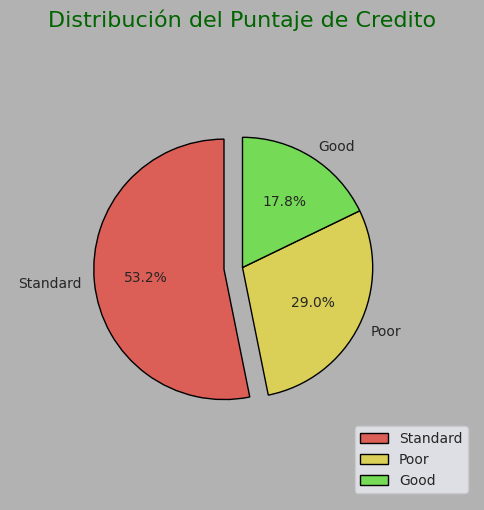

In [ ]:
# @title
# Utilizamos la función para ver en detalle la variable

detallar_columnas(df_credit_train, 'Credit_Score')
print('\n----------------------------------------------------\n')

# Graficamos los datos

fig,ax = plt.subplots(figsize =(6, 8))
fig.set_facecolor('#b2b2b2')
nombres_credit_score = ['Standard', 'Poor', 'Good']

ax.pie(df_credit_train['Credit_Score'].value_counts(),
       labels=nombres_credit_score,
       radius=0.7, startangle=90,
       explode= (0.1,0,0), autopct= "%1.1f%%",
       colors=sns.color_palette("hls",7),
       wedgeprops={"edgecolor":"k"})

# Personalizamos el gráfico

plt.title('Distribución del Puntaje de Credito', color='darkgreen', fontsize=16)
plt.legend(loc="lower right", labels=nombres_credit_score, fontsize=10)

# Mostrar los gráficos

plt.show()

Observamos que la distribución de la variable objetivo esta desbalanceada  tiene una tendencia marcada en un puntaje de crédito estándar. No encontramos datos erróneos o nulos.

<img src="https://ichef.bbci.co.uk/news/640/cpsprodpb/14AF4/production/_129442748_gettyimages-1368517635.jpg" alt="Credit Score Balance">

>- # Edad y ocupación ('Age', 'Occupation')

Analizaremos en detalle las variables de edad y ocupación de los clientes.

Variable:  Age 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  1788 
Distribución de los valores: 
 38      2833
28      2829
31      2806
26      2792
32      2749
        ... 
471        1
1520       1
8663       1
3363       1
1342       1
Name: Age, Length: 1788, dtype: int64

----------------------------------

Variable:  Occupation 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  16 
Distribución de los valores: 
 _______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: Occupation, dtype: int64

----------------------------------------------------



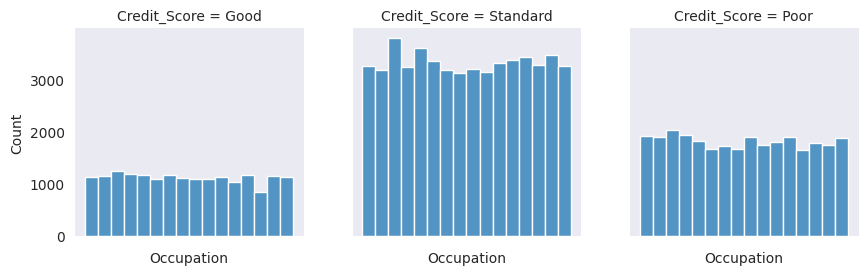

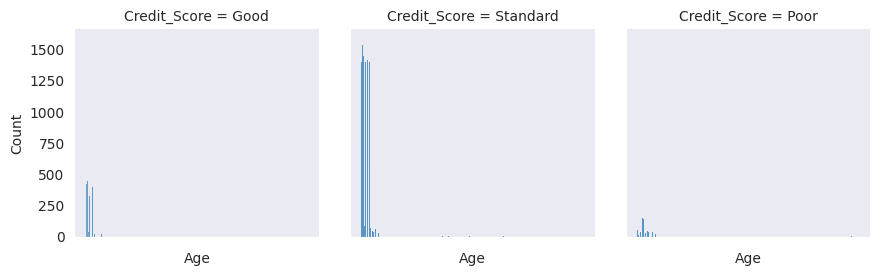

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Age')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Occupation')
print('\n----------------------------------------------------\n')

# Graficamos los datos de las variables

figura1 = sns.FacetGrid(df_credit_train, col='Credit_Score', height=3, aspect=1)
figura1.map(sns.histplot, 'Occupation')
figura1.set(xticklabels=[])

figura2 = sns.FacetGrid(df_credit_train, col='Credit_Score', height=3, aspect=1)
figura2.map(sns.histplot, 'Age')
figura2.set(xticklabels=[])

# Mostrar los gráficos

plt.show()

Podemos observar que la variable ocupación no muestra una diferencia en como se distribuye dentro del puntaje de crédito. No encontramos diferencia en el puntaje de un cliente por su ocupación. La variable no tiene ingresos incorrectos o valores nulos.
En cuanto a la variable Age, encontramos datos erróneos a corregir, lo que también dará datos nulos a manejar y modificar el formato. La visualización no deja datos claros, volveremos a analizar luego de la limpieza de datos.

>- # Ingreso neto mensual y anual ('Monthly_Inhand_Salary', 'Annual_Income')

Analizaremos como se distribuye el puntaje de crédito por los ingresos mensuales y anuales de los clientes, y la calidad y distribución de los datos.

Variable:  Monthly_Inhand_Salary 
Formato:  float64 
Cantidad de valores nulos:  15002 
Valores únicos:  13235 
Distribución de los valores: 
 6769.130000    15
6358.956667    15
2295.058333    15
6082.187500    15
3080.555000    14
               ..
1087.546445     1
3189.212103     1
5640.117744     1
7727.560450     1
2443.654131     1
Name: Monthly_Inhand_Salary, Length: 13235, dtype: int64

----------------------------------

Variable:  Annual_Income 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  18940 
Distribución de los valores: 
 36585.12     16
20867.67     16
17273.83     16
9141.63      15
33029.66     15
             ..
20269.93_     1
15157.25_     1
44955.64_     1
76650.12_     1
4262933.0     1
Name: Annual_Income, Length: 18940, dtype: int64

----------------------------------------------------



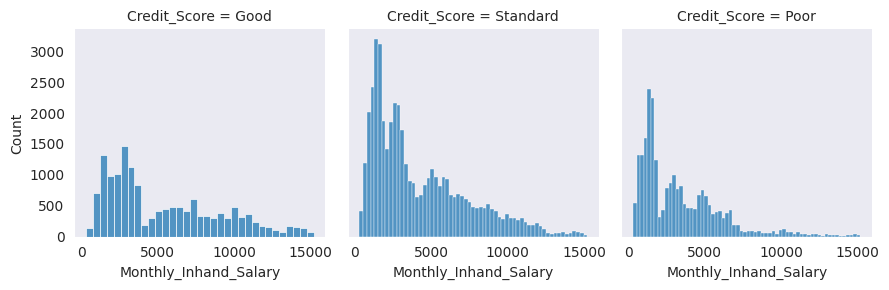

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Monthly_Inhand_Salary')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Annual_Income')
print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable 'Monthly_Inhand_Salary'

figura2 = sns.FacetGrid(df_credit_train, col='Credit_Score')
figura2.map(sns.histplot, 'Monthly_Inhand_Salary')

# Mostramos el gráfico

plt.show()

Encontramos en el ingreso mensual datos nulos a manejar y podemos observar que hay clientes con ingresos altos, con un puntaje bajo de crédito, posibles outliers. En cuanto al ingreso anual, no encontramos datos nulos pero si erróneos, y  su formato es incorrecto. Una limpieza de la data es necesaria para poder obtener grafico relevantes del ingreso anual.

>- # Cantidad de tarjetas y cuentas bancarias ('Num_Credit_Card', 'Num_Bank_Accounts')

Analizaremos en detalle las variables en relación a la cantidad de tarjetas y cuentas bancarias que tienen los clientes.

Variable:  Num_Credit_Card 
Formato:  int64 
Cantidad de valores nulos:  0 
Valores únicos:  1179 
Distribución de los valores: 
 5       18459
7       16615
6       16559
4       14030
3       13277
        ...  
791         1
1118        1
657         1
640         1
679         1
Name: Num_Credit_Card, Length: 1179, dtype: int64

----------------------------------

Variable:  Num_Bank_Accounts 
Formato:  int64 
Cantidad de valores nulos:  0 
Valores únicos:  943 
Distribución de los valores: 
 6       13001
7       12823
8       12765
4       12186
5       12118
        ...  
1626        1
1470        1
887         1
211         1
697         1
Name: Num_Bank_Accounts, Length: 943, dtype: int64

----------------------------------------------------



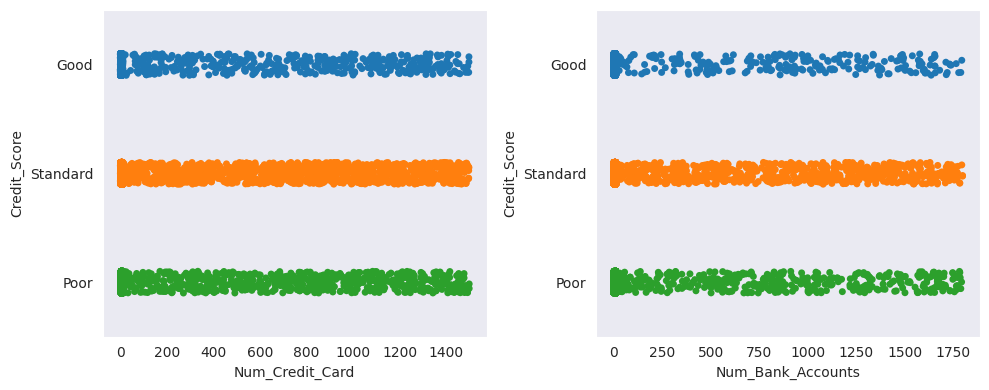

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Num_Credit_Card')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Num_Bank_Accounts')
print('\n----------------------------------------------------\n')

# Crear una figura con dos subgráficos en una fila

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Graficamos los datos de las variables

sns.stripplot(data=df_credit_train,
              x='Num_Credit_Card',
              y='Credit_Score',
              hue="Credit_Score",
              ax=axes[0])

sns.stripplot(data=df_credit_train,
              x='Num_Bank_Accounts',
              y='Credit_Score',
              hue="Credit_Score",
              ax=axes[1])

# Ajustamos el espaciado entre los gráficos

plt.tight_layout()

# Mostrar los gráficos

plt.show()

Tanto la variable 'Num_Bank_Accounts' como 'Num_Credit_Card', tienen valores erróneos que deberían manejarse para poder obtener una visualización clara de los datos. Tienen un rango de datos, que observamos en los valores únicos, que son ilógicos teniendo en cuenta el contenido de las variables.

>- # Prestamos y deuda ('Num_of_Loan', 'Type_of_Loan', 'Outstanding_Debt')

Analizaremos la cantidad de prestamos, el tipo de préstamo y la deuda pendiente de los clientes.

Variable:  Num_of_Loan 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  434 
Distribución de los valores: 
 3        14386
2        14250
4        14016
0        10380
1        10083
         ...  
1320_        1
103          1
1444         1
392          1
966          1
Name: Num_of_Loan, Length: 434, dtype: int64

----------------------------------

Variable:  Type_of_Loan 
Formato:  object 
Cantidad de valores nulos:  11408 
Valores únicos:  6260 
Distribución de los valores: 
 Not Specified                                                                                                                         1408
Credit-Builder Loan                                                                                                                   1280
Personal Loan                                                                                                                         1272
Debt Consolidation Loan                                                       

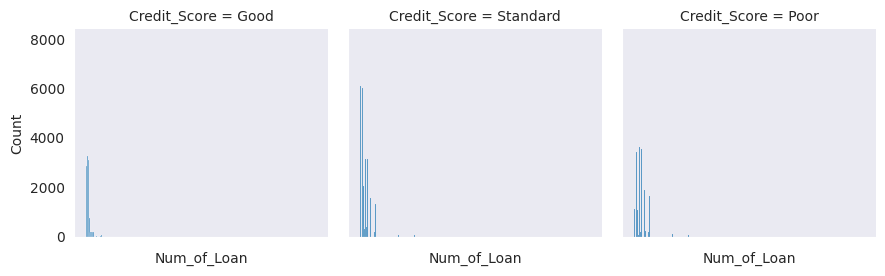

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Num_of_Loan')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Type_of_Loan')
print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable

figura3 = sns.FacetGrid(df_credit_train, col='Credit_Score')
figura3.map(sns.histplot, 'Num_of_Loan')
figura3.set(xticklabels=[])

# Mostrar los gráficos

plt.show()

In [ ]:
# @title
# Utilizamos la función para ver en detalle la variable

detallar_columnas(df_credit_train, 'Outstanding_Debt')
print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable 'Outstanding_Debt'

fig1 = px.histogram(df_credit_train, x='Outstanding_Debt',
                   color='Credit_Score', facet_row='Credit_Score',
                   color_discrete_sequence=px.colors.qualitative.Vivid,
                   width=600, height=400,
                   title='Deuda por Puntaje de Crédito')

fig1.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig1.update_xaxes(visible=False, showticklabels=False)

Variable:  Outstanding_Debt 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  13178 
Distribución de los valores: 
 1360.45     24
460.46      23
1151.7      23
1109.03     23
467.7       16
            ..
245.46_      1
645.77_      1
174.79_      1
1181.13_     1
1013.53_     1
Name: Outstanding_Debt, Length: 13178, dtype: int64

----------------------------------------------------



Encontramos datos incorrectos tanto en la variable 'Num_of_Loan' y 'Outstanding_Debt', así como su formato. Una limpieza de datos es requerida para poder visualizar y obtener algún resultado con ambas variables.
En el caso de 'Type_of_Loan', la cantidad de valores únicos es por la combinación de diferentes prestamos.

>- # Cantidad de días y pagos atrasados ('Delay_from_due_date', 'Num_of_Delayed_Payment')

Analizaremos la cantidad de días de atraso de la fecha de pago, así como la cantidad de pagos atrasados de los clientes.

Variable:  Delay_from_due_date 
Formato:  int64 
Cantidad de valores nulos:  0 
Valores únicos:  73 
Distribución de los valores: 
  15    3596
 13    3424
 8     3324
 14    3313
 10    3281
       ... 
-4       62
 65      56
-5       33
 66      32
 67      22
Name: Delay_from_due_date, Length: 73, dtype: int64

----------------------------------

Variable:  Num_of_Delayed_Payment 
Formato:  object 
Cantidad de valores nulos:  7002 
Valores únicos:  749 
Distribución de los valores: 
 19      5327
17      5261
16      5173
10      5153
18      5083
        ... 
848_       1
4134       1
1530       1
1502       1
2047       1
Name: Num_of_Delayed_Payment, Length: 749, dtype: int64

----------------------------------------------------



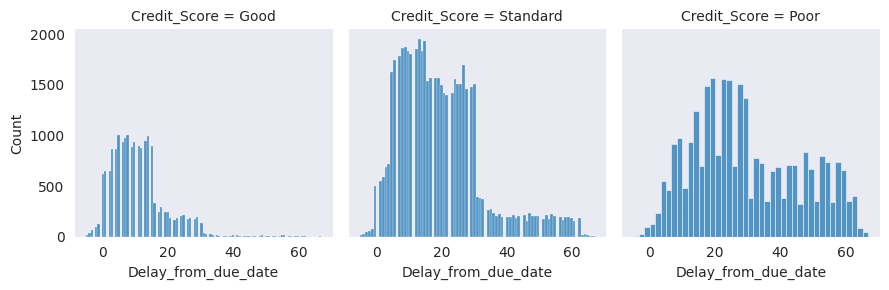

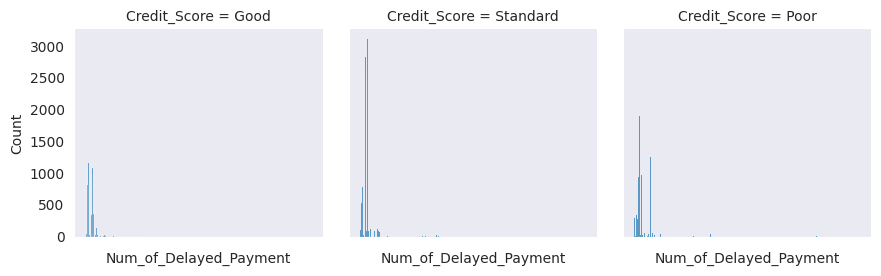

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Delay_from_due_date')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Num_of_Delayed_Payment')
print('\n----------------------------------------------------\n')

# Graficamos los datos de las variables

figura4 = sns.FacetGrid(df_credit_train, col='Credit_Score', height=3, aspect=1)
figura4.map(sns.histplot, 'Delay_from_due_date')

figura5 = sns.FacetGrid(df_credit_train, col='Credit_Score', height=3, aspect=1)
figura5.map(sns.histplot, 'Num_of_Delayed_Payment')
figura5.set(xticklabels=[])

# Mostrar los gráficos

plt.show()

En los días de atraso de pago no hay datos nulos, pero si posibles erróneos, ya que encontramos valores negativos y algunos valores demasiado altos. Una limpieza y división por grupos de días, es necesario para obtener una mejor visualización y análisis. En cuanto a la cantidad de pagos atrasados, encontramos datos nulos y erróneos, además de que el formato es incorrecto. La limpieza de datos para esta variable es necesaria para poder hacer un análisis relevante.

>- # Cantidad de consultas de crédito y clasificación del crédito variado ('Num_Credit_Inquiries', 'Credit_Mix')

Analizaremos las consultas de crédito y el mix de crédito de los clientes.

Variable:  Num_Credit_Inquiries 
Formato:  float64 
Cantidad de valores nulos:  1965 
Valores únicos:  1223 
Distribución de los valores: 
 4.0       11271
3.0        8890
6.0        8111
7.0        8058
2.0        8028
          ...  
1721.0        1
1750.0        1
2397.0        1
621.0         1
74.0          1
Name: Num_Credit_Inquiries, Length: 1223, dtype: int64

----------------------------------

Variable:  Credit_Mix 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  4 
Distribución de los valores: 
 Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64

----------------------------------------------------



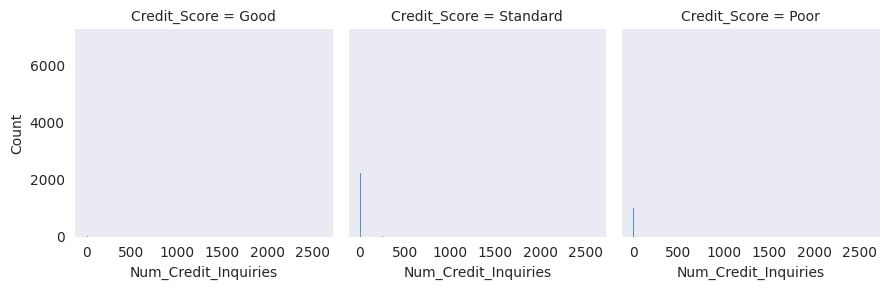

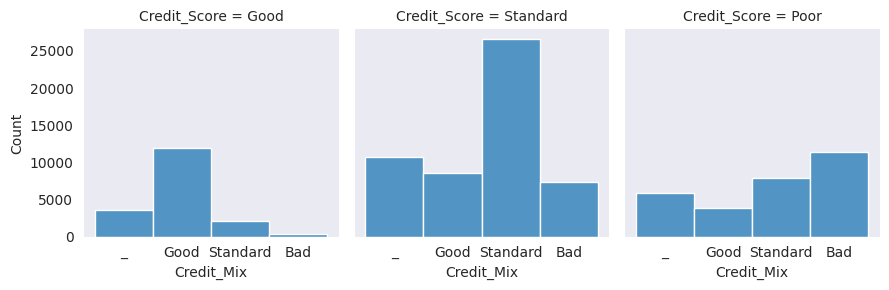

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Num_Credit_Inquiries')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Credit_Mix')
print('\n----------------------------------------------------\n')

# Graficamos los datos de las variables

figura6 = sns.FacetGrid(df_credit_train, col='Credit_Score')
figura6.map(sns.histplot, 'Num_Credit_Inquiries')

figura7 = sns.FacetGrid(df_credit_train, col='Credit_Score')
figura7.map(sns.histplot, 'Credit_Mix')

# Mostrar los gráficos

plt.show()

Al igual que otras variables analizadas anteriormente, hay datos nulos y valores muy altos erróneos a corregir, teniendo en cuenta que una persona recibe dos a tres inquiries al año, que no nos permiten hacer un análisis visua relevante. Encontramos que el formato en este caso es correcto. En cuanto a el mix de crédito, no encontramos datos nulos pero si un ingreso incorrecto que podríamos manejar por el groupby del cliente.

>- # Comportamiento de pago ('Payment_of_Min_Amount', 'Payment_Behaviour')

Exploraremos el comportamiento de pago de los clientes.

Variable:  Payment_of_Min_Amount 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  3 
Distribución de los valores: 
 Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64

----------------------------------

Variable:  Payment_Behaviour 
Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  7 
Distribución de los valores: 
 Low_spent_Small_value_payments      25513
High_spent_Medium_value_payments    17540
Low_spent_Medium_value_payments     13861
High_spent_Large_value_payments     13721
High_spent_Small_value_payments     11340
Low_spent_Large_value_payments      10425
!@9#%8                               7600
Name: Payment_Behaviour, dtype: int64

----------------------------------------------------



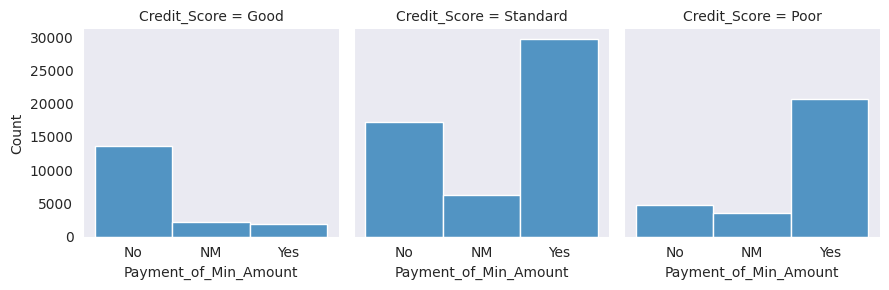


----------------------------------------------------



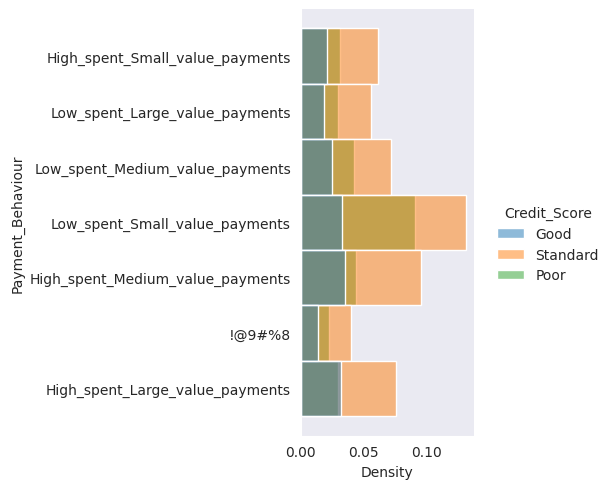

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Payment_of_Min_Amount')
print('\n----------------------------------\n')
detallar_columnas(df_credit_train, 'Payment_Behaviour')
print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable

figura8 = sns.FacetGrid(df_credit_train, col='Credit_Score')
figura8.map(sns.histplot, 'Payment_of_Min_Amount')

# Mostrar el gráfico

plt.show()

print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable

sns.displot(df_credit_train,
            y='Payment_Behaviour',
            hue='Credit_Score',
            stat="density")

Observamos que en el caso de 'Payment_of_Min_Amount' no encontramos datos incorrectos o nulos. El valor de NM podría ser 'no mencionado', 'no el mínimo' o un posible dato erróneo. El comportamiento de pago, no muestra datos nulos, pero si un ingreso incorrecto que se repite, que habría que manejar con la moda del grupo por el ID de cliente. Luego de la limpieza de datos podremos obtener mejores resultados de visualización.

>- # Antigüedad de la historia de crédito ('Credit_History_Age')

Analizaremos la antigüedad de la historia de crédito de los clientes.

Variable:  Credit_History_Age 
Formato:  object 
Cantidad de valores nulos:  9030 
Valores únicos:  404 
Distribución de los valores: 
 15 Years and 11 Months    446
19 Years and 4 Months     445
19 Years and 5 Months     444
17 Years and 11 Months    443
19 Years and 3 Months     441
                         ... 
0 Years and 3 Months       20
0 Years and 2 Months       15
33 Years and 7 Months      14
33 Years and 8 Months      12
0 Years and 1 Months        2
Name: Credit_History_Age, Length: 404, dtype: int64

----------------------------------------------------



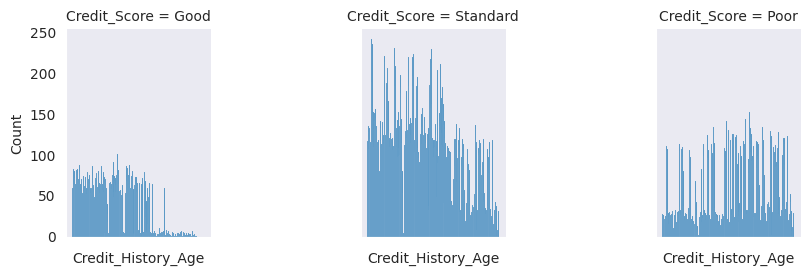

In [ ]:
# @title
# Utilizamos la función para ver en detalle las variables

detallar_columnas(df_credit_train, 'Credit_History_Age')
print('\n----------------------------------------------------\n')

# Graficamos los datos de la variable

figura9 = sns.FacetGrid(df_credit_train, col='Credit_Score', height=3, aspect=1)
figura9.map(sns.histplot, 'Credit_History_Age')
figura9.set(xticklabels=[])

Encontramos valores nulos a manejar y no vemos datos incorrectos, aunque el formato de la variable es correcto, se podría transformar a tiempo para obtener un mejor análisis y visualizaciones.

---

<center>
<h1><font color= "green" size="+5">Limpieza y preparación de los datos</font></h1>
<p></p>
<img src="https://assets-global.website-files.com/5fbe376a36d4106214faaf3c/61e5f5a91735d6cc7515bcc6_0A4zVj7AA0kGao3qrDORDaRwOL70Bt5IiwEj18h1fZM23OLyWYUcanDfpFJtvANhBUR3gBUFeuGy1WchKVZFszv1D_BpOlIozOcZkG3ccKOpx_dmefqsVWCtjuouruF6K3EiBDOI.png" alt="Data Cleaning">
</center>

A partir del análisis exploratorio de datos realizaremos la limpieza correspondiente, tomaremos la información detallada para limpiar cada variable.
Removeremos algunos atributos que no contribuyen al análisis, para mantener la base de datos con todos los factores que consideramos relevantes.

- 1)Información de la data

- 2)Manejamos los datos nulos

- 3)Corregimos los datos erróneos

- 4)Cambiamos el formato de las variables

- 5)Retiramos las columnas que no utilizaremos

In [ ]:
# Revisamos para encontrar los valores erroneos

df_credit_train.describe(exclude = np.number).T

,count,unique,top,freq
ID,100000,100000,0x1602,1
Customer_ID,100000,12500,CUS_0xd40,8
Month,100000,8,January,12500
Name,90015,10139,Langep,44
Age,100000,1788,38,2833
SSN,100000,12501,#F%$D@*&8,5572
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408


In [ ]:
# Creamos una función para ver en detalle los datos de cada variable

def detallar_clean_column(df, columna):

    print(f"\nFormato: ", df[columna].dtype,
          "\nCantidad de valores nulos: ", df[columna].isnull().sum(),
          "\nValores únicos: ", df[columna].nunique(),
          "\nValores: ", df[columna].unique())

In [ ]:
# Realizamos una copia del dataset original

df_credit_clean = df_credit_train.copy()

In [ ]:
# Revisamos que no hallan datos duplicados

print(f'Longitud: {len(df_credit_clean.duplicated())}')

print(f'Duplicados: {df_credit_clean.duplicated().sum()}')

Longitud: 100000
Duplicados: 0


In [ ]:
# Revisamos los datos nulos

datos_nulos = pd.DataFrame(
    {f'Cantidad de Datos Nulos' : df_credit_clean.isnull().sum(),
     'Porcentaje de Datos Nulos' : (df_credit_clean.isnull().sum()) / (len(df_credit_clean)) * (100)}
    )

print(datos_nulos)

                          Cantidad de Datos Nulos  Porcentaje de Datos Nulos
ID                                              0                      0.000
Customer_ID                                     0                      0.000
Month                                           0                      0.000
Name                                         9985                      9.985
Age                                             0                      0.000
SSN                                             0                      0.000
Occupation                                      0                      0.000
Annual_Income                                   0                      0.000
Monthly_Inhand_Salary                       15002                     15.002
Num_Bank_Accounts                               0                      0.000
Num_Credit_Card                                 0                      0.000
Interest_Rate                                   0                      0.000

### Name (Nombre)

In [ ]:
# Remplazamos los valores nulos por la moda

df_credit_clean['Name'] = (
    df_credit_clean.groupby('Customer_ID')['Name'].transform(
        lambda v: v.mode()[0]).astype("category")
)

### Age (Edad)

In [ ]:
# Removemos el símbolo erróneo que aparece y Cambiamos el formato de la columna

df_credit_clean['Age'] = (
    df_credit_clean['Age'].str.replace('_', '').astype('int64')
)

# Remplazamos los valores erróneos de la variable por la moda del ID Cliente

df_credit_clean['Age'] = (
    df_credit_clean['Age'].apply(lambda x: np.NaN if x<0 or x>100 else x)
)
df_credit_clean['Age'] = (
    df_credit_clean.groupby('Customer_ID')['Age'].transform(lambda v: v.mode()[0])
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Age')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  43 
Valores:  [23. 28. 34. 55. 21. 31. 30. 44. 40. 33. 35. 39. 37. 20. 46. 26. 41. 32.
 48. 43. 36. 16. 18. 42. 22. 19. 15. 27. 38. 14. 25. 45. 47. 17. 53. 24.
 54. 29. 49. 51. 50. 52. 56.]


In [ ]:
# Dividimos la variable Age en grupos etarios

def separar_grupos_etarios(fila):
    if fila['Age'] >= 0 and fila['Age'] <=26:
        return 'Joven(14-26)'
    elif fila['Age'] >= 27 and fila['Age'] <=59:
        return 'Adulto(27-59)'
    else:
        return 'Mayor(60-100)'

df_credit_clean['Grupo_Etario'] = (
    df_credit_clean.apply(separar_grupos_etarios, axis=1)
)

df_credit_clean['Grupo_Etario'] = (
    df_credit_clean['Grupo_Etario'].astype("category")
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Grupo_Etario')


Formato:  category 
Cantidad de valores nulos:  0 
Valores únicos:  2 
Valores:  ['Joven(14-26)', 'Adulto(27-59)']
Categories (2, object): ['Adulto(27-59)', 'Joven(14-26)']


### Annual_Income (Ingraso anual)

In [ ]:
# Removemos el símbolo erróneo que aparece y Cambiamos el formato de la columna

df_credit_clean['Annual_Income'] = (
    df_credit_clean['Annual_Income'].str.replace('_', '').astype('float64')
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Annual_Income')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  13487 
Valores:  [ 19114.12  34847.84 143162.64 ...  37188.1   20002.88  39628.99]


### Monthly_Inhand_Salary (Salario mensual neto)

In [ ]:
# Remplazamos los valores Nulos por la moda

df_credit_clean['Monthly_Inhand_Salary'] = (
    df_credit_clean.groupby('Customer_ID')['Monthly_Inhand_Salary'].transform(
        lambda v: v.mode()[0])
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Monthly_Inhand_Salary')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  12489 
Valores:  [ 1824.84333333  3037.98666667 12187.22       ...  3097.00833333
  1929.90666667  3359.41583333]


### Num_Bank_Accounts (Cantidad de cuentas bancarias)

In [ ]:
# Remplazamos los valores erróneos de la variable por la moda

df_credit_clean['Num_Bank_Accounts'] = (
    df_credit_clean['Num_Bank_Accounts'].apply(
        lambda x: np.NaN if x<0 or x>11 else x)
)

df_credit_clean['Num_Bank_Accounts'] = (
    df_credit_clean.groupby('Customer_ID')['Num_Bank_Accounts'].transform(
        lambda v: v.mode()[0])
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Num_Bank_Accounts')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  11 
Valores:  [ 3.  2.  1.  7.  4.  0.  8.  5.  6.  9. 10.]


### Num_Credit_Card (Cantidad de tarjetas de credito)

In [ ]:
# Remplazamos los valores erróneos de la variable por la moda

df_credit_clean['Num_Credit_Card'] = (
    df_credit_clean['Num_Credit_Card'].apply(
        lambda x: np.NaN if x<1 or x>10 else x)
)

df_credit_clean['Num_Credit_Card'] = (
    df_credit_clean.groupby('Customer_ID')['Num_Credit_Card'].transform(
        lambda v: v.mode()[0])
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Num_Credit_Card')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  10 
Valores:  [ 4.  5.  1.  7.  6.  8.  3.  9.  2. 10.]


### Num_of_Loan (Cantidad de prestamos)

In [ ]:
# Removemos el símbolo erróneo que aparece en algunos valores y cambiamos el formato

df_credit_clean['Num_of_Loan'] = (
    df_credit_clean['Num_of_Loan'].str.replace('_', '').astype('int64')
)

# Remplazamos los valores erróneos de la variable por la moda

df_credit_clean['Num_of_Loan'] = (
    df_credit_clean['Num_of_Loan'].apply(lambda x: np.NaN if x<0 or x>10 else x)
)
df_credit_clean['Num_of_Loan'] = (
    df_credit_clean.groupby('Customer_ID')['Num_of_Loan'].transform(lambda v: v.mode()[0])
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Num_of_Loan')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  10 
Valores:  [4. 1. 3. 0. 2. 7. 5. 6. 8. 9.]


### Type_of_Loan (Tipo de préstamo)

In [ ]:
# Remplazamos los símbolos que no requerimos de algunos valores

df_credit_clean['Type_of_Loan'] = (
    df_credit_clean['Type_of_Loan'].str.replace(', ', ',').str.replace('and ', '')
)

# Rellenamos los valores NaN de la variable con la moda

df_credit_clean['Type_of_Loan'] = (
    df_credit_clean.groupby('Customer_ID')['Type_of_Loan'].fillna(
        lambda v: v.mode()[0])
)

# Revisamos la variable

detallar_clean_column(df_credit_clean, 'Type_of_Loan')


Formato:  object 
Cantidad de valores nulos:  0 
Valores únicos:  6261 
Valores:  ['Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan'
 'Credit-Builder Loan' 'Auto Loan,Auto Loan,Not Specified' ...
 'Home Equity Loan,Auto Loan,Auto Loan,Auto Loan'
 'Payday Loan,Student Loan,Mortgage Loan,Not Specified'
 'Personal Loan,Auto Loan,Mortgage Loan,Student Loan,Student Loan']


### Delay_from_due_date (Retraso desde la fecha de vencimiento)

In [ ]:
# Remplazamos los valores erróneos de la variable por NaN y rellenamos con la función ffill

df_credit_clean['Delay_from_due_date'] = (
    df_credit_clean['Delay_from_due_date'].apply(lambda x: np.NaN if x<0 else x)
)
df_credit_clean['Delay_from_due_date'] = (
    df_credit_clean['Delay_from_due_date'].ffill(axis=0)
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Delay_from_due_date')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  68 
Valores:  [ 3.  5.  6.  8.  7. 13. 10.  0.  4.  9.  1. 12. 11. 30. 31. 34. 27. 14.
  2. 16. 17. 15. 23. 22. 21. 18. 19. 52. 51. 48. 53. 26. 43. 28. 25. 20.
 47. 46. 49. 24. 61. 29. 50. 58. 45. 59. 55. 56. 57. 54. 62. 65. 64. 67.
 36. 41. 33. 32. 39. 44. 42. 60. 35. 38. 63. 40. 37. 66.]


### Num_of_Delayed_Payment (Cantidad de pagos retrasados)

In [ ]:
# Removemos el símbolo erróneo que aparece en algunos valores y cambiamos el formato

df_credit_clean['Num_of_Delayed_Payment'] = (
    df_credit_clean['Num_of_Delayed_Payment'].str.replace('_', '').astype('float64')
)

# Remplazamos los valores erróneos de la variable por NaN y rellenamos con la función ffill

df_credit_clean['Num_of_Delayed_Payment'] = (
    df_credit_clean['Num_of_Delayed_Payment'].apply(lambda x: np.NaN if x<0 or x>365 else x)
)
df_credit_clean['Num_of_Delayed_Payment'] = (
    df_credit_clean['Num_of_Delayed_Payment'].ffill(axis=0)
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Num_of_Delayed_Payment')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  82 
Valores:  [  7.   4.   8.   6.   1.   3.   0.   5.   9.  12.  15.  17.  10.   2.
  11.  14.  20.  22.  13.  16.  18.  19.  23.  24.  21.  26.  25. 183.
  27.  28. 132. 306. 182.  88. 211.  84. 166. 359. 186. 281. 192. 142.
 264.  72.  47. 337. 290.  52.  49. 328. 252. 271. 273. 130. 294.  98.
  80. 195. 320. 196. 102. 133. 210. 121. 197. 265. 107. 223. 309.  46.
 238. 351. 283.  94. 106.  85. 175. 162.  86. 145. 217. 221.]


### Changed_Credit_Limit (Cambiar límite de crédito)

In [ ]:
# Remplazamos los valores erróneos de la variable por NaN y rellenamos con la función ffill

df_credit_clean['Changed_Credit_Limit'] = (
    df_credit_clean['Changed_Credit_Limit'].apply(
        lambda x: np.NaN if x=='_' else x).astype('float64')
)
df_credit_clean['Changed_Credit_Limit'] = (
    df_credit_clean['Changed_Credit_Limit'].ffill(axis=0)
)

#Corroboramos los datos de la variable.

detallar_clean_column(df_credit_clean, 'Changed_Credit_Limit')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  4383 
Valores:  [11.27  6.27  9.27 ... 17.51 25.16 21.17]


### Num_Credit_Inquiries (Cantidad de consultas de credito)

In [ ]:
# Remplazamos los valores erróneos de la variable por NaN y rellenamos con la función ffill

df_credit_clean['Num_Credit_Inquiries'] = (
    df_credit_clean['Num_Credit_Inquiries'].apply(
        lambda x: np.NaN if x<0 or x>20 else x)
)

df_credit_clean['Num_Credit_Inquiries'] = (
    df_credit_clean['Num_Credit_Inquiries'].ffill(axis=0)
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Num_Credit_Inquiries')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  18 
Valores:  [ 4.  2.  3.  5.  9.  8.  7.  6.  0.  1. 10. 11. 12. 17. 13. 14. 16. 15.]


### Credit_Mix (Mezcla de crédito)

In [ ]:
# Remplazamos los valores erróneos de la variable por NaN

df_credit_clean['Credit_Mix'] = (
    df_credit_clean['Credit_Mix'].apply(
        lambda x: np.NaN if x=='_' else x)
)

# Remplazamos los valores nulos de la variable por la moda

df_credit_clean['Credit_Mix'] = (
    df_credit_clean.groupby('Customer_ID')['Credit_Mix'].transform(
        lambda v: v.mode()[0]).astype("category")
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Credit_Mix')


Formato:  category 
Cantidad de valores nulos:  0 
Valores únicos:  3 
Valores:  ['Good', 'Standard', 'Bad']
Categories (3, object): ['Bad', 'Good', 'Standard']


### Outstanding_Debt (Deuda pendiente)

In [ ]:
# Removemos el símbolo erróneo que aparece en algunos valores y cambiamos el formato

df_credit_clean['Outstanding_Debt'] = (
    df_credit_clean['Outstanding_Debt'].str.replace('_', '').astype('float64')
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Outstanding_Debt')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  12203 
Valores:  [ 809.98  605.03 1303.01 ...  620.64 3571.7   502.38]


### Credit_History_Age (Edad del historial crediticio)

In [ ]:
# Creamos una función para ayudarnos a convertir y manejar la variable

def Month_Converter(x):
    if pd.notnull(x):
        num1 = int(x.split(' ')[0])
        num2 = int(x.split(' ')[3])
        return (num1*12)+num2
    else:
        return x

# Completamos los valores nulos

df_credit_clean['Credit_History_Age'] = (
    df_credit_clean.groupby('Customer_ID', group_keys=False)['Credit_History_Age'].apply(
        lambda x: x.interpolate().bfill().ffill())
)

# Convertimos los valores para un mejor manejo

df_credit_clean['Credit_History_Age'] = (
    df_credit_clean.Credit_History_Age.apply(lambda x: Month_Converter(x)).astype(float)
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Credit_History_Age')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  404 
Valores:  [265. 267. 268. 269. 270. 271. 319. 320. 321. 322. 323. 324. 325. 326.
 213. 214. 215. 217. 218. 219. 220. 207. 208. 209. 210. 211. 212. 368.
 369. 370. 371. 372. 373. 374. 375. 384. 386. 387. 389. 390. 367. 176.
 177. 178. 179. 180. 181. 182. 256. 257. 258. 259. 260. 261. 262. 263.
 318. 230. 231. 232. 233. 234. 235. 236. 305. 306. 307. 308. 309. 310.
 311. 312. 327. 328. 329. 107. 108. 109. 110. 111. 112. 114. 221. 222.
 224. 225. 202. 203. 204. 205. 206. 350. 351. 352. 354. 356. 357.  77.
  78.  79.  80.  81.  82.  83.  84. 330. 331. 332. 333. 223. 237. 238.
 121. 122. 123. 124. 125. 126. 127. 128. 393. 394. 395. 396. 397. 400.
 147. 148. 149. 150. 151. 152. 154. 153. 164. 167. 168. 169. 170. 171.
 363. 364. 365. 366. 105. 106. 226. 227. 228. 229. 104. 157. 158. 159.
 161. 162. 163. 264. 313. 314. 160. 165. 335. 336. 337. 338. 339. 340.
 341. 342.  94.  95.  96.  97.  98.  99. 100. 101. 291. 292. 293.

### Payment_of_Min_Amount (Pago del monto mínimo)

In [ ]:
# Removemos el símbolo erróneo que aparece en algunos valores y cambiamos el formato

df_credit_clean['Payment_of_Min_Amount'] = (
    df_credit_clean['Payment_of_Min_Amount'].str.replace('NM', 'No').astype("category")
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Payment_of_Min_Amount')


Formato:  category 
Cantidad de valores nulos:  0 
Valores únicos:  2 
Valores:  ['No', 'Yes']
Categories (2, object): ['No', 'Yes']


### Amount_invested_monthly (Monto invertido mensualmente)

In [ ]:
# Removemos los valores erróneo que aparecen en la variable

df_credit_clean['Amount_invested_monthly'] = (
    df_credit_clean['Amount_invested_monthly'].apply(
        lambda x: np.NaN if x=='__10000__' else x).astype('float64')
)

# Remplazamos los valores nulos por el promedio invertido

df_credit_clean['Amount_invested_monthly'] = (
    df_credit_clean['Amount_invested_monthly'].fillna(
        df_credit_clean.groupby('Customer_ID')['Amount_invested_monthly'].transform('mean'))
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Amount_invested_monthly')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  97528 
Valores:  [ 80.41529544 118.28022162  81.69952126 ...  24.02847745 251.6725822
 167.16386516]


### Payment_Behaviour (Comportamiento de pago)

In [ ]:
# Remplazamos los valores erróneos de la variable por NaN

df_credit_clean['Payment_Behaviour'] = (
    df_credit_clean['Payment_Behaviour'].apply(
        lambda x: np.NaN if x=='!@9#%8' else x)
)

# Remplazamos los valores nulos por la moda

df_credit_clean['Payment_Behaviour'] = (
    df_credit_clean.groupby('Customer_ID')['Payment_Behaviour'].transform(
        lambda v: v.mode()[0]).astype("category")
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Payment_Behaviour')


Formato:  category 
Cantidad de valores nulos:  0 
Valores únicos:  6 
Valores:  ['High_spent_Medium_value_payments', 'High_spent_Large_value_payments', 'High_spent_Small_value_payments', 'Low_spent_Large_value_payments', 'Low_spent_Small_value_payments', 'Low_spent_Medium_value_payments']
Categories (6, object): ['High_spent_Large_value_payments', 'High_spent_Medium_value_payments',
                         'High_spent_Small_value_payments', 'Low_spent_Large_value_payments',
                         'Low_spent_Medium_value_payments', 'Low_spent_Small_value_payments']


### Monthly_Balance (Saldo Mensual)

In [ ]:
# Removemos los valores erróneo que aparecen en la variable

df_credit_clean['Monthly_Balance'] = (
    df_credit_clean['Monthly_Balance'].apply(
        lambda x: np.NaN if x=='__-333333333333333333333333333__' else x).astype('float64')
)

# Remplazamos los valores nulos por el promedio del cliente

df_credit_clean['Monthly_Balance'] = (
    df_credit_clean['Monthly_Balance'].fillna(
        df_credit_clean.groupby('Customer_ID')['Monthly_Balance'].transform('mean'))
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Monthly_Balance')


Formato:  float64 
Cantidad de valores nulos:  0 
Valores únicos:  99759 
Valores:  [312.49408868 284.6291625  331.20986285 ... 516.80908327 319.16497853
 393.67369556]


### Credit_Score (Puntaje de crédito)

In [ ]:
# Cambiamos el formato de la variable

df_credit_clean['Credit_Score'] = (
    df_credit_clean['Credit_Score'].astype("category")
)

# Corroboramos los datos de la variable

detallar_clean_column(df_credit_clean, 'Credit_Score')


Formato:  category 
Cantidad de valores nulos:  0 
Valores únicos:  3 
Valores:  ['Good', 'Standard', 'Poor']
Categories (3, object): ['Good', 'Poor', 'Standard']


In [ ]:
# Revisamos los valores numéricos

df_credit_clean.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000
mean,33.274560,1.764157e+05,4197.328114,5.367840,5.532480,72.466040,3.532880,21.108440,13.447360,10.389784,5.780270,1426.220376,32.285173,221.27786,1403.118217,195.751837,403.120320
std,10.764438,1.429618e+06,3186.918569,2.592597,2.066153,466.422621,2.446356,14.822424,7.869476,6.790119,3.862931,1155.129026,5.116875,99.67973,8306.041270,195.116198,214.014558
min,14.000000,7.005930e+03,303.645417,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,1.00000,0.000000,0.000000,0.007760
25%,24.000000,1.945750e+04,1626.719792,3.000000,4.000000,8.000000,2.000000,10.000000,9.000000,5.330000,3.000000,566.072500,28.052567,145.00000,30.306660,74.599540,270.189030
50%,33.000000,3.757861e+04,3092.270000,5.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.400000,5.000000,1166.155000,32.305784,220.00000,69.249473,131.209101,337.114461
75%,42.000000,7.279092e+04,5958.695625,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,14.860000,8.000000,1945.962500,36.496663,302.00000,161.224249,239.479981,471.570652
max,56.000000,2.419806e+07,15204.633333,10.000000,10.000000,5797.000000,9.000000,67.000000,359.000000,36.970000,17.000000,4998.070000,50.000000,404.00000,82331.000000,1977.326102,1602.040519


In [ ]:
print(df_credit_clean.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   ID                        100000 non-null  object  
 1   Customer_ID               100000 non-null  object  
 2   Month                     100000 non-null  object  
 3   Name                      100000 non-null  category
 4   Age                       100000 non-null  float64 
 5   SSN                       100000 non-null  object  
 6   Occupation                100000 non-null  object  
 7   Annual_Income             100000 non-null  float64 
 8   Monthly_Inhand_Salary     100000 non-null  float64 
 9   Num_Bank_Accounts         100000 non-null  float64 
 10  Num_Credit_Card           100000 non-null  float64 
 11  Interest_Rate             100000 non-null  int64   
 12  Num_of_Loan               100000 non-null  float64 
 13  Type_of_Loan              1000

In [ ]:
# Guardamos una copia del dataframe limpio

df_credit_clean.to_csv('df_credit_clean.csv', encoding='utf-8')

 Hemos desarrollado y completado la limpieza de datos, además de haber incluido nuevas variables, y mejorado y reducido el código con respecto a lo hecho hasta la segunda preentrega del proyecto final, dejando algunas variables sin modificar ya que no son relevantes para nuestro análisis, pero que por el momento no las removeremos hasta haber terminado la exploración de los datos. También guardamos una copia del dataset limpio para poder utilizarlo en un futuro análisis y/o proyecto.

---

<center>
<h1><font color= "green" size="+5">Preguntas o Hipótesis de interés</font></h1>
<p></p>
<img src="https://financejar.com/wp-content/uploads/2022/07/what-is-a-fair-credit-score-832x400.jpg" alt="Preguntas">
</center>

¿Cuál es el ingreso anual promedio por rango etario de los clientes?

¿Cómo se distribuyen los salarios entre los diferentes rangos etarios?

¿Cuál es el ingreso mensual promedio por Profesión de los clientes?

¿Hay alguna relación entre los ingresos mensuales y las deudas pendientes de los clientes?

¿Hay una relación entre el numero de prestamos y la deuda pendiente de los clientes?

¿Cuál es la evolución de las deudas pendientes de los clientes a lo largo de los meses?

¿Hay una relación entre cuanto debe una persona y el puntaje de crédito que tiene?

¿Cuáles son los patrones de Frecuencia de utilización del crédito?

¿Una alta frecuencia de utilización del crédito puede afectar el puntaje?

¿Podemos predecir el puntaje de crédito de un cliente basándonos en atributos específicos?

¿Qué variables o factores son los que mas contribuyen para determinar el puntaje de crédito?

¿Cual es el comportamiento de pago de los clientes y como influye en el puntaje de crédito?

¿Hay una relación entre las inversiones de los clientes y su balance mensual?

¿Cuánto influye la cantidad de días atrasados de pago en el puntaje de crédito?

¿Cuál es la influencia y la relación del historial del crédito con el puntaje de crédito?


Algunas de estas preguntas las hemos analizado previamente. El objetivo ahora es hacer un análisis mas profundo y plantear nuevas incógnitas o hipótesis que nos permitan predecir el puntaje de crédito de una persona.

Para tener una idea básica sobre como se  relacionan varios factores con el puntaje de crédito, como la ocupación del cliente o  el rango etario, sus ingresos mensuales, radio de utilización del crédito, la cantidad de cuentas bancarias o de tarjetas de crédito que un cliente tiene, sus prestamos y deudas, o su comportamiento de pago, podríamos chequear los valores promedio de las variables por cada puntaje de crédito. Esto, además, nos permitirá observar que papel cumplen algunos atributos a la hora de calcular el puntaje.

In [ ]:
# Creamos el dataset para el analisis

df_credit_new = df_credit_clean.copy()

In [ ]:
# Analizamos la correlación de las variables

df_credit_new.corr(numeric_only=True)

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Age,1.000000,0.006343,0.090753,-0.190857,-0.148723,-0.001163,-0.213684,-0.174081,-0.145192,-0.156324,-0.253042,-0.202274,0.025508,0.234331,0.001663,0.058183,0.117480
Annual_Income,0.006343,1.000000,0.030471,-0.009194,-0.001953,-0.002908,-0.005428,-0.010631,-0.005515,0.000749,-0.009612,-0.003706,0.010316,-0.000734,-0.000248,0.020058,0.020030
Monthly_Inhand_Salary,0.090753,0.030471,1.000000,-0.283063,-0.217027,-0.005746,-0.254316,-0.248931,-0.221302,-0.174529,-0.278230,-0.269037,0.176105,0.271441,0.007821,0.635883,0.705434
Num_Bank_Accounts,-0.190857,-0.009194,-0.283063,1.000000,0.442451,0.010016,0.472504,0.558652,0.473753,0.330142,0.516199,0.507042,-0.071864,-0.485277,-0.006337,-0.184411,-0.300788
Num_Credit_Card,-0.148723,-0.001953,-0.217027,0.442451,1.000000,0.009184,0.417912,0.478361,0.332533,0.252166,0.457735,0.490382,-0.055303,-0.417036,-0.006702,-0.144648,-0.238881
Interest_Rate,-0.001163,-0.002908,-0.005746,0.010016,0.009184,1.000000,0.007900,0.009714,0.010919,0.001180,0.009745,0.010721,-0.000359,-0.010043,0.002517,-0.003746,-0.007840
Num_of_Loan,-0.213684,-0.005428,-0.254316,0.472504,0.417912,0.007900,1.000000,0.500710,0.373004,0.368850,0.563707,0.638713,-0.100469,-0.605723,-0.001266,-0.166538,-0.435084
Delay_from_due_date,-0.174081,-0.010631,-0.248931,0.558652,0.478361,0.009714,0.500710,1.000000,0.425273,0.292004,0.536890,0.571341,-0.063693,-0.490781,-0.003781,-0.164052,-0.281587
Num_of_Delayed_Payment,-0.145192,-0.005515,-0.221302,0.473753,0.332533,0.010919,0.373004,0.425273,1.000000,0.253813,0.391801,0.396333,-0.059147,-0.379088,-0.005697,-0.145192,-0.237328
Changed_Credit_Limit,-0.156324,0.000749,-0.174529,0.330142,0.252166,0.001180,0.368850,0.292004,0.253813,1.000000,0.377046,0.457291,-0.047962,-0.423709,-0.002150,-0.115973,-0.204772


Crearemos algunas funciones para hacer un análisis estadístico y mas profundo de las variables, y así,  poder entender mejor como se comportan los datos, descubrir patrones y tendencias subyacentes (Análisis: Univariado, Bivariado y Multivariado).


In [ ]:
# Función para realizar el test de Shapiro

def test_shapiro(df, columna):
    """
    Realizar el test de Shapiro
    Seleccionamos una muestra no mayor a 50
    Imprimimos los resultados
    Los comparamos con el nivel de significancia de 0.05
    Corroboramos el test por medio de un QQ plot
    """
    muestra = df[columna].sample(n=50, replace=False, ignore_index=True)
    p_value = stats.shapiro(muestra)
    nivel_sig = 0.05

    if p_value[1] <= nivel_sig:
        dist = "Los datos no siguen una distribución normal (Rechaza H0)."
    else:
        dist = "Los datos siguen una distribución normal (No puede rechazar H0)"

    print(stats.describe(df[columna]))
    print(f'\n----------------------------------\n',
          '\nValor de p: ', p_value[1],
          '\nDistribución: ', dist,
          '\n\n----------------------------------\n')

    sm.qqplot(df[columna], line='s')
    plt.xlabel('Cuantiles teóricos')
    plt.ylabel('Cuantiles de los datos')
    plt.title('QQ plot')
    plt.show()

In [ ]:
# Función para observar la distribución de los valores (Curtosis y Asimetría)

def distribucion_frecuencias(df, column):
    '''
    Calculamos la curtosis
    Calculamos la asimetría
    Graficamos los datos
    '''
    g2 = stats.kurtosis(df[column])
    a = stats.skew(df[column])

    print("\n--------------------------------------\n")
    print(f"Curtosis: {g2}")
    print(f"Asimetría: {a}")

    if g2 > 3:
        print("Existe una gran concentración de los valores en torno a su media (Leptocúrtica)")
    elif g2 < 3:
        print("Existe una baja concentración de los valores en torno a su media (Platicúrtica)")
    else:
        print("Existe una concentración normal de los valores en torno a su media (Mesocúrtica)")

    if a > 0:
        print("Distribución con asimetría positiva")
    elif a < 0:
        print("Distribución con asimetría negativa")
    else:
        print("Distribución simétrica")

    print("\n--------------------------------------\n")

    fig, ax_sea_fig = plt.subplots(figsize=(8, 4))
    sns.histplot(data=df, x=column,
             color='b', edgecolor= 'k', alpha = 0.7, bins=20, kde=True)
    plt.show()

In [ ]:
# Función para calcular el coeficiente de correlación de Cramér

def cramers_v(x, y):

    confusion_matrix = pd.crosstab(x,y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Visualizaciones y Análisis

### - ¿Cómo se distribuyen los ingresos mensuales entre los diferentes rangos etarios?

### - ¿Cómo se distribuye el puntaje de crédito por los grupos etarios?

### - ¿Cómo se distribuyen los ingresos mensuales de los clientes por el puntaje de crédito?

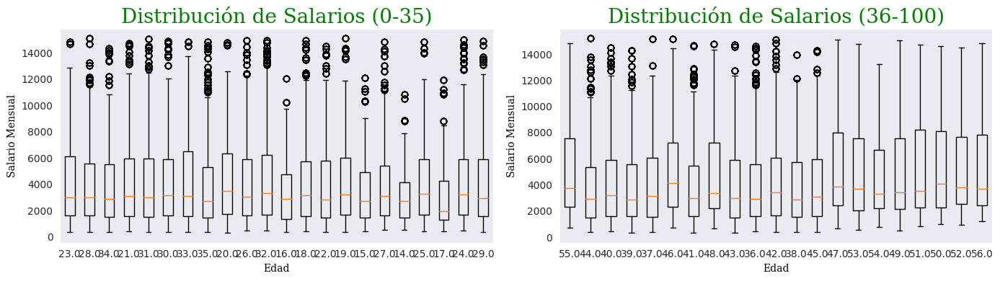


----------------------------------------------------



,Age,Monthly_Inhand_Salary
count,100000.000000,100000.000000
mean,33.274560,4197.328114
std,10.764438,3186.918569
min,14.000000,303.645417
25%,24.000000,1626.719792
50%,33.000000,3092.270000
75%,42.000000,5958.695625
max,56.000000,15204.633333


In [ ]:
# @title
# Filtramos para el rango de edad de 0 a 35 y el rango de edad de 36 a 100

df_age_0_35 = df_credit_new[(df_credit_new['Age'] >= 0) & (df_credit_clean['Age'] <= 35)]
df_age_36_100 = df_credit_new[(df_credit_new['Age'] >= 36) & (df_credit_clean['Age'] <= 100)]

# Creamos las figuras y los ejes

fig, ax_age = plt.subplots(1, 2, figsize=(14, 4))

# Gráficamos los rangos de edad

ax_age[0].boxplot([df_age_0_35[df_age_0_35['Age'] == age]['Monthly_Inhand_Salary']
                        for age in df_age_0_35['Age'].unique()],
                       labels=df_age_0_35['Age'].unique())

ax_age[1].boxplot([df_age_36_100[df_age_36_100['Age'] == age]['Monthly_Inhand_Salary']
                        for age in df_age_36_100['Age'].unique()],
                       labels=df_age_36_100['Age'].unique())

# Personalizamos los gráficos

font_label = {'family':'serif','color':'k','size':10}
font_title = {'family':'serif','color':'g','size':20}

ax_age[0].set_xlabel('Edad', fontdict=font_label)
ax_age[0].set_ylabel('Salario Mensual', fontdict=font_label)
ax_age[0].set_title('Distribución de Salarios (0-35)', fontdict=font_title)

ax_age[1].set_xlabel('Edad', fontdict=font_label)
ax_age[1].set_ylabel('Salario Mensual', fontdict=font_label)
ax_age[1].set_title('Distribución de Salarios (36-100)', fontdict=font_title)

# Ajustamos los subgráficos para evitar superposición de etiquetas

plt.tight_layout()

# Mostrar el gráfico

plt.show()

print('\n----------------------------------------------------\n')

l = [x for x in df_credit_new.columns if x in ['Age', 'Monthly_Inhand_Salary', 'Credit_Score']]

df_credit_new[l].describe()

Separación entre inliers y outliers



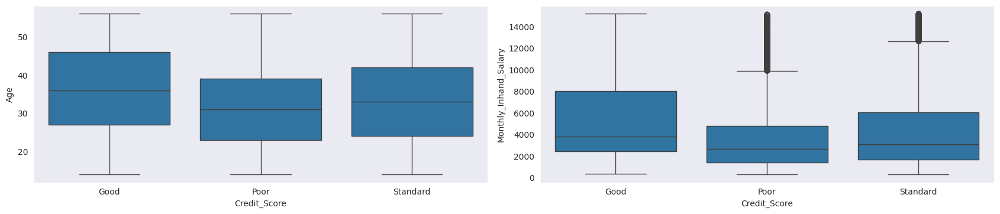

In [ ]:
# @title
# Separación entre inliers y outliers

print('Separación entre inliers y outliers\n')

l = [x for x in df_credit_new.columns if x in ['Age', 'Monthly_Inhand_Salary']]

plt.figure(figsize=(17, 14))

for x, column in zip(range(8), df_credit_new[l]):

    if column != 'Credit_Score':
        if x <= 5:
            plt.subplot(4, 2, x+1)
            sns.boxplot(data=df_credit_new, y=column, x='Credit_Score')

plt.tight_layout()
plt.show()

In [ ]:
# @title
# Utilizaremos la librería plotly para obtener un grafico interactivo

px.histogram(df_credit_new.sort_values('Grupo_Etario'),
             y='Grupo_Etario', color='Credit_Score',
             barnorm='percent', text_auto='.2f',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Puntaje de Crédito por Grupo Etario')

In [ ]:
# @title
# Calcular el coeficiente de Spearman y el p-valor

coeficiente, p_valor = stats.spearmanr(df_credit_new['Monthly_Inhand_Salary'],
                                       df_credit_new['Credit_Score'])
print('\n----------------------------------------------------\n')
print("Coeficiente de Spearman:", coeficiente)
print("P-valor:", p_valor)

# Distribución del ingreso promedio por puntaje de crédito

print('\n----------------------------------------------------\n')
ingreso_promedio_por_puntaje = df_credit_new.groupby('Credit_Score')['Monthly_Inhand_Salary'].mean()
print(ingreso_promedio_por_puntaje)
print('\n----------------------------------------------------\n')

# Graficamos el ingreso mensual por puntaje de crédito, utilizamos plotly

fig5 = px.histogram(df_credit_new, x='Monthly_Inhand_Salary',
             color='Credit_Score', facet_row='Credit_Score',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400,
             title='Ingreso Mensual por Puntaje de Crédito')

fig5.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))


----------------------------------------------------

Coeficiente de Spearman: -0.03530151765383139
P-valor: 5.937111038336691e-29

----------------------------------------------------

Credit_Score
Good        5403.763839
Poor        3379.820802
Standard    4238.659233
Name: Monthly_Inhand_Salary, dtype: float64

----------------------------------------------------



Podemos observar que los adulos tienen un mejor puntaje de crédito, ya que sus carreras tienen una mayor estabilidad y un promedio de mayor ingreso, por lo que son mas confiables a la hora de pagar sus deudas. Los clientes con menor deuda por radio de ingreso tendrán un mayor puntaje de crédito.

También observamos que, en bajas edades, es mas alta la probabilidad de obtener un bajo puntaje de crédito, cuanto mas bajo el ingreso, igual su puntaje. Hay una correlacion entre edad y ingreso mensual.

Todo esto muestra que hay una correlación positiva entre la edad y el ingreso mensual con el puntaje de credito.

### - ¿Cuál es el ingreso mensual y anual promedio por Profesión de los clientes?

### - ¿Cómo se distribuye el puntaje de crédito por las diferentes profesiones?

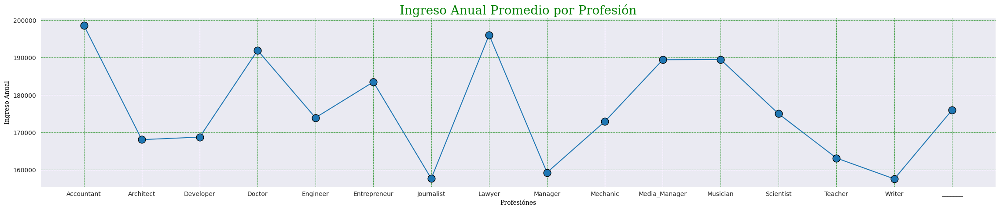


----------------------------------------------------

Occupation
Accountant       4228.804708
Architect        4303.303909
Developer        4164.419809
Doctor           4124.013030
Engineer         4217.247719
Entrepreneur     4237.303463
Journalist       4022.900538
Lawyer           4124.949119
Manager          4278.473269
Mechanic         4177.784823
Media_Manager    4224.297920
Musician         4276.039920
Scientist        4261.081922
Teacher          4136.575747
Writer           4227.417014
_______          4161.703047
Name: Monthly_Inhand_Salary, dtype: float64

----------------------------------------------------



In [ ]:
# @title
# Distribución del ingreso promedio por Ocupación

fig, ax_mat_fig2 = plt.subplots(figsize=(28, 5))

# Calculamos el ingreso anual promedio por profesión

ingreso_por_profesion = df_credit_new.groupby('Occupation')['Annual_Income'].mean()

# Graficamos los datos en el eje

ax_mat_fig2.plot(ingreso_por_profesion.index,
                ingreso_por_profesion.values,
                marker='o', ms = 12, mec = 'k')

# Personalizamos el gráfico

font_label = {'family':'serif','color':'k','size':10}
font_title = {'family':'serif','color':'g','size':20}

ax_mat_fig2.set_xlabel('Profesiónes', fontdict=font_label)
ax_mat_fig2.set_ylabel('Ingreso Anual', fontdict=font_label)
ax_mat_fig2.set_title('Ingreso Anual Promedio por Profesión', fontdict=font_title)

plt.grid(color='g', linestyle='--', linewidth = 0.5)

# Mostrar el gráfico

plt.show()

# Distribución del ingreso promedio por Ocupación

print('\n----------------------------------------------------\n')
ingreso_promedio_por_ocupacion = df_credit_new.groupby('Occupation')['Monthly_Inhand_Salary'].mean()
print(ingreso_promedio_por_ocupacion)
print('\n----------------------------------------------------\n')

In [ ]:
# @title
# Graficamos las profesiones por puntaje de crédito utilizando plotly

px.histogram(df_credit_new, x='Occupation', color='Credit_Score',
             barmode='group', histfunc='count',
             color_discrete_sequence=px.colors.qualitative.Vivid,
             width=1200, height=400,
             title='Profesiones por puntaje de crédito')

Las profesiónes y sus ingresos nos ayudan a detectar a que clientes apuntar a la hora de otorgar credito.
Podemos observar que no hay una clara diferencia en como se distribuyen los salarios entre las diferentes profesiones. Por lo que no podemos deducir de que haya un efecto en los diferente trabajos en el puntaje de crédito.

### - ¿Cuál es la distribución de las cuentas bancarias y tarjetas de crédito que poseen los clientes?

### - ¿Cómo se distribuyen la cantidad de cuentas bancarias y tarjetas de crédito por el puntaje de crédito?

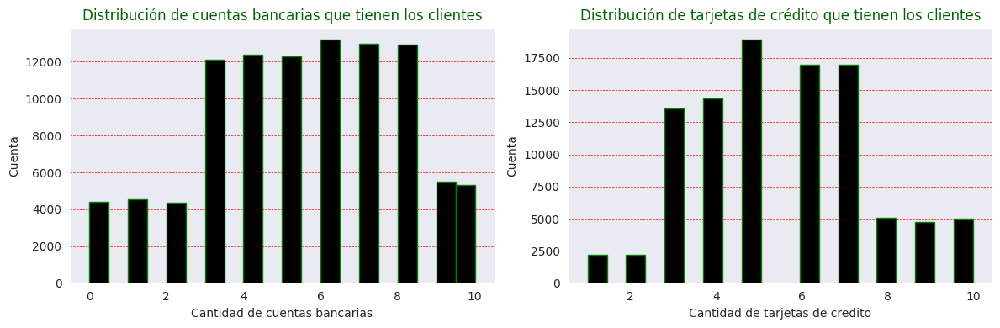


----------------------------------------------------

Cuentas bancarias

Promedio: 5.36784
Mediana: 5.0
Moda: 0    6.0
Name: Num_Bank_Accounts, dtype: float64

----------------------------------------------------


----------------------------------------------------


Tarjetas de credito

Promedio: 5.53248
Mediana: 5.0
Moda: 0    5.0
Name: Num_Credit_Card, dtype: float64

----------------------------------------------------



In [ ]:
# @title
# Creamos las figuras y los ejes

fig, credit_fig1 = plt.subplots(1, 2, figsize=(12, 4))

# Graficamos los datos de la primera visualización

credit_fig1[0].hist(data=df_credit_new, x='Num_Bank_Accounts',
             color='k', edgecolor= 'g', alpha = 1.0, bins=20)

# Personalizamos el gráfico

credit_fig1[0].set_xlabel('Cantidad de cuentas bancarias')
credit_fig1[0].set_ylabel('Cuenta')
credit_fig1[0].set_title('Distribución de cuentas bancarias que tienen los clientes', color='darkgreen')
credit_fig1[0].grid(axis='y', color='r', linestyle='--', linewidth = 0.5)

# Graficamos los datos de la segunda visualización

credit_fig1[1].hist(data=df_credit_new, x='Num_Credit_Card',
             color='k', edgecolor= 'g', alpha = 1.0, bins=20)

# Personalizamos el gráfico

credit_fig1[1].set_xlabel('Cantidad de tarjetas de credito')
credit_fig1[1].set_ylabel('Cuenta')
credit_fig1[1].set_title('Distribución de tarjetas de crédito que tienen los clientes', color='darkgreen')
credit_fig1[1].grid(axis='y', color='r', linestyle='--', linewidth = 0.5)

# Ajustamos los subplots para evitar superposición de etiquetas

plt.tight_layout()

# Mostrar el gráfico

plt.show()

print('\n----------------------------------------------------\n')
print(f'Cuentas bancarias\n\nPromedio: {df_credit_new.Num_Bank_Accounts.mean()}')
print(f'Mediana: {df_credit_new.Num_Bank_Accounts.median()}')
print(f'Moda: {df_credit_new.Num_Bank_Accounts.mode()}')
print('\n----------------------------------------------------\n')

print('\n----------------------------------------------------\n')
print(f'\nTarjetas de credito\n\nPromedio: {df_credit_new.Num_Credit_Card.mean()}')
print(f'Mediana: {df_credit_new.Num_Credit_Card.median()}')
print(f'Moda: {df_credit_new.Num_Credit_Card.mode()}')
print('\n----------------------------------------------------\n')

Observamos una distribución simétrica de las variables.

In [ ]:
# @title
# Utilizaremos la librería plotly para obtener un grafico interactivo

resumen_cuentas = px.box(df_credit_new, x='Num_Bank_Accounts', y='Credit_Score', color='Credit_Score',
                 color_discrete_sequence=px.colors.qualitative.Vivid, width=800, height=400,
                 title='Cantidad de cuentas por puntaje de crédito')

resumen_cuentas.update_layout(showlegend=False)

In [ ]:
# @title
# Utilizaremos la librería plotly para obtener un grafico interactivo

resumen_tarjetas = px.box(df_credit_new, x='Num_Credit_Card', y='Credit_Score', color='Credit_Score',
                 color_discrete_sequence=px.colors.qualitative.Vivid, width=800, height=400,
                 title='Cantidad de tarjetas por puntaje de crédito')

resumen_tarjetas.update_layout(showlegend=False)

In [ ]:
# @title
# Calcular el coeficiente de Pearson y el p-valor

coeficiente, p_valor = stats.pearsonr(df_credit_new['Num_Bank_Accounts'],
                                       df_credit_new['Num_Credit_Card'])

print('\n----------------------------------------------------\n')
print("Coeficiente de Pearson:", coeficiente)
print("P-valor:", p_valor)
print('\n----------------------------------------------------\n')

# Graficamos los datos

px.scatter(df_credit_new,
           x='Num_Bank_Accounts',
           y='Num_Credit_Card',
           color='Num_Credit_Card',
           trendline="ols",
           width=600, height=400,
           title='Cantidad de Cuentas por Tarjetas')

Output hidden; open in https://colab.research.google.com to view.

Podemos observar una correlación positiva entre ambas variables.
La cantidad de tarjetas de crédito que un cliente posee puede ser riesgoso ya que manejar y controlarlas puede ser difícil, principalmente con las fechas de pago, y múltiples cuentas bancarias no siempre significan negativas para el puntaje de crédito, pero analizaremos su correlación positiva con otras variables.

### - ¿Hay una relación entre el numero de prestamos y la deuda pendiente de los clientes?

### - ¿Hay una relación entre cuantos prestamos y deuda tiene una persona con el puntaje de crédito que tiene?

In [ ]:
# @title
deuda = [x for x in df_credit_new.columns if x in ['Num_of_Loan', 'Outstanding_Debt', 'Credit_Score']]

df_credit_new[deuda]

,Num_of_Loan,Outstanding_Debt,Credit_Score
0,4.0,809.98,Good
1,4.0,809.98,Good
2,4.0,809.98,Good
3,4.0,809.98,Good
4,4.0,809.98,Good
...,...,...,...
99995,2.0,502.38,Poor
99996,2.0,502.38,Poor
99997,2.0,502.38,Poor
99998,2.0,502.38,Standard


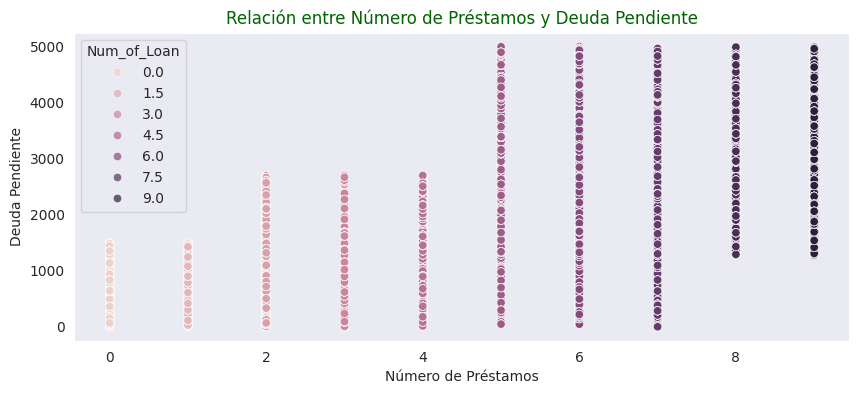


----------------------------------------------------



,Num_of_Loan,Outstanding_Debt
count,100000.000000,100000.000000
mean,3.532880,1426.220376
std,2.446356,1155.129026
min,0.000000,0.230000
25%,2.000000,566.072500
50%,3.000000,1166.155000
75%,5.000000,1945.962500
max,9.000000,4998.070000


In [ ]:
# @title
# Número de prestamos vs Deuda pendiente

fig, ax_sea_fig4 = plt.subplots(figsize=(10, 4))

# Graficamos los datos

sns.scatterplot(data=df_credit_new,
                x='Num_of_Loan',
                y='Outstanding_Debt',
                hue= 'Num_of_Loan',
                alpha=0.7)

# Personalizamos el gráfico

ax_sea_fig4.set_xlabel('Número de Préstamos')
ax_sea_fig4.set_ylabel('Deuda Pendiente')
ax_sea_fig4.set_title('Relación entre Número de Préstamos y Deuda Pendiente',
                      color='darkgreen')

# Mostrar el gráfico

plt.show()

print('\n----------------------------------------------------\n')
df_credit_new[deuda].describe()

In [ ]:
# @title
# Calcular el coeficiente de Pearson y el p-valor

coeficiente, p_valor = stats.pearsonr(df_credit_new['Num_of_Loan'],
                                      df_credit_new['Outstanding_Debt'])

print('\n----------------------------------------------------\n')
print("Coeficiente de Pearson:", coeficiente)
print("P-valor:", p_valor)
print('\n----------------------------------------------------\n')

# Graficamos los datos

px.scatter(df_credit_new,
           x='Outstanding_Debt',
           y='Num_of_Loan',
           color='Num_of_Loan',
           trendline="ols",
           width=600, height=400,
           title='Cantidad de deuda por prestamos')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# @title
# Graficando el numero de prestamos por puntaje usando plotly

fig_prestamo = px.violin(df_credit_new, x='Num_of_Loan', y='Credit_Score',
             color='Credit_Score', color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Prestamos por Puntaje de Crédito')

fig_prestamo.update_layout(showlegend=False)

In [ ]:
# @title
# Graficando la deuda pendiente por puntaje usando plotly

fig_deuda = px.violin(df_credit_new, x='Outstanding_Debt', y='Credit_Score',
             color='Credit_Score', box=True, color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Deuda por Puntaje de Crédito')

fig_deuda.update_layout(showlegend=False)

Podemos observar una relación entre la cantidad de prestamos y la deuda pendiente de los clientes, donde hay una clara tendencia ascendente que indica una relación lineal entre las dos variables. Podemos observar una correlación positiva entre ambas variables.

La distribución de la deuda por puntaje de crédito tiene una clara correlación negativa, aunque encontramos una significativo número de Outliers para todos los grupos. Seria importante tratarlos mas adelante.

### - ¿Cuáles son los patrones de Frecuencia de utilización del crédito?

### - ¿Cual es la relación entre el ratio de utilizacion del crédito y el puntaje de crédito?

DescribeResult(nobs=100000, minmax=(20.0, 50.00000000000001), mean=32.2851725189436, variance=26.18241048353184, skewness=0.02861609688528977, kurtosis=-0.9440360455266141)

----------------------------------
 
Valor de p:  0.012512915767729282 
Distribución:  Los datos no siguen una distribución normal (Rechaza H0). 

----------------------------------



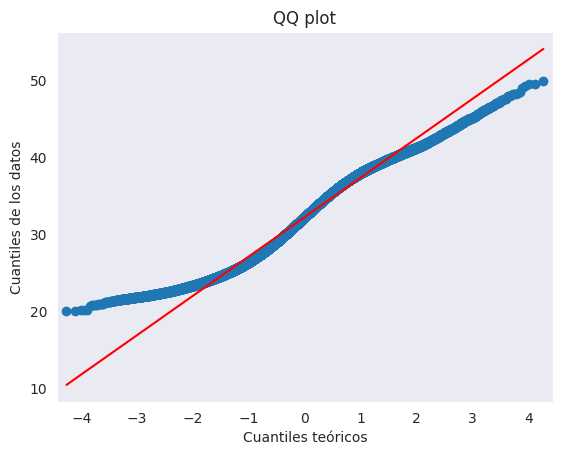


--------------------------------------

Curtosis: -0.9440360455266141
Asimetría: 0.02861609688528977
Existe una baja concentración de los valores en torno a su media (Platicúrtica)
Distribución con asimetría positiva

--------------------------------------



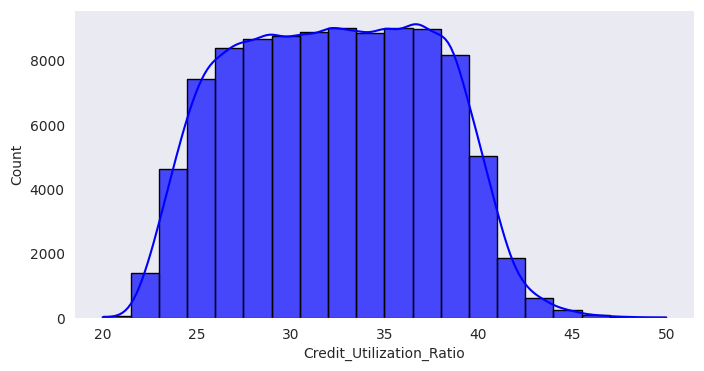

In [ ]:
# @title
# Analizaremos la distribución de los valores

test_shapiro(df_credit_new, 'Credit_Utilization_Ratio')
distribucion_frecuencias(df_credit_new, 'Credit_Utilization_Ratio')

In [ ]:
# @title
# Utilizaremos la librería plotly para obtener un grafico interactivo

resumen_tarjetas = px.box(df_credit_new,
                          x='Credit_Utilization_Ratio',
                          y='Credit_Score',
                          color='Credit_Score',
                          color_discrete_sequence=px.colors.qualitative.Vivid,
                          width=800, height=400,
                          title='Ratio de Utilización de Crédito por puntaje de crédito')

resumen_tarjetas.update_layout(showlegend=False)

Output hidden; open in https://colab.research.google.com to view.

Podemos observar como se distribuyen los valores de utilización del crédito en el conjunto de datos. También podemos observar que el ratio de utilización del crédito tiene una distribución pareja a lo largo del puntaje, cundo se esperaría una influencia negativa. Esto puede deberse a la responsabilidad de los clientes en como utilizan el crédito.

### - ¿Hay una relación entre las inversiones de los clientes y su balance mensual?

### - ¿Influye el balance mensual de los clientes en el puntaje de crédito?

In [ ]:
# @title
# Calcular el coeficiente de Pearson y el p-valor

coeficiente, p_valor = stats.pearsonr(df_credit_new['Monthly_Balance'],
                                      df_credit_new['Amount_invested_monthly'])

print('\n----------------------------------------------------\n')
print("Coeficiente de Pearson:", coeficiente)
print("P-valor:", p_valor)
print('\n----------------------------------------------------\n')

# Graficamos la relación de las inversiones y balance

px.scatter(df_credit_new,
           x='Monthly_Balance',
           y='Amount_invested_monthly',
           color='Monthly_Balance',
           trendline="ols",
           width=600, height=400,
           title='Balance e Inversiones')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# @title
# Creamos un dataframe para visualizar las variables en conjunto

balance = [x for x in df_credit_new.columns if x in ['Amount_invested_monthly',
                                                     'Monthly_Balance',
                                                     'Credit_Score']]

df_credit_new[balance]

,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,80.415295,312.494089,Good
1,118.280222,284.629162,Good
2,81.699521,331.209863,Good
3,199.458074,223.451310,Good
4,41.420153,341.489231,Good
...,...,...,...
99995,60.971333,479.866228,Poor
99996,54.185950,496.651610,Poor
99997,24.028477,516.809083,Poor
99998,251.672582,319.164979,Standard


In [ ]:
# @title
# Graficando el balance mensual por puntaje usando plotly

fig_balance = px.box(df_credit_new, x='Monthly_Balance', y='Credit_Score',
             color='Credit_Score', color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Balance Mensual por Puntaje de Crédito')

fig_balance.update_layout(showlegend=False)

Output hidden; open in https://colab.research.google.com to view.

Podemos observar una clara relación entre las inversiones de los clientes y su balance mensual. En cuanto a su relación con el puntaje de crédito, podemos ver que es muy balanceada la clasificación para los tres tipos de puntaje, pero encontramos gran cantidad de outliers. Podemos decir que los balances o las inversiones que los clientes realizan no influyen en el puntaje de crédito.

### - ¿El pago mínimo influye en el puntaje de crédito?

### - ¿Cual es el comportamiento de pago de los clientes y como influye en el puntaje de crédito?


----------------------------------------------------

Coeficiente de correlación de Cramér: 0.4107082864527988

----------------------------------------------------



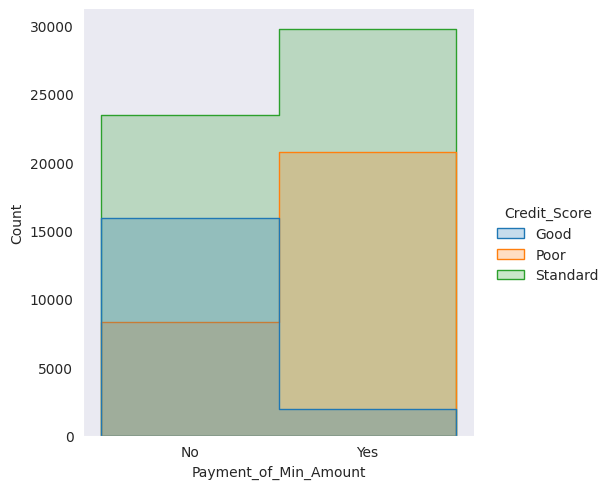


----------------------------------------------------



,Monthly_Inhand_Salary,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
0,1824.843333,No,High_spent_Medium_value_payments,Good
1,1824.843333,No,High_spent_Medium_value_payments,Good
2,1824.843333,No,High_spent_Medium_value_payments,Good
3,1824.843333,No,High_spent_Medium_value_payments,Good
4,1824.843333,No,High_spent_Medium_value_payments,Good
...,...,...,...,...
99995,3359.415833,No,High_spent_Large_value_payments,Poor
99996,3359.415833,No,High_spent_Large_value_payments,Poor
99997,3359.415833,No,High_spent_Large_value_payments,Poor
99998,3359.415833,No,High_spent_Large_value_payments,Standard


In [ ]:
# @title
# Revisamos la correlación entre la variable y el puntaje de crédito

correlacion = cramers_v(df_credit_new['Payment_of_Min_Amount'],
                        df_credit_new['Credit_Score'])

print("\n----------------------------------------------------\n")
print(f"Coeficiente de correlación de Cramér: {correlacion}")
print("\n----------------------------------------------------\n")

# Graficamos los datos de la variable por el puntaje de crédito

sns.displot(df_credit_new,
            x='Payment_of_Min_Amount',
            hue='Credit_Score',
            element="step")

# Mostrar el gráfico

plt.show()

print('\n----------------------------------------------------\n')
pagos = [x for x in df_credit_new.columns if x in ['Payment_of_Min_Amount',
                                                   'Payment_Behaviour',
                                                   'Monthly_Inhand_Salary',
                                                   'Credit_Score']]

df_credit_new[pagos]


----------------------------------------------------

Coeficiente de correlación de Cramér: 0.09282867453473961

----------------------------------------------------



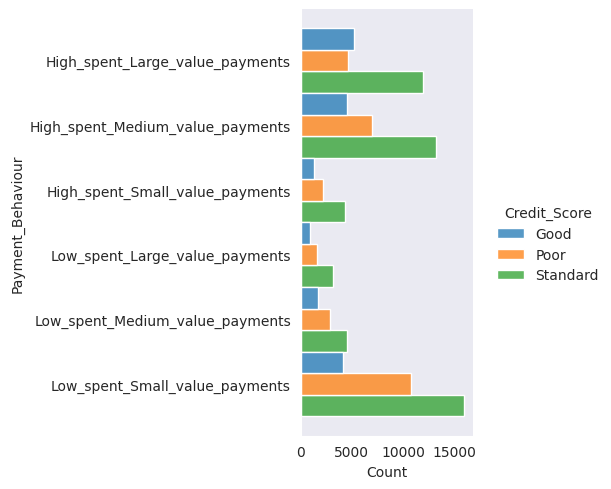

In [ ]:
# @title
# Revisamos la correlación entre la variable y el puntaje de crédito

correlacion = cramers_v(df_credit_new['Payment_Behaviour'],
                        df_credit_new['Credit_Score'])

print("\n----------------------------------------------------\n")
print(f"Coeficiente de correlación de Cramér: {correlacion}")
print("\n----------------------------------------------------\n")

# Graficamos los datos de la variable por el puntaje de crédito

sns.displot(df_credit_new,
            y='Payment_Behaviour',
            hue='Credit_Score',
            multiple="dodge")

El pago mínimo puede ser un indicador de ingresos bajos y posibles deudas. Los clientes que pagan el mínimo mensual no suelen tener un puntaje de crédito bueno.
El comportamiento de pago de un cliente puede indica una pequeña mejora en el puntaje de crédito, pero no es tan influyente en el puntaje.

### - ¿Cuánto influye la cantidad de días atrasados de pago en el puntaje de crédito?

### - ¿La cantidad de pagos atrasados influye en el punta de crédito?

In [ ]:
# @title
# Graficando el numero de prestamos por puntaje usando plotly

fig_prestamo = px.violin(df_credit_new, x='Delay_from_due_date', y='Credit_Score',
             color='Credit_Score', color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Pagos Atrasados en días por Puntaje de Crédito')

fig_prestamo.update_layout(showlegend=False)

In [ ]:
# @title
# Creamos un dataframe para visualizar las variables en conjunto

pagos_atrasados = [x for x in df_credit_new.columns if x in ['Delay_from_due_date',
                                                             'Num_of_Delayed_Payment',
                                                             'Credit_Score']]

df_credit_new[pagos_atrasados]

,Delay_from_due_date,Num_of_Delayed_Payment,Credit_Score
0,3.0,7.0,Good
1,3.0,7.0,Good
2,3.0,7.0,Good
3,5.0,4.0,Good
4,6.0,4.0,Good
...,...,...,...
99995,23.0,7.0,Poor
99996,18.0,7.0,Poor
99997,27.0,6.0,Poor
99998,20.0,6.0,Standard


In [ ]:
# @title
# Graficando el numero de prestamos por puntaje usando plotly

fig_prestamo = px.violin(df_credit_new, x='Num_of_Delayed_Payment', y='Credit_Score',
             color='Credit_Score', color_discrete_sequence=px.colors.qualitative.Vivid,
             width=800, height=400, title='Pagos Atrasados por Puntaje de Crédito')

fig_prestamo.update_layout(showlegend=False)

In [ ]:
# @title
# Analizamos los valores numéricos

df_credit_new[pagos_atrasados].describe()

,Delay_from_due_date,Num_of_Delayed_Payment
count,100000.000000,100000.000000
mean,21.108440,13.447360
std,14.822424,7.869476
min,0.000000,0.000000
25%,10.000000,9.000000
50%,18.000000,14.000000
75%,28.000000,18.000000
max,67.000000,359.000000


In [ ]:
# @title
# Calcular el coeficiente de Pearson y el p-valor

coeficiente, p_valor = stats.pearsonr(df_credit_new['Num_of_Delayed_Payment'],
                                      df_credit_new['Delay_from_due_date'])

print('\n----------------------------------------------------\n')
print("Coeficiente de Pearson:", coeficiente)
print("P-valor:", p_valor)
print('\n----------------------------------------------------\n')

# Graficamos la relación de las inversiones y balance

px.scatter(df_credit_new,
           x='Num_of_Delayed_Payment',
           y='Delay_from_due_date',
           color='Delay_from_due_date',
           trendline="ols",
           width=600, height=400,
           title='Cantidad de pagos atrasados por Puntaje')

Output hidden; open in https://colab.research.google.com to view.

Encontramos que, como era de esperar, los pagos atrasados en mas de un mes reducen el puntaje de crédito. Podemos ver un incremento gradual del puntaje bajo de crédito, cuantos mas días y pagos atrasados tenemos. Estas variables son claramente influyentes en el puntaje de crédito.

### - ¿Cómo influye la clasificación del crédito variado con el puntaje?

### - ¿Cuál es la influencia y la relación del historial del crédito con el puntaje de crédito?

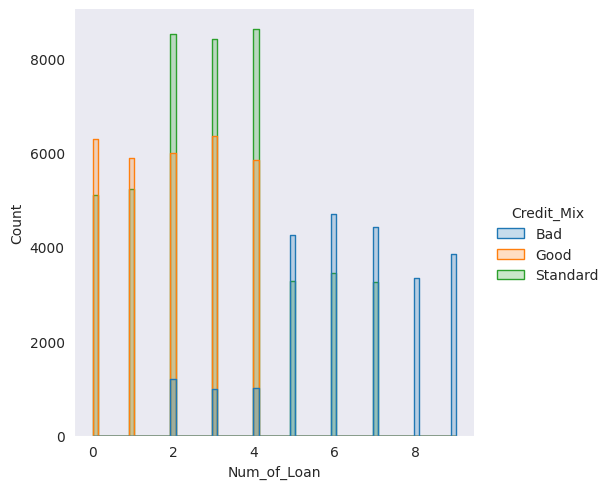


----------------------------------------------------



,Num_of_Loan,Credit_Mix,Credit_Score
0,4.0,Good,Good
1,4.0,Good,Good
2,4.0,Good,Good
3,4.0,Good,Good
4,4.0,Good,Good
...,...,...,...
99995,2.0,Good,Poor
99996,2.0,Good,Poor
99997,2.0,Good,Poor
99998,2.0,Good,Standard


In [ ]:
# @title
# Graficamos los datos de la variable

sns.displot(df_credit_new,
            x='Num_of_Loan',
            hue='Credit_Mix',
            element="step")

# Mostrar el gráfico

plt.show()
print('\n----------------------------------------------------\n')

# Creamos un dataframe para visualizar las variables en conjunto

credito_variado = [x for x in df_credit_new.columns if x in ['Credit_Mix',
                                                             'Num_of_Loan',
                                                             'Credit_Score']]

df_credit_new[credito_variado]

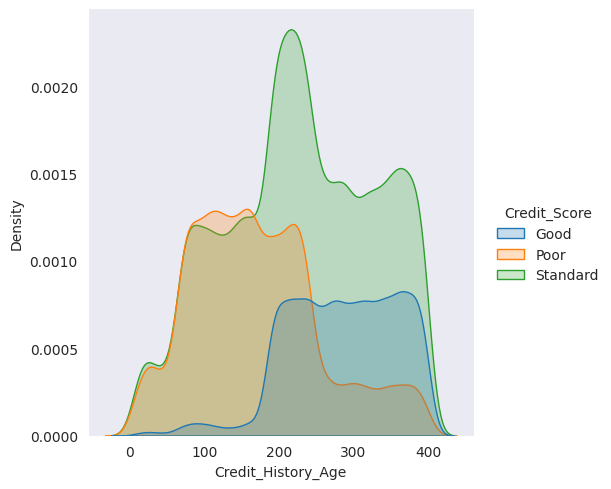

In [ ]:
# @title
# Graficamos el historial del crédito por puntaje

sns.displot(df_credit_new, x='Credit_History_Age',
            hue='Credit_Score', kind="kde", fill=True)

Es lógico que un buen crédito variable sea favorable para el puntaje de crédito. El tipo de préstamo no influye en el puntaje, pero tener muchos prestamos no seria recomendable ya que muchos prestamos terminan disminuyendo.

Encontramos una correlación positiva entre la historia de crédito con el puntaje de crédito. Esto se debe a que generalmente cuanto mas usamos nuestro crédito y nuestra cuenta, mayor es la información recopilada para categorizar a los clientes.

---
<center>
 <h1><font color= "green" size="+5">Feature Selection y Reducción de la dimensionalidad</font></h1>
</center>

Haremos una copia del dataset donde removeremos las columnas innecesarias o redundantes, así como las features que no utilizaremos, por como se relacionan con la variable objetivo, y las que ya no necesitamos.

In [ ]:
# Realizamos una copia del dataset

df_credit = df_credit_clean.copy()

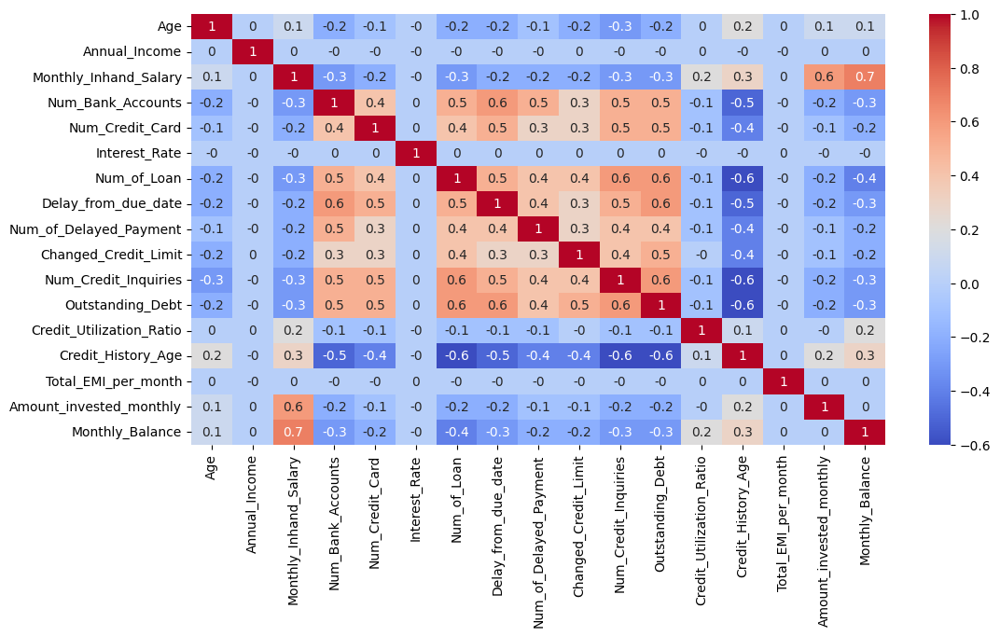

In [ ]:
# Graficamos la correlación entre las variables

matriz = df_credit.corr(numeric_only=True).round(1)

plt.figure(figsize=(12, 6))
ax = sns.heatmap(matriz, annot=True, cmap="coolwarm")

Inicialmente removeremos las variables innecesarias, así como también, las variables que ya no requerimos luego de nuestro analisis, como 'Age', 'Month' y 'Occupation'. También removeremos 'Interest_Rate', no solo por su correlación, sino también porque se basa en el puntaje de credito. Mantendremos algunas variables, mas allá de su correlación, para terminar con el codificado y escalado de los datos, y luego volver a analizarla.

In [ ]:
# Removemos las columnas innecesarias

df_credit.drop(columns=['ID', 'SSN', 'Name'], inplace=True)

# Removemos las variables que no usaremos

df_credit.drop(columns=['Age',
                        'Customer_ID',
                        'Month',
                        'Occupation',
                        'Interest_Rate'], inplace=True)

In [ ]:
df_credit.describe(exclude = np.number)

,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score,Grupo_Etario
count,100000,100000,100000,100000,100000,100000
unique,6261,3,2,6,3,2
top,<function <lambda> at 0x7820482d63b0>,Standard,Yes,Low_spent_Small_value_payments,Standard,Adulto(27-59)
freq,11408,45848,52326,30880,53174,68704


In [ ]:
df_credit.describe()

,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000
mean,1.764157e+05,4197.328114,5.367840,5.532480,3.532880,21.108440,13.447360,10.389784,5.780270,1426.220376,32.285173,221.27786,1403.118217,195.751837,403.120320
std,1.429618e+06,3186.918569,2.592597,2.066153,2.446356,14.822424,7.869476,6.790119,3.862931,1155.129026,5.116875,99.67973,8306.041270,195.116198,214.014558
min,7.005930e+03,303.645417,0.000000,1.000000,0.000000,0.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,1.00000,0.000000,0.000000,0.007760
25%,1.945750e+04,1626.719792,3.000000,4.000000,2.000000,10.000000,9.000000,5.330000,3.000000,566.072500,28.052567,145.00000,30.306660,74.599540,270.189030
50%,3.757861e+04,3092.270000,5.000000,5.000000,3.000000,18.000000,14.000000,9.400000,5.000000,1166.155000,32.305784,220.00000,69.249473,131.209101,337.114461
75%,7.279092e+04,5958.695625,7.000000,7.000000,5.000000,28.000000,18.000000,14.860000,8.000000,1945.962500,36.496663,302.00000,161.224249,239.479981,471.570652
max,2.419806e+07,15204.633333,10.000000,10.000000,9.000000,67.000000,359.000000,36.970000,17.000000,4998.070000,50.000000,404.00000,82331.000000,1977.326102,1602.040519


In [ ]:
print(df_credit.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   Annual_Income             100000 non-null  float64 
 1   Monthly_Inhand_Salary     100000 non-null  float64 
 2   Num_Bank_Accounts         100000 non-null  float64 
 3   Num_Credit_Card           100000 non-null  float64 
 4   Num_of_Loan               100000 non-null  float64 
 5   Type_of_Loan              100000 non-null  object  
 6   Delay_from_due_date       100000 non-null  float64 
 7   Num_of_Delayed_Payment    100000 non-null  float64 
 8   Changed_Credit_Limit      100000 non-null  float64 
 9   Num_Credit_Inquiries      100000 non-null  float64 
 10  Credit_Mix                100000 non-null  category
 11  Outstanding_Debt          100000 non-null  float64 
 12  Credit_Utilization_Ratio  100000 non-null  float64 
 13  Credit_History_Age        1000

---
<center>
 <h1><font color= "green" size="+5">Encoding</font></h1>
 <p></p>
 <img src="https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F4158089%2F92499f5b1e36986926ab618a490a73d1%2FEncodings--Number-Systems_Watermarked.jpg?generation=1587402761973885&alt=media" alt="Preguntas">
</center>

Procederemos a codificar la variable objetivo(y) , utilizaremos LabelEncoder para evaluar el modelo con las clasificaciones originales de la variable. Para el resto de las variables categóricas(x) utilizaremos OneHotEncoder, además de probar y utilizar otras herramientas para codificar los datos.

In [ ]:
# Utilizamos get_dummies para obtener los valores de la variable 'Type_of_Loan'

df_dummies = df_credit['Type_of_Loan'].str.get_dummies(sep=',')

# Eliminamos la variable y concatenamos los dataframes

df_credit = df_credit.drop(columns='Type_of_Loan')
df_credit = pd.concat([df_credit, df_dummies], axis=1)

# Revisamos el df resultado de la variable

df_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column                                 Non-Null Count   Dtype
---  ------                                 --------------   -----
 0   <function <lambda> at 0x7820482d63b0>  100000 non-null  int64
 1   Auto Loan                              100000 non-null  int64
 2   Credit-Builder Loan                    100000 non-null  int64
 3   Debt Consolidation Loan                100000 non-null  int64
 4   Home Equity Loan                       100000 non-null  int64
 5   Mortgage Loan                          100000 non-null  int64
 6   Not Specified                          100000 non-null  int64
 7   Payday Loan                            100000 non-null  int64
 8   Personal Loan                          100000 non-null  int64
 9   Student Loan                           100000 non-null  int64
dtypes: int64(10)
memory usage: 7.6 MB


In [ ]:
# Mapeamos la variable 'Credit_Mix' y cambiamos su formato

m = {
    'Bad' : 0,
    'Standard' : 1,
    'Good' : 2,
    }

df_credit['Credit_Mix'] = (df_credit['Credit_Mix'].map(m))

df_credit['Credit_Mix'] = (df_credit['Credit_Mix'].astype("int64"))

In [ ]:
# Mapeamos la variable 'Payment_Behaviour' y cambiamos su formato

m = {
    'Low_spent_Small_value_payments' : 0,
    'Low_spent_Medium_value_payments' : 1,
    'Low_spent_Large_value_payments' : 2,
    'High_spent_Small_value_payments' : 3,
    'High_spent_Medium_value_payments' : 4,
    'High_spent_Large_value_payments' : 5
    }

df_credit['Payment_Behaviour'] = (df_credit['Payment_Behaviour'].map(m))

df_credit['Payment_Behaviour'] = (df_credit['Payment_Behaviour'].astype("int64"))

Utilizamos las herramientas 'map' y get_dummies para probar el manejo de las variables categóricas de diferentes maneras, a continuación aplicaremos LabelEncoder y OneHotEncoder para el resto de las features.

>- ## LabelEncoder

In [ ]:
le = LabelEncoder()

le.fit(df_credit['Credit_Score'])

LabelEncoder()

In [ ]:
le.classes_

array(['Good', 'Poor', 'Standard'], dtype=object)

In [ ]:
# Transformamos los datos de la variable objetivo

df_credit['Credit_Score'] = le.transform(df_credit['Credit_Score'])

# Revisamos los valores de la variable

df_credit['Credit_Score'].describe()

count    100000.000000
mean          1.353460
std           0.764913
min           0.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           2.000000
Name: Credit_Score, dtype: float64

>- ## OneHotEncoder

In [ ]:
enc = OneHotEncoder(sparse=False, drop='if_binary')

In [ ]:
# Creamos un dataframe para las variables categoricas restantes

variables_categoricas = df_credit[['Payment_of_Min_Amount',
                                   'Grupo_Etario']]

# Aplicamos OneHotEncoder a las variables

variables_enc = enc.fit_transform(variables_categoricas)

# Creamos un dataframe con las variables

df_enc = pd.DataFrame(
    variables_enc, columns=enc.get_feature_names_out(variables_categoricas.columns)
)

print(df_enc.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 2 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Payment_of_Min_Amount_Yes  100000 non-null  float64
 1   Grupo_Etario_Joven(14-26)  100000 non-null  float64
dtypes: float64(2)
memory usage: 1.5 MB
None


In [ ]:
# Corregimos el nombres de la columnas

df_enc.rename(columns={'Payment_of_Min_Amount_Yes':'Payment_of_Min_Amount',
                       'Grupo_Etario_Joven(14-26)':'Grupo_Etario',}, inplace=True)

# Eliminamos las columnas originales

df_credit.drop(['Payment_of_Min_Amount', 'Grupo_Etario'], axis=1, inplace=True)

---
<center>
 <h1><font color= "green" size="+5">Escalado</font></h1>
</center>

Utilizaremos RobustScaler que quita la mediana y escala de acuerdo al rango intercuartílico. Aplica un escalado a las características de forma que sea más robusto a los valores atípicos o outliers.

In [ ]:
rs = RobustScaler()

In [ ]:
# Creamos un dataframe para las variables númericas restantes

variables_numericas = df_credit[['Annual_Income',
                                 'Monthly_Inhand_Salary',
                                 'Num_Bank_Accounts',
                                 'Num_Credit_Card',
                                 'Num_of_Loan',
                                 'Delay_from_due_date',
                                 'Num_of_Delayed_Payment',
                                 'Changed_Credit_Limit',
                                 'Num_Credit_Inquiries',
                                 'Outstanding_Debt',
                                 'Credit_Utilization_Ratio',
                                 'Credit_History_Age',
                                 'Total_EMI_per_month',
                                 'Amount_invested_monthly',
                                 'Monthly_Balance']]

# Aplicamos RobustScaler a las variables

variables_rs = rs.fit_transform(variables_numericas)

# Creamos un dataframe con las variables

df_rs = pd.DataFrame(
    variables_rs, columns=rs.get_feature_names_out(variables_numericas.columns)
)

print(df_rs.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Annual_Income             100000 non-null  float64
 1   Monthly_Inhand_Salary     100000 non-null  float64
 2   Num_Bank_Accounts         100000 non-null  float64
 3   Num_Credit_Card           100000 non-null  float64
 4   Num_of_Loan               100000 non-null  float64
 5   Delay_from_due_date       100000 non-null  float64
 6   Num_of_Delayed_Payment    100000 non-null  float64
 7   Changed_Credit_Limit      100000 non-null  float64
 8   Num_Credit_Inquiries      100000 non-null  float64
 9   Outstanding_Debt          100000 non-null  float64
 10  Credit_Utilization_Ratio  100000 non-null  float64
 11  Credit_History_Age        100000 non-null  float64
 12  Total_EMI_per_month       100000 non-null  float64
 13  Amount_invested_monthly   100000 non-null  fl

In [ ]:
df_rs.describe()

,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,2.603191,0.255093,0.091960,0.177493,0.177627,0.172691,-0.061404,0.103860,0.156054,0.188468,-0.002441,0.008139,10.188614,0.391452,0.327765
std,26.805295,0.735673,0.648149,0.688718,0.815452,0.823468,0.874386,0.712499,0.772586,0.837117,0.605971,0.634903,63.444808,1.183380,1.062731
min,-0.573237,-0.643730,-1.250000,-1.333333,-1.000000,-1.000000,-1.555556,-1.667366,-1.000000,-0.844941,-1.457324,-1.394904,-0.528955,-0.795783,-1.673970
25%,-0.339770,-0.338310,-0.500000,-0.333333,-0.333333,-0.444444,-0.555556,-0.427072,-0.400000,-0.434877,-0.503691,-0.477707,-0.297461,-0.343337,-0.332331
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.660230,0.661690,0.500000,0.666667,0.666667,0.555556,0.444444,0.572928,0.600000,0.565123,0.496309,0.522293,0.702539,0.656663,0.667669
max,453.008327,2.796037,1.250000,1.666667,2.000000,2.722222,38.333333,2.892970,2.400000,2.776971,2.095454,1.171975,628.347584,11.196701,6.281239


In [ ]:
# Variables restantes

df_vr = df_credit[['Credit_Mix',
                   'Payment_Behaviour',
                   'Auto Loan',
                   'Credit-Builder Loan',
                   'Debt Consolidation Loan',
                   'Home Equity Loan',
                   'Mortgage Loan',
                   'Not Specified',
                   'Payday Loan',
                   'Personal Loan',
                   'Student Loan',
                   'Credit_Score']]

In [ ]:
# Concatenamos los dataframes

df_credit_end = pd.concat([df_rs, df_enc, df_vr], axis=1)

df_credit_end.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Annual_Income             100000 non-null  float64
 1   Monthly_Inhand_Salary     100000 non-null  float64
 2   Num_Bank_Accounts         100000 non-null  float64
 3   Num_Credit_Card           100000 non-null  float64
 4   Num_of_Loan               100000 non-null  float64
 5   Delay_from_due_date       100000 non-null  float64
 6   Num_of_Delayed_Payment    100000 non-null  float64
 7   Changed_Credit_Limit      100000 non-null  float64
 8   Num_Credit_Inquiries      100000 non-null  float64
 9   Outstanding_Debt          100000 non-null  float64
 10  Credit_Utilization_Ratio  100000 non-null  float64
 11  Credit_History_Age        100000 non-null  float64
 12  Total_EMI_per_month       100000 non-null  float64
 13  Amount_invested_monthly   100000 non-null  fl

In [ ]:
# Guardamos una copia del dataframe para el modelado final

df_credit_end.to_csv('df_credit_end.csv', encoding='utf-8')

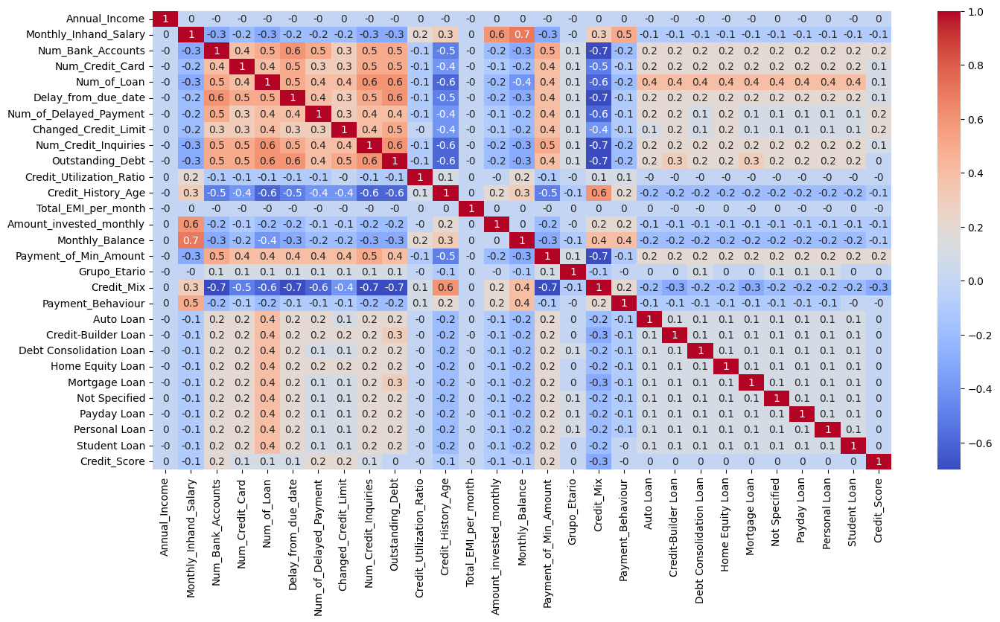

In [ ]:
# Graficamos la correlación entre las variables

matriz = df_credit_end.corr(numeric_only=True).round(1)

plt.figure(figsize=(16, 8))
ax = sns.heatmap(matriz, annot=True, cmap="coolwarm")

Pudimos analizar en su totalidad la relación entre las variables, y encontramos que no a variado mucho en términos generales. Ciertas features podrían ser removidas, como Anual_Income, Credit_Utilizatin_Ratio, Total_EMI_per_month, así como también algunas variables categóricas codificadas, como los tipos de prestamos y grupos etarios. Aun así, mantendremos todos los datos para probar inicialmente a continuación los diferentes modelos con la totalidad de la data y dejar un poco de ruido. Luego de evaluar los modelos y sus resultados, veremos la importancia de las variables y que nueva reducción realizamos.

A partir de este punto terminamos con el análisis, limpieza y preparación de los datos para aplicar nuestros modelos elegidos, así como también poder evaluar métricas y resultados.

---
<center>
 <h1><font color= "green" size="+5">Selección de Modelos</font></h1>
</center>

Nos encontramos con una variable objetivo ordinal no balanceada, y las variables no son independientes. Utilizaremos modelos de aprendizaje supervisado de clasificación multiclase. También calcularemos las métricas para validar los modelos.

<div>
  <p>Probaremos seis algoritmos de clasificación:</p><p></p>
  <ul>
   <li>NearestNeighborsClassifier</li><p><img src="https://raw.githubusercontent.com/shruti-jadon/Data_Science_Images/main/knn.png" alt="NearestNeighborsClassifier" width="450" height="300"></p>
   <li>DecisionTreeClassifier</li><p><img src="https://media.licdn.com/dms/image/D4D12AQELB-qqeoCWQQ/article-cover_image-shrink_720_1280/0/1693121766623?e=2147483647&v=beta&t=wPeSNF7ljiDbKDnA8pmefoXzXRLsqdCLoffM5Roe3og" alt="DecisionTreeClassifier" width="450" height="300"></p>
   <li>RandomForestClassifier</li><p><img src="https://i.ytimg.com/vi/v6VJ2RO66Ag/maxresdefault.jpg" alt="RandomForestClassifier" width="450" height="300"></p>
   <li>LinearSupportVectorClassification</li><p><img src="https://cdn-images-1.medium.com/max/440/1*bs8kieB0yqOiUqCV4LmIvQ.png" alt="LinearSupportVectorClassification" width="450" height="300"></p>
   <li>HistGradientBoostingClassifier</li><p><img src="https://data-analysis-stats.jp/wp-content/uploads/2020/11/HistGradientBoosting_01.png" alt="HistGradientBoostingClassifier" width="450" height="300"></p>
   <li>XGBClassifier</li><p><img src="https://media.licdn.com/dms/image/C4D12AQHIt2funjnANA/article-cover_image-shrink_600_2000/0/1623913883833?e=2147483647&v=beta&t=wWtAourz5Pm9CjjcvfXKovUJdBZEI-YbPlVU29NJZmM" alt="XGBClassifier" width="450" height="300"></p>
  </ul>
</div>

>- ## Data split

Dividiremos los datos en conjuntos de entrenamiento y prueba para poder evaluar el rendimiento del modelo en datos no vistos.

In [ ]:
# Separamos la variable objetivo de las features

x_credit = df_credit_end.drop(columns='Credit_Score')
y_credit = df_credit_end['Credit_Score']

# Separamos los datos en conjuntos de entrenamiento y prueba

x_train, x_test, y_train, y_test = train_test_split(x_credit, y_credit,
                                                    test_size=0.2,
                                                    random_state=42)

>- ## NearestNeighborsClassifier

Encontramos que el mejor método para calcular en cuantos grupos deben dividirse los datos, una parte muy importante de este modelo, es el método del codo(Elbow Method), el objetivo es encontrar el punto en el que el cambio en la métrica se estabiliza. Crearemos una grafica para ver donde aparece un codo o curva en la trama.

In [ ]:
# Seleccionar un valor K óptimo

puntajes = []

for i in np.arange(1, 30):

    knnc_nn = KNeighborsClassifier(n_neighbors=i)
    knnc_nn.fit(x_train, y_train)
    new_predictions = knnc_nn.predict(x_test)
    puntajes.append(np.mean(new_predictions != y_test))

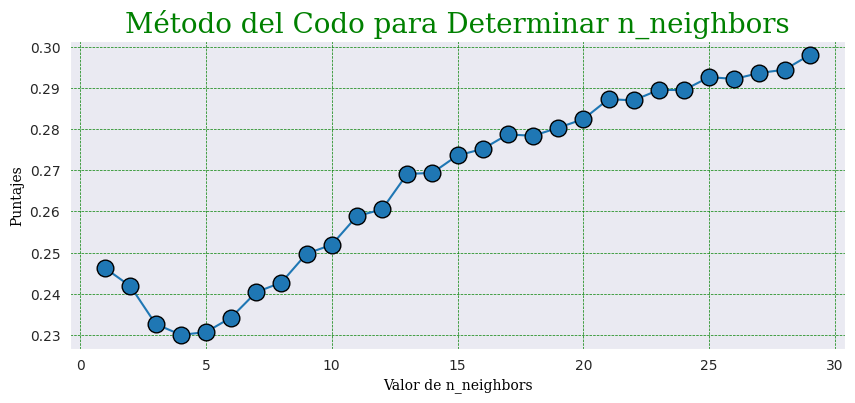

In [ ]:
# Armamos la figura

plt.figure(figsize=(10, 4))

# Graficamos los datos en los ejes

plt.plot(np.arange(1, 30), puntajes,
         marker='o', linestyle='-',
         ms = 12, mec = 'k')

# Personalizamos el gráfico

font_label = {'family':'serif','color':'k','size':10}
font_title = {'family':'serif','color':'g','size':20}

plt.xlabel('Valor de n_neighbors', fontdict=font_label)
plt.ylabel('Puntajes', fontdict=font_label)
plt.title('Método del Codo para Determinar n_neighbors', fontdict=font_title)
plt.grid(color='g', linestyle='--', linewidth = 0.5)

# Mostrar el gráfico

plt.show()

Podemos definir por el grafico que un valor de 4 o 5 es el mejor parámetro para n_neighbors.

In [ ]:
# Creamos la instancia del modelo

knnc = KNeighborsClassifier(n_neighbors=4, n_jobs=-1)

# Entrenar el modelo con los datos y la etiqueta

knnc.fit(x_train, y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=4)

In [ ]:
# Calculamos la puntuación de precisión

train_ascore = knnc.score(x_train, y_train)
test_ascore = knnc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred = knnc.predict(x_train)
y_test_pred = knnc.predict(x_test)

# Calculamos el f1 score

train_fscore = f1_score(y_train, y_train_pred, average='macro')
test_fscore = f1_score(y_test, y_test_pred, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore}")
print(f"Test - puntuación de precisión: {test_ascore}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore}")
print(f"Test - F1-Score: {test_fscore}")

Train - puntuación de precisión: 0.846625
Test - puntuación de precisión: 0.76995

Train - F1-Score: 0.8435009146148728
Test - F1-Score: 0.7621755110852083


El modelo obtuvo una precisión del 84% para el entrenamiento y de casi un 77% para la prueba. El F1-Score, nos dio un porcentaje en ambos similar, lo que nos da una medida general buena del desempeño del modelo.

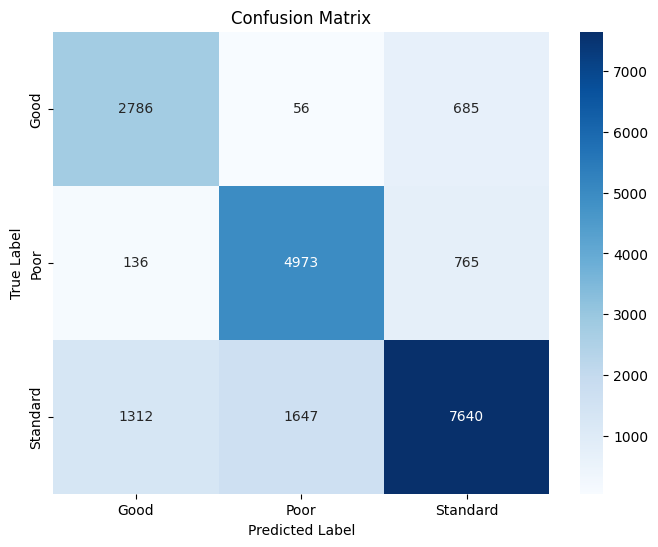



              precision    recall  f1-score   support

        Good       0.66      0.79      0.72      3527
        Poor       0.74      0.85      0.79      5874
    Standard       0.84      0.72      0.78     10599

    accuracy                           0.77     20000
   macro avg       0.75      0.79      0.76     20000
weighted avg       0.78      0.77      0.77     20000



In [ ]:
# Creamos la matriz de confusión

y_pred = knnc.predict(x_test)
cm_values = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(
    cm_values,columns=["Good", "Poor", "Standard"],
    index=["Good", "Poor", "Standard"]
    )
df_cm.index.name = "Actual"
df_cm.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test, y_pred, target_names=["Good", "Poor", "Standard"]))

Un 77% de exactitud es razonable para la muestra, es un buen porcentaje de elementos clasificados correctamente. La precisión es razonable para los puntajes Good y Poor, y  alta para Standard, lo que significa que es razonable en general el porcentaje de casos positivos detectados. En la sensibilidad o tasa de verdaderos positivos(Recall) encontramos que para Good hay una buena capacidad para identificar correctamente, y muy alta para Poor, pero en general el promedio de Recall es razonable para todas las características.

A partir de los resultados del F1-Score, podemos sacar algunas consideraciones:

1)	Good: Tiene baja precisión y un alto recall, el modelo detecta bien la clase, pero también incluye muestras de las otras.

2)	Poor: Tiene alta precisión y alto recall, el modelo maneja perfectamente esa clase.

3)	Standard: Tiene alta precisión y bajo recall, el modelo no detecta la clase muy bien, pero cuando lo hace es altamente confiable.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Para evitar el overfitting y underfitting en nuestro modelo, hemos dividido nuestros datos, además de contar con la suficiente cantidad de los mismos. Hemos calculado y ajustado los parámetros antes de aplicar nuestro modelo, hemos eliminado las variables innecesarias, ademas de haber evaluado los modelos mas adecuado para nuestros datos.

Podemos afirmar que el modelo no presenta un caso de overfit, así como tampoco de underfit, por los valores obtenidos en el reporte de clasificación.

>- ## DecisionTreeClassifier

Para el segundo modelo elegimos DecisionTreeClassifier, que nos permitirá comparar los resultados. En este caso para establecer los mejores parámetros que este modelo tiene(max_depth y min_sample_split) utilizaremos GridSearchCV, que según sus resultados obtendremos un modelo que se adapte mejor a nuestros datos.

In [ ]:
# Usaremos GridsearchCV para establecer los parámetros

parametros = {
  "max_depth" : [30, 35, 40],
  "min_samples_split" : [22, 44, 88],
  "min_samples_leaf" : [12, 24, 48],
  "criterion" : ["gini", "entropy"]
}

dtc_hp = DecisionTreeClassifier()

grilla = GridSearchCV(dtc_hp,
                      parametros,
                      cv=5,
                      return_train_score=True,
                      scoring='accuracy')

search = grilla.fit(x_train, y_train)

print(f'Parametros: {search.best_params_}\nPuntaje: {search.best_score_}')

Parametros: {'criterion': 'gini', 'max_depth': 40, 'min_samples_leaf': 12, 'min_samples_split': 22}
Puntaje: 0.7309249999999999


In [ ]:
# Graficamos los datos

cv_df = pd.DataFrame(search.cv_results_)

px.line(cv_df,
        y='mean_train_score',
        x='param_max_depth',
        color='param_criterion',
        width=800, height=400)

Luego de analizar los posibles parámetros, podemos utilizar un max_depth de 40. Un análisis de una mayor cantidad de parámetros podría darnos un mejor resultado, pero utilizaremos este para comparación. Otro posible método que podríamos usar en este caso es RandomizedSearchCV o HalvingGridSearchCV que probaremos mas adelante luego de evaluar todos los modelos.

In [ ]:
# Creamos la instancia del modelo

dtc = DecisionTreeClassifier(criterion='gini',
                             max_depth=40,
                             min_samples_split=22,
                             min_samples_leaf=12)

# Entrenamos el modelo con los datos y las etiquetas

dtc.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=40, min_samples_leaf=12, min_samples_split=22)

In [ ]:
# Calculamos la puntuación de precisión

train_ascore1 = dtc.score(x_train, y_train)
test_ascore1 = dtc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred1 = dtc.predict(x_train)
y_test_pred1 = dtc.predict(x_test)

# Calculamos el f1 score

train_fscore1 = f1_score(y_train, y_train_pred1, average='macro')
test_fscore1 = f1_score(y_test, y_test_pred1, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore1}")
print(f"Test - puntuación de precisión: {test_ascore1}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore1}")
print(f"Test - F1-Score: {test_fscore1}")

Train - puntuación de precisión: 0.82325
Test - puntuación de precisión: 0.739

Train - F1-Score: 0.8122951652242604
Test - F1-Score: 0.7233321626504751


Encontramos que el modelo tiene un puntaje de entrenamiento alto y un puntaje de prueba razonable con un casi 74%.
El F1-Score, nos dio un porcentaje en ambos solo un poco mas bajos, lo que nos da una medida general buena del desempeño del modelo.

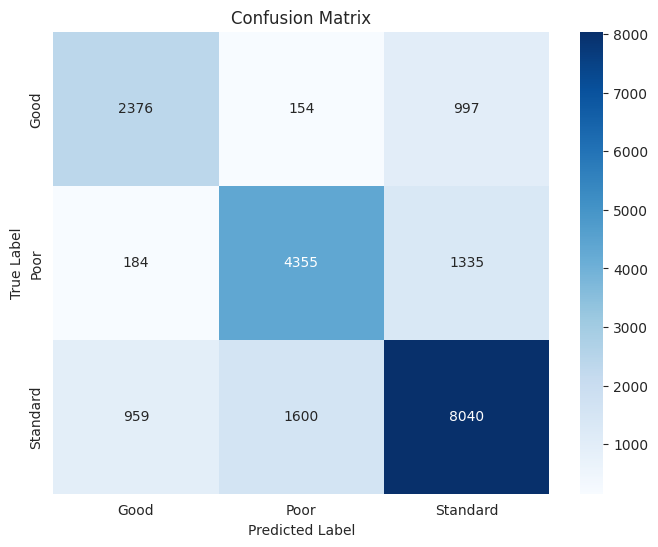



              precision    recall  f1-score   support

        Good       0.68      0.67      0.67      3527
        Poor       0.71      0.74      0.73      5874
    Standard       0.78      0.76      0.77     10599

    accuracy                           0.74     20000
   macro avg       0.72      0.72      0.72     20000
weighted avg       0.74      0.74      0.74     20000



In [ ]:
# Creamos la matriz de confusión

y_pred1 = dtc.predict(x_test)
cm_values1 = confusion_matrix(y_test, y_pred1)
df_cm1 = pd.DataFrame(
    cm_values1,columns=["Good", "Poor", "Standard"],
    index=["Good", "Poor", "Standard"]
    )
df_cm1.index.name = "Actual"
df_cm1.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm1, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test, y_pred1, target_names=["Good", "Poor", "Standard"]))

Encontramos un resultado de 74%, mas bajo que el anterior modelo. Tenemos que tener en cuenta que una mayor prueba de parámetros podría mejorar el resultado, razonable por el momento. En cuanto a la precisión y recall, los valores se encuentran razonablemente equilibrados, no habiendo casi diferencia en la capacidad del modelo para identificar correctamente las características.

A partir de los resultados del F1-Score, podemos sacar la conclucion de que el modelo no maneja las clases dentro de los mismos niveles, habiendo una diferencia marcada entre good y standard. El modelo maneja razonablemente las tres clases.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Hemos utilizado para evitar el overfitting y el underfitting las mismas consideraciones con los datos que usamos anteriormente para el otro modelo.

El resultado final del modelos es regular, con un valor de 74%, y podemos decir que no presenta un caso de overfit y tampoco de underfit, aunque puede no ser alto. Probando nuevos parámetros podría mejorarse.

>- ## RandomForestClassifier

Como tercer modelo elegimos RandomForest, que ajusta una serie de árboles de clasificación en varias submuestras del conjunto de datos y utiliza promedios para mejorar la precisión predictiva y controlar el sobreajuste. Para obtener los mejores parámetros, volveremos a utilizar inicialmente GridSearchCV.

In [ ]:
# Usaremos GridsearchCV para establecer los parámetros

hiperparametros = {
  "max_depth" : [15, 20, 25],
  "min_samples_leaf" : [5, 10, 15],
  "max_leaf_nodes" : [5, 10, 15],
  "n_estimators" : [100],
  "criterion" : ["gini", "entropy", "log_loss"],
}

rfc_hp = RandomForestClassifier()

grilla1 = GridSearchCV(rfc_hp,
                      hiperparametros,
                      cv=5,
                      return_train_score=True,
                      scoring='accuracy')

search1 = grilla1.fit(x_train, y_train)

print(f'Parametros: {search1.best_params_}\nPuntaje: {search1.best_score_}')

Parametros: {'criterion': 'gini', 'max_depth': 20, 'max_leaf_nodes': 15, 'min_samples_leaf': 10, 'n_estimators': 100}
Puntaje: 0.6593375


In [ ]:
# Graficamos los datos

cv_df1 = pd.DataFrame(search1.cv_results_)

px.line(cv_df1,
        y='mean_train_score',
        x='param_max_depth',
        color='param_criterion',
        width=800, height=400)

In [ ]:
# Fit el mejor modelo

modelo_rfc = grilla1.best_estimator_
modelo_rfc.fit(x_train, y_train)

RandomForestClassifier(max_depth=20, max_leaf_nodes=15, min_samples_leaf=10)

In [ ]:
# Realizamos predicciones

rfc_y_train_pred = modelo_rfc.predict(x_train)
rfc_y_test_pred = modelo_rfc.predict(x_test)

# Calculamos la precisión

accuracy_rfc = accuracy_score(y_test, rfc_y_test_pred)

print('RandomForestClassifier accuracy score: {0:0.3f}'.format(accuracy_rfc))

RandomForestClassifier accuracy score: 0.657


Luego de hacer un análisis inicial con los primeros parámetros, no utilizaremos la información, ni continuaremos con la evaluación de las métricas, ya que los resultados no son buenos en comparación a los anteriores modelos, y una prueba de una variedad de hyperparametros o una mayor cantidad de ellos, requiere de muchos recursos computacionales y de un tiempo de ejecución demasiado alto (Horas). Aunque probablemente podríamos mejorar el resultado utilizando diferentes herramientas como HalvingGridSearchCV, esperaremos a terminar de probar los demás modelos. Para poder tener una mejor visión del desempeño del modelo, lo probaremos con los parámetros default para analizar el resultado.

In [ ]:
# Creamos la instancia del modelo

rfc = RandomForestClassifier()

# Entrenar el modelo con los datos y la etiqueta

rfc.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
# Calculamos la puntuación de precisión

train_ascore2 = rfc.score(x_train, y_train)
test_ascore2 = rfc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred2 = rfc.predict(x_train)
y_test_pred2 = rfc.predict(x_test)

# Calculamos el f1 score

train_fscore2 = f1_score(y_train, y_train_pred2, average='macro')
test_fscore2 = f1_score(y_test, y_test_pred2, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore2}")
print(f"Test - puntuación de precisión: {test_ascore2}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore2}")
print(f"Test - F1-Score: {test_fscore2}")

Train - puntuación de precisión: 1.0
Test - puntuación de precisión: 0.81115

Train - F1-Score: 1.0
Test - F1-Score: 0.8020687671688057


Probando el modelo con los parámetros default, encontramos que tiene un puntaje tanto para el entrenamiento, como para la prueba, altos. Evaluaremos las métricas a continuacion, además de probar mas adelante otras herramientas para evaluar los hyperparametros teniendo en cuenta estos resultados.

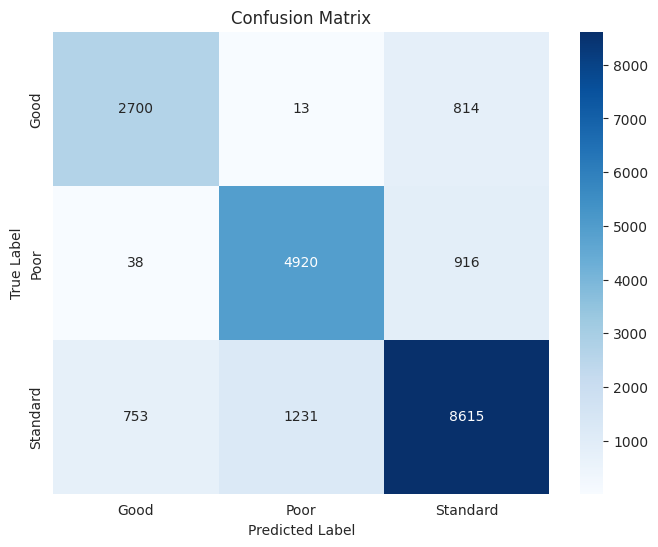



              precision    recall  f1-score   support

        Good       0.77      0.77      0.77      3527
        Poor       0.80      0.84      0.82      5874
    Standard       0.83      0.81      0.82     10599

    accuracy                           0.81     20000
   macro avg       0.80      0.81      0.80     20000
weighted avg       0.81      0.81      0.81     20000



In [ ]:
# Creamos la matriz de confusión

y_pred2 = rfc.predict(x_test)
cm_values2 = confusion_matrix(y_test, y_pred2)
df_cm2 = pd.DataFrame(
    cm_values2,columns=["Good", "Poor", "Standard"],
    index=["Good", "Poor", "Standard"]
    )
df_cm2.index.name = "Actual"
df_cm2.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm2, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test, y_pred2, target_names=["Good", "Poor", "Standard"]))

Encontramos un resultado de 81%, el mas alto de los modelos probados. En cuanto a la precisión y recall, los valores se encuentran equilibrados, no habiendo casi diferencia en la capacidad del modelo para identificar correctamente las características.

A partir de los resultados del F1-Score, podemos sacar la conclucion de que el modelo maneja las clases dentro de los mismos niveles, no habiendo una diferencia marcada. El modelo maneja muy bien las tres clases.

Analizando la matriz, encontramos que tanto los FP como los FN para las clases Good y Poor son los más bajos, siendo estos los valores más importantes a la hora de evaluar el margen de error tolerable. Persiste la confusión para la clase Standard, que puede deberse al desbalanceo de las clases.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Hemos utilizado para evitar el overfitting y el underfitting las mismas consideraciones con los datos que usamos anteriormente para los otro modelos.

El resultado final del modelo es muy bueno, con un accuracy del 81%, y podemos decir que no presenta un caso de overfit para la prueba y tampoco de underfit. Aunque encontramos un claro caso de sobreajuste para el entrenamiento.

>- ## LinearSVC

No utilizaremos SVC porque el tiempo de ajuste escala al menos cuadráticamente con el número de muestras y puede resultar poco práctico más allá de decenas de miles de muestras. Para conjuntos de datos grandes, es mejor usar LinearSVC o SGDClassifier en su lugar. Linear Support Vector Classification, tiene más flexibilidad en la elección de penalizaciones y funciones de pérdida y debería escalar mejor a una gran cantidad de muestras. El soporte multiclase se maneja según un esquema de uno contra el resto. Para obtener los mejores parámetros, vamos a utilizar GridSearchCV, pero comenzaremos utilizando el modelo en default para conocer mejor los parametros y comparar resultados.

In [ ]:
# Creamos la instancia del modelo

lsvc = LinearSVC()

# Entrenar el modelo con los datos y la etiqueta

lsvc.fit(x_train, y_train)

LinearSVC()

In [ ]:
# Calculamos la puntuación de precisión

train_ascore3 = lsvc.score(x_train, y_train)
test_ascore3 = lsvc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred3 = lsvc.predict(x_train)
y_test_pred3 = lsvc.predict(x_test)

# Calculamos el f1 score

train_fscore3 = f1_score(y_train, y_train_pred3, average='macro')
test_fscore3 = f1_score(y_test, y_test_pred3, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore3}")
print(f"Test - puntuación de precisión: {test_ascore3}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore3}")
print(f"Test - F1-Score: {test_fscore3}")

Train - puntuación de precisión: 0.6350625
Test - puntuación de precisión: 0.63155

Train - F1-Score: 0.5990814216767539
Test - F1-Score: 0.5954967960442562


In [ ]:
lsvc.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': True,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'loss': 'squared_hinge',
 'max_iter': 1000,
 'multi_class': 'ovr',
 'penalty': 'l2',
 'random_state': None,
 'tol': 0.0001,
 'verbose': 0}

Encontramos el modelo con un puntaje de entrenamiento y de prueba muy bajos, pero similares. El F1-Score, nos dio un porcentaje en ambos mas bajo, lo que nos da una medida general mala del desempeño del modelo.

Pudimos revisar los parametros, y con la documentacion establecer algunos hyperparametros para probar a contunuación.

In [ ]:
# Usaremos GridsearchCV para establecer los parámetros

hiperparametros1 = {
  "penalty" : ["l1", "l2"],
  "loss" : ["hinge", "squared_hinge"],
  "dual": [0, 1],
}

lsvc_hp = LinearSVC()

grilla2 = GridSearchCV(lsvc_hp,
                      hiperparametros1,
                      cv=5,
                      return_train_score=True,
                      scoring='accuracy')

search2 = grilla2.fit(x_train, y_train)

print(f'Parametros: {search2.best_params_}\nPuntaje: {search2.best_score_}')

Parametros: {'dual': 1, 'loss': 'hinge', 'penalty': 'l2'}
Puntaje: 0.6394


In [ ]:
# Fit el mejor modelo

modelo_lsvc = grilla2.best_estimator_
modelo_lsvc.fit(x_train, y_train)

LinearSVC(dual=1, loss='hinge')

In [ ]:
# Calculamos la puntuación de precisión

train_ascore4 = modelo_lsvc.score(x_train, y_train)
test_ascore4 = modelo_lsvc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred4 = modelo_lsvc.predict(x_train)
y_test_pred4 = modelo_lsvc.predict(x_test)

# Calculamos el f1 score

train_fscore4 = f1_score(y_train, y_train_pred4, average='macro')
test_fscore4 = f1_score(y_test, y_test_pred4, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore4}")
print(f"Test - puntuación de precisión: {test_ascore4}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore4}")
print(f"Test - F1-Score: {test_fscore4}")

Train - puntuación de precisión: 0.6368
Test - puntuación de precisión: 0.6343

Train - F1-Score: 0.6139908651061444
Test - F1-Score: 0.6114889717812731


No encontramos mucha diferencia en los resultados luego de probar diferentes parámetros para nuestro modelo. El entrenamiento y prueba se mantuvieron igual, y con respecto al f1-score los resultados mejoraron un poco respecto a los anteriores. El modelo sigue teniendo un mal desempeño.

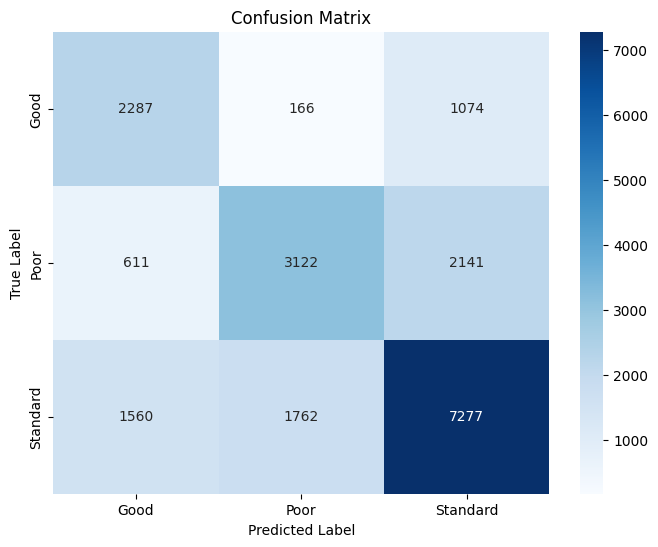



              precision    recall  f1-score   support

        Good       0.51      0.65      0.57      3527
        Poor       0.62      0.53      0.57      5874
    Standard       0.69      0.69      0.69     10599

    accuracy                           0.63     20000
   macro avg       0.61      0.62      0.61     20000
weighted avg       0.64      0.63      0.63     20000



In [ ]:
# Creamos la matriz de confusión

y_pred3 = modelo_lsvc.predict(x_test)
cm_values3 = confusion_matrix(y_test, y_pred3)
df_cm3 = pd.DataFrame(cm_values3,
                      columns=["Good", "Poor", "Standard"],
                      index=["Good", "Poor", "Standard"])
df_cm3.index.name = "Actual"
df_cm3.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm3, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test,
                            y_pred3,
                            target_names=["Good", "Poor", "Standard"]))

Un accuracy de 63% es bajo para la muestra, es un porcentaje bajo de elementos clasificados correctamente. La precisión y el Recall son bajos en general para todas las características.

A partir de los resultados del F1-Score, podemos definir que el modelo no detecta bien las clases ademas de incluir muestras de las otras.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Hemos utilizado para evitar el overfitting y el underfitting las mismas consideraciones con los datos que usamos anteriormente para los otro modelos.

El resultado final del modelo no es muy bueno, con un accuracy del 63%, y podemos decir que no presenta un caso de overfit para la prueba, pero podemos encontrar un posible caso de underfit.

>- ## HistGradientBoostingClassifier

Scikit-learn proporciona dos implementaciones de árboles impulsados ​​por gradiente: HistGradientBoostingClassifier vs GradientBoostingClassifier para clasificación y las clases correspondientes para regresión. El primero puede ser órdenes de magnitud más rápido que el segundo cuando el número de muestras es mayor que decenas de miles de muestras.

Es posible que se prefieran gradientboostingclassifier y gradientboostingregressor para tamaños de muestra pequeños, ya que la agrupación puede generar puntos de división demasiado aproximados en esta configuración.

In [ ]:
# Creamos la instancia del modelo

hgbc = HistGradientBoostingClassifier()

# Entrenar el modelo con los datos y la etiqueta

hgbc.fit(x_train, y_train)

HistGradientBoostingClassifier()

In [ ]:
# Realizamos predicciones

hgbc_y_train_pred = hgbc.predict(x_train)
hgbc_y_test_pred = hgbc.predict(x_test)

# Calculamos la precisión

accuracy_hgbc = accuracy_score(y_test, hgbc_y_test_pred)

print('HistGradientBoostingClassifier accuracy score: {0:0.3f}'.format(accuracy_hgbc))

HistGradientBoostingClassifier accuracy score: 0.747


Probamos inicialmente el modelo con los parámetros default, y los resultados son buenos. Continuaremos utilizando GridsearchCV para probar diferentes hyperparametros. Las herramientas HalvingGridSearchCV y RandomizedSearchCV las utilizaremos y probaremos mas adelante una ves probados los modelos y echa nuestra seleccion.

In [ ]:
# Usaremos GridsearchCV para establecer los parámetros

hiperparametros2 = {
    'max_iter' : [100, 150],
    'max_leaf_nodes' : [31, 41],
    'max_depth' : [10, 15],
    'min_samples_leaf' : [20, 30]
}

grilla3 = GridSearchCV(hgbc,
                      hiperparametros2,
                      cv=5,
                      return_train_score=True,
                      scoring='accuracy')

search3 = grilla3.fit(x_train, y_train)

print(f'Parametros: {search3.best_params_}\nPuntaje: {search3.best_score_}')

Parametros: {'max_depth': 15, 'max_iter': 150, 'max_leaf_nodes': 41, 'min_samples_leaf': 20}
Puntaje: 0.7635


In [ ]:
# Fit el mejor modelo

modelo_hgbc = grilla3.best_estimator_
modelo_hgbc.fit(x_train, y_train)

HistGradientBoostingClassifier(max_depth=15, max_iter=150, max_leaf_nodes=41)

In [ ]:
# Calculamos la puntuación de precisión

train_ascore5 = modelo_hgbc.score(x_train, y_train)
test_ascore5 = modelo_hgbc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred5 = modelo_hgbc.predict(x_train)
y_test_pred5 = modelo_hgbc.predict(x_test)

# Calculamos el f1 score

train_fscore5 = f1_score(y_train, y_train_pred5, average='macro')
test_fscore5 = f1_score(y_test, y_test_pred5, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore5}")
print(f"Test - puntuación de precisión: {test_ascore5}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore5}")
print(f"Test - F1-Score: {test_fscore5}")

Train - puntuación de precisión: 0.8264375
Test - puntuación de precisión: 0.7684

Train - F1-Score: 0.8191490695168547
Test - F1-Score: 0.7566053175890581


Luego de probar diferentes hyperparametros logramos mejorar un poco el resultado, probando una mayor cantidad podría mejorarse aun más.  Los resultados son similares a los vistos con knnc para la prueba y solo un poco más bajo para el entrenamiento. El F1-Score dio porcentajes solo un poco mas bajos, dando un desempeño bueno del modelo.

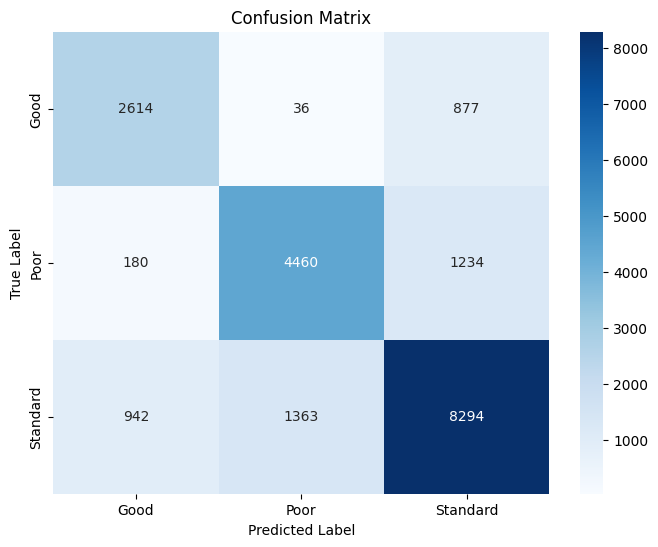



              precision    recall  f1-score   support

        Good       0.70      0.74      0.72      3527
        Poor       0.76      0.76      0.76      5874
    Standard       0.80      0.78      0.79     10599

    accuracy                           0.77     20000
   macro avg       0.75      0.76      0.76     20000
weighted avg       0.77      0.77      0.77     20000



In [ ]:
# Creamos la matriz de confusión

y_pred4 = modelo_hgbc.predict(x_test)
cm_values4 = confusion_matrix(y_test, y_pred4)
df_cm4 = pd.DataFrame(cm_values4,
                      columns=["Good", "Poor", "Standard"],
                      index=["Good", "Poor", "Standard"])
df_cm4.index.name = "Actual"
df_cm4.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm4, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test,
                            y_pred4,
                            target_names=["Good", "Poor", "Standard"]))

Como mencionamos anteriormente, el resultado es similar en general a knnc, con un 77% de exactitud. La precisión y recall, se encuentran razonablemente equilibrados, no habiendo una diferencia en la capacidad del modelo para identificar correctamente las características. Los resultados del F1-Score son similares, el modelo maneja las clases dentro de los mismos niveles. También podemos observar una mayor confucion para la clase Good a diferencia de otros modelos.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Hemos utilizado para evitar el overfitting y el underfitting las mismas consideraciones con los datos que usamos anteriormente para los demas modelos.

El resultado final es bueno, con un valor de 77%, y no presenta un caso de sobreajuste. Evaluando nuevos parámetros podría mejorarse.

>- ## XGBClassifier

XGBoost significa "Impulso de gradiente extremo", donde el término "Impulso de gradiente" proviene del artículo Greedy Function Approximation: A Gradient Boosting Machine, de Friedman.

Es uno de los algoritmos supervisados de Machine Learning que más se usan en la actualidad. Esto se debe por su facilidad de implementación, sus buenos resultados.

In [ ]:
# Creamos la instancia del modelo

xgbc = xgb.XGBClassifier()

# Entrenar el modelo con los datos y la etiqueta

xgbc.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
# Realizamos predicciones

xgbc_y_train_pred = xgbc.predict(x_train)
xgbc_y_test_pred = xgbc.predict(x_test)

# Calculamos la precisión

accuracy_xgbc = accuracy_score(y_test, xgbc_y_test_pred)

print('XGBClassifier accuracy score: {0:0.3f}'.format(accuracy_xgbc))

XGBClassifier accuracy score: 0.763


Hemos probado el modelo utilizando los parámetros default y obtuvimos un 76%, siendo un buen resultado. a continuación, al igual que con el resto de los modelos probaremos algunos hyperparametros, para ver si podemos mejorar el resultado. Además de evaluar la matriz de confusión.

In [ ]:
# Usaremos GridsearchCV para establecer los parámetros

hiperparametros3 = {
    'n_estimators': [100],
    'max_depth' : [6, 8],
    'gamma' : [0, 1],
    'alpha' : [0, 1],
    'subsample' : [0.5, 1],
    'scale_pos_weight' : [1, 2]
}

grilla4 = GridSearchCV(xgbc,
                      hiperparametros3,
                      cv=5,
                      return_train_score=True,
                      scoring='accuracy')

search4 = grilla4.fit(x_train, y_train)

print(f'Parametros: {search4.best_params_}\nPuntaje: {search4.best_score_}')

Parametros: {'alpha': 1, 'gamma': 0, 'max_depth': 8, 'n_estimators': 100, 'scale_pos_weight': 1, 'subsample': 1}
Puntaje: 0.7836875


In [ ]:
# Fit el mejor modelo

modelo_xgbc = grilla4.best_estimator_
modelo_xgbc.fit(x_train, y_train)

XGBClassifier(alpha=1, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
# Calculamos la puntuación de precisión

train_ascore6 = modelo_xgbc.score(x_train, y_train)
test_ascore6 = modelo_xgbc.score(x_test, y_test)

# Obtenemos predicción del modelo

y_train_pred6 = modelo_xgbc.predict(x_train)
y_test_pred6 = modelo_xgbc.predict(x_test)

# Calculamos el f1 score

train_fscore6 = f1_score(y_train, y_train_pred6, average='macro')
test_fscore6 = f1_score(y_test, y_test_pred6, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {train_ascore6}")
print(f"Test - puntuación de precisión: {test_ascore6}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {train_fscore6}")
print(f"Test - F1-Score: {test_fscore6}")

Train - puntuación de precisión: 0.9041
Test - puntuación de precisión: 0.7939

Train - F1-Score: 0.9018982350422154
Test - F1-Score: 0.7849441414896808


Logramos al igual que con los demás modelos mejorar el rendimiento, pero se deberían seguir probando diferentes combinaciones de hyperparametros para un resultado superior. conseguimos un 90% para el entrenamiento, lo que es un muy buen resultado, junto con un casi 80% para la prueba. El F1-Score, nos dio un porcentaje en ambos similar, por lo que podemos concluir, en que el modelo tiene una muy buena medida general de desempeño.

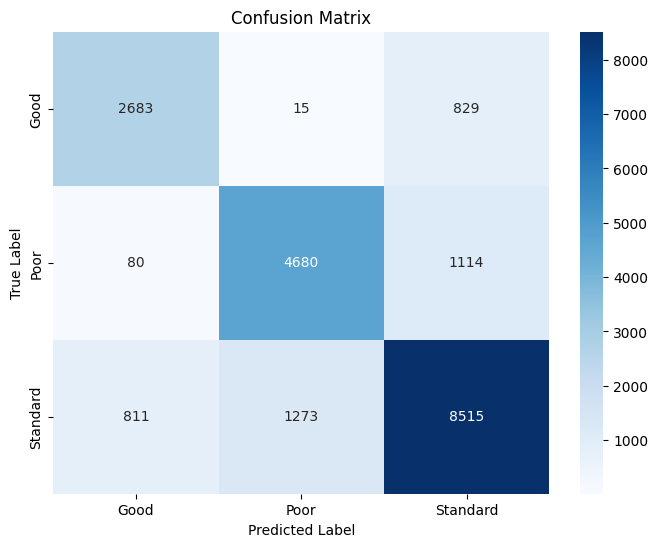



              precision    recall  f1-score   support

        Good       0.75      0.76      0.76      3527
        Poor       0.78      0.80      0.79      5874
    Standard       0.81      0.80      0.81     10599

    accuracy                           0.79     20000
   macro avg       0.78      0.79      0.78     20000
weighted avg       0.79      0.79      0.79     20000



In [ ]:
# Creamos la matriz de confusión

y_pred5 = modelo_xgbc.predict(x_test)
cm_values5 = confusion_matrix(y_test, y_pred5)
df_cm5 = pd.DataFrame(cm_values5,
                      columns=["Good", "Poor", "Standard"],
                      index=["Good", "Poor", "Standard"])
df_cm5.index.name = "Actual"
df_cm5.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(df_cm5, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test,
                            y_pred5,
                            target_names=["Good", "Poor", "Standard"]))

Con un casi 80 % de exactitud, es un muy buen resultado para la muestra, para la cantidad de elementos clasificados correctamente. El segundo resultado más alto de los modelos probados. Tanto la precisión como la sensibilidad o tasa de verdaderos positivos, encontramos una muy buena capacidad para identificar correctamente en general todas las caracteristicas. En el F1-Score podemos encontrar que el modelo maneja las clases dentro de los mismos niveles, es decir, no hay una diferencia marcada en como el modelo maneja las tres clases.

### Overfitting (sobreajuste) / Underfitting (subajuste)

Hemos utilizado para evitar el overfitting y el underfitting las mismas consideraciones con los datos que usamos anteriormente para los otro modelos.

Con un resultado del 79%, podemos concluir que no presenta un caso de sobreajuste, ni tampoco de subajuste.

---
<center>
 <h1><font color= "green" size="+5">Modelado</font></h1>
</center>

A continuación extenderemos el modelado con los dos modelos que hemos seleccionado a partir de los resultados iniciales que obtuvimos. Luego probaremos no solo una mayor variedad de hyperparametros, sino que además utilizaremos diferentes herramientas para perfeccionar nuestros modelos y sus resultados.

In [ ]:
# Comparamos el puntaje de los modelos

modelo_1 = accuracy_score(y_test, y_test_pred)
modelo_2 = accuracy_score(y_test, y_test_pred1)
modelo_3 = accuracy_score(y_test, y_test_pred2)
modelo_4 = accuracy_score(y_test, y_test_pred4)
modelo_5 = accuracy_score(y_test, y_test_pred5)
modelo_6 = accuracy_score(y_test, y_test_pred6)

print(
    f'NearestNeighborsClassifier accuracy score: {0:0.3f}'.format(modelo_1),
    '\nDecisionTreeClassifier accuracy score: {0:0.3f}'.format(modelo_2),
    '\nRandomForestClassifier accuracy score: {0:0.3f}'.format(modelo_3),
    '\nLinearSVC accuracy score: {0:0.3f}'.format(modelo_4),
    '\nHistGradientBoostingClassifier accuracy score: {0:0.3f}'.format(modelo_5),
    '\nXGBClassifier accuracy score: {0:0.3f}'.format(modelo_6)
)

NearestNeighborsClassifier accuracy score: 0.000 
DecisionTreeClassifier accuracy score: 0.739 
RandomForestClassifier accuracy score: 0.811 
LinearSVC accuracy score: 0.634 
HistGradientBoostingClassifier accuracy score: 0.768 
XGBClassifier accuracy score: 0.794


>- ## Primer modelo seleccionado: RandomForestClassifier

Comenzaremos con el primer modelo que seleccionamos a partir de los resultados, con un 81% de accuracy. Ahora buscaremos mejorar ese resultado utilizando otras herramientas, además de probar una nueva combinación de variables, teniendo en cuenta la correlación y la importancia de las variables que analizaremos a continuación. Además, analizaremos la curva roc y auc de RandomForestClassifier, siendo este el modelo con el que mejores resultados hemos obtenidos, en comparativa con otro modelo para tener un mayor análisis del mismo.

### Curva ROC y AUC

Trataremos las curvas de características operativas del receptor (ROC), que se basan en la idea de una matriz de confusión, pero nos proporcionan información más detallada que nos permite mejorar nuestros modelos en mayor medida.

El formato multiclase no está soportado en el cálculo de la curva ROC. La función roc_curve no admite directamente la clasificación multiclase cuando se pasa un array de probabilidades predict_proba directamente a la función.

La curva ROC y el cálculo de AUC generalmente se utilizan para problemas de clasificación binaria. Para problemas de clasificación multiclase, el cálculo del AUC puede realizarse como el promedio de AUC de cada clase individualmente contra el resto, pero no se aplica a problemas multiclase de la misma manera que en problemas binarios.

Una forma común de lidiar con el cálculo de AUC en problemas multiclase es utilizar One-Versus-Rest (OvR) o One-Versus-All (OvA) para calcular AUC individualmente para cada clase en comparación con las demás clases.

In [ ]:
# Entrenamos el clasificador OneVsRest para NearestNeighborsClassifier

ovr_knnc = OneVsRestClassifier(knnc)
ovr_knnc.fit(x_train, y_train)

# Predicciones de probabilidades para cada clase

knnc_probs = ovr_knnc.predict_proba(x_test)

# Calculando el AUC

auc_score_knnc = roc_auc_score(y_test,
                               knnc_probs,
                               average='macro',
                               multi_class='ovr')

In [ ]:
# Entrenamos el clasificador OneVsRest para RandomForestClassifier

ovr_rfc = OneVsRestClassifier(rfc)
ovr_rfc.fit(x_train, y_train)

# Predicciones de probabilidades para cada clase

rfc_probs = ovr_rfc.predict_proba(x_test)

# Calculando el AUC

auc_score_rfc = roc_auc_score(y_test,
                              rfc_probs,
                              average='macro',
                              multi_class='ovr')

Utilizamos dos modelos para poder comparar resultados, y el parámetro average='macro' para calcular el AUC promediando los AUC de cada clase, tratando cada clase como si fuera la clase positiva en comparación con el resto.

In [ ]:
# Imprimimos el resultado del AUC para knnc

print(79 * "_")
print(f'\nAUC para NearestNeighborsClassifier: %.3f' % (auc_score_knnc))

# Imprimimos el resultado del AUC para rfc

print(f'\nAUC para RandomForestClassifier: %.3f\n' % (auc_score_rfc))
print(79 * "_")

_______________________________________________________________________________

AUC para NearestNeighborsClassifier: 0.892

AUC para RandomForestClassifier: 0.924

_______________________________________________________________________________


Los resultados no difieren de los ya obtenidos evaluando las métricas anteriores. Probaremos otro enfoque para graficar y calcular las curvas ROC y los AUC individuales para cada clase.

In [ ]:
# Calcular las curvas ROC y AUC para NearestNeighborsClassifier

fpr_knnc = dict()
tpr_knnc = dict()
roc_auc_knnc = dict()

n_classes = len(np.unique(y_test))

for i in range(n_classes):
    fpr_knnc[i], tpr_knnc[i], _ = roc_curve(y_test, knnc_probs[:, i], pos_label=i)
    roc_auc_knnc[i] = auc(fpr_knnc[i], tpr_knnc[i])

# Calcular las curvas ROC y AUC para RandomForestClassifier

fpr_rfc = dict()
tpr_rfc = dict()
roc_auc_rfc = dict()

for i in range(n_classes):
    fpr_rfc[i], tpr_rfc[i], _ = roc_curve(y_test, rfc_probs[:, i], pos_label=i)
    roc_auc_rfc[i] = auc(fpr_rfc[i], tpr_rfc[i])

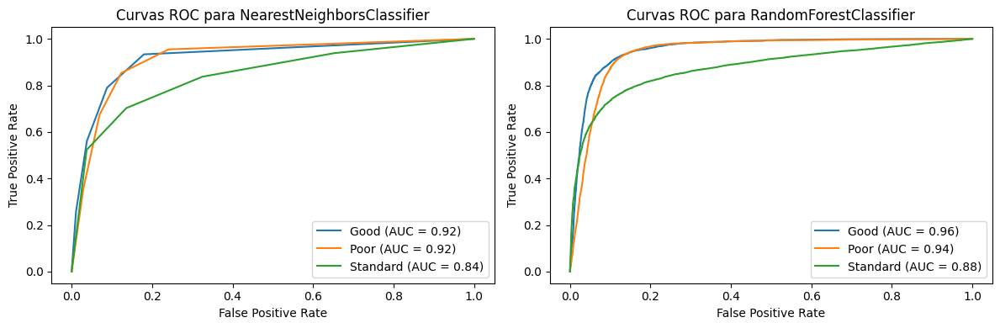

In [ ]:
# Mapeamos las clases para los graficos

class_names = {
    0: 'Good',
    1: 'Poor',
    2: 'Standard'
}

# Creamos las figuras y los ejes

fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# Graficamos las curvas ROC para NearestNeighborsClassifier

for i in range(n_classes):
    axs[0].plot(fpr_knnc[i], tpr_knnc[i], label=f'{class_names[i]} (AUC = {roc_auc_knnc[i]:.2f})')

axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].set_title('Curvas ROC para NearestNeighborsClassifier')
axs[0].legend(loc='best')

# Graficamos las curvas ROC para RandomForestClassifier

for i in range(n_classes):
    axs[1].plot(fpr_rfc[i], tpr_rfc[i], label=f'{class_names[i]} (AUC = {roc_auc_rfc[i]:.2f})')

axs[1].set_xlabel('False Positive Rate')
axs[1].set_ylabel('True Positive Rate')
axs[1].set_title('Curvas ROC para RandomForestClassifier')
axs[1].legend(loc='best')

# Ajustar y mostrar el gráfico

plt.tight_layout()
plt.show()

Podemos observar, como ya pudimos analizarlo previamente con la 'confusion_matrix' y el 'classification_report, que los modelos manejan muy bien las clases 'Good' y 'Poor', pero tienen una confusión con la clase 'Standard'. Puede deberse al desbalanceo de la variable objetivo. Podríamos aplicar SMOTE y RandomOverSampler para balancear los datos y ver como se comportan los modelos, evaluandolos nuevamente con un reporte.

### Feature importance

Las importancias de las características las proporciona el atributo ajustado feature_importances_ y se calculan como la media y la desviación estándar de la acumulación de la disminución de impurezas dentro de cada árbol.

Las importancias de las características basadas en impurezas pueden ser engañosas para características de alta cardinalidad (muchos valores únicos). Como alternativa, la importancia de la característica de permutación, supera las limitaciones de la importancia de las características basadas en impurezas: no tienen un sesgo hacia características de alta cardinalidad y se pueden calcular en un conjunto de pruebas omitido.

Link: [Feature importances with a forest of trees](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html)

Link: [Random Forest Feature Importance](https://mljar.com/blog/feature-importance-in-random-forest/)

In [ ]:
fi_rfc = rfc.feature_importances_

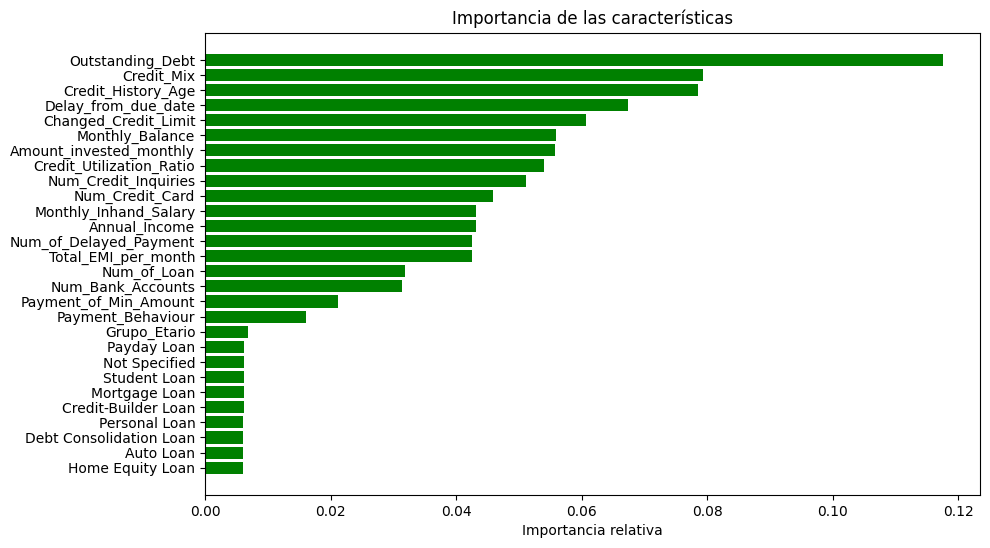

In [ ]:
# Graficamos la importancia

indices = np.argsort(fi_rfc)
features = df_credit_end.columns.tolist()
columnas = [features[i] for i in indices]

plt.figure(figsize=(10, 6))
plt.title('Importancia de las características')
plt.barh(range(len(indices)), fi_rfc[indices], color='g', align='center')
plt.yticks(range(len(indices)), columnas)
plt.xlabel('Importancia relativa')
plt.show()

Podemos observar que los diferentes tipos de préstamo no tienen tanto peso en nuestro modelo, se podría prescindir de esas features y probar si mejoramos el resultado, teniendo en cuenta que además ya habíamos observado que no tienen una correlación casi de cero, mismo ejemplo se da con la variable Grupo etario. Tanto la deuda pendiente como el ingreso anual muestran una importancia relevante para el modelo, un dato importante teniendo en cuenta su correlación. Una posible explicación podría ser la alta cardinalidad de las variables.

A continuación evaluaremos la importancia de las variables por la importancia basada en impurezas y la importancia de las características basada en la permutación de características.

In [ ]:
inicio = time.time()
std = np.std([tree.feature_importances_ for tree in rfc.estimators_], axis=0)
tiempo_transcurrido = time.time() - inicio

print(f"Tiempo transcurrido para computar las importancias: {tiempo_transcurrido:.3f} segundos")

Tiempo transcurrido para computar las importancias: 0.129 segundos


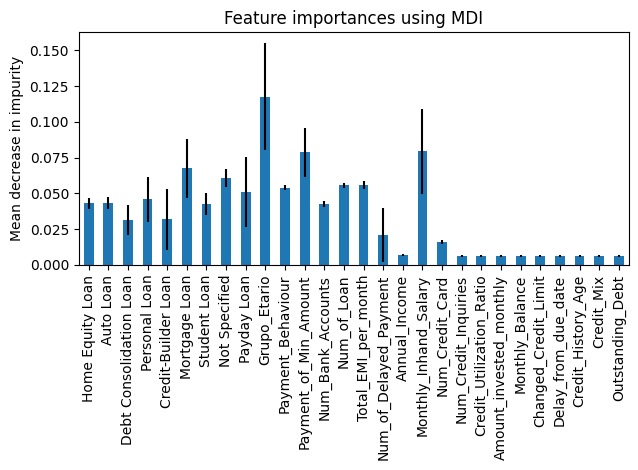

In [ ]:
# Graficamos la importancia basada en impurezas

forest_importances = pd.Series(fi_rfc, index=columnas)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [ ]:
# Importancia de las características basada en la permutación de características

inicio1 = time.time()
resultado = permutation_importance(
    rfc, x_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
tiempo_transcurrido1 = time.time() - inicio1
print(f"Tiempo transcurrido para computar las importancias: {tiempo_transcurrido1:.3f} seconds")

Tiempo transcurrido para computar las importancias: 219.520 seconds


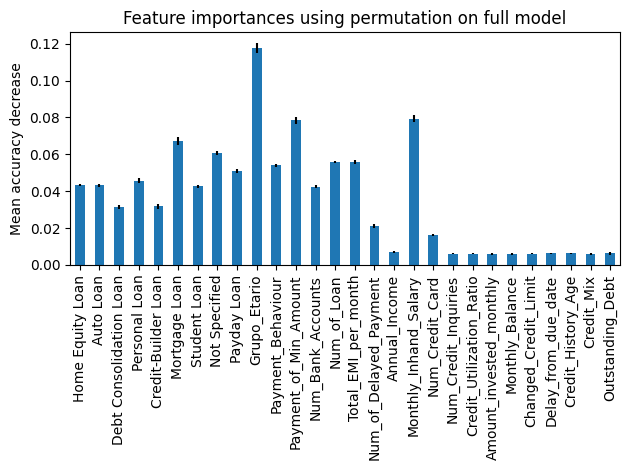

In [ ]:
# Graficamos la permutación de características

forest_importances1 = pd.Series(resultado.importances_mean, index=columnas)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=resultado.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

La importancia basada en la permutación es computacionalmente costosa. El método basado en permutación puede tener problemas con características altamente correlacionadas, puede reportarlas como sin importancia, este podria ser el caso y explicacion para las variables Credit_mix, Credit_History_Age, Delay_from_due_date, Changed_credit_limit. Podemos observar que las variables de los diferentes tipos de prestamo tienen un peso mayor en este caso, al igual que para grupo etario.

Analizando los resultados no encontramos algo concluso, teniendo en cuenta tanto la correlación (conservamos variables mas allá de su correlación por una cuestión de análisis financiero y la importancia de las mismas) y la importancia de las variables, como para tomar una decisión de reducir una mayor cantidad de las mismas. Aun así probaremos el modelo con una reducción de features a partir de su correlación y los resultados generales.

In [ ]:
# Separamos la variable objetivo de las features

x_credit_fi = df_credit_end.drop(columns=['Annual_Income',
                                          'Credit_Utilization_Ratio',
                                          'Total_EMI_per_month',
                                          'Credit_Score'])

y_credit_fi = df_credit_end['Credit_Score']

# Separamos los datos en conjuntos de entrenamiento y prueba

x_train_fi, x_test_fi, y_train_fi, y_test_fi = train_test_split(
    x_credit_fi, y_credit_fi,test_size=0.2,random_state=42
    )

In [ ]:
# Creamos la instancia del modelo

rfc_fi = RandomForestClassifier()

# Entrenar el modelo con los datos y la etiqueta

rfc_fi.fit(x_train_fi, y_train_fi)

RandomForestClassifier()

In [ ]:
# Realizamos predicciones

rfc_fi_y_train_pred = rfc_fi.predict(x_train_fi)
rfc_fi_y_test_pred = rfc_fi.predict(x_test_fi)

# Calculamos la precisión

accuracy_rfc_fi = accuracy_score(y_test_fi, rfc_fi_y_test_pred)

print('RandomForestClassifier accuracy score: {0:0.3f}'.format(accuracy_rfc_fi))

RandomForestClassifier accuracy score: 0.809


In [ ]:
#Calculamos la puntuación de precisión.

train_ascore_fi = rfc_fi.score(x_train_fi, y_train_fi)
test_ascore_fi = rfc_fi.score(x_test_fi, y_test_fi)

#Resultado de train y test de puntuación de precisión.

print(f"Train - puntuación de precisión: {train_ascore_fi}")
print(f"Test - puntuación de precisión: {test_ascore_fi}")

Train - puntuación de precisión: 0.9999625
Test - puntuación de precisión: 0.80905


In [ ]:
# Evaluamos el rendimiento del modelo

print("Resultados de rfc_fi\n", 79 * "_")
print(classification_report(y_test_fi, rfc_fi_y_test_pred))

Resultados de rfc_fi
 _______________________________________________________________________________
              precision    recall  f1-score   support

           0       0.78      0.76      0.77      3527
           1       0.80      0.83      0.81      5874
           2       0.83      0.81      0.82     10599

    accuracy                           0.81     20000
   macro avg       0.80      0.80      0.80     20000
weighted avg       0.81      0.81      0.81     20000



No encontramos diferencia luego de retirar las variables, teniendo en cuenta su correlacion, y teniendo en cuenta su análisis de importancia. Los resultados nos muestran que se mantienen para el entrenamiento, y que disminuyo un poco para los datos de prueba.

A continuación evaluaremos el balanceo de las clases utilizando las herramientas SMOTE Y RandomOverSampler, además de evaluarlo nuevamente.

### SMOTE

Utilizaremos SMOTE para balancear las classes de la variable objetivo. Un método de sobremuestreo, que crea observaciones nuevas y sintéticas a partir de muestras actuales de la clase minoritaria. No solo duplica los datos existentes, sino que también crea nuevos datos que contienen valores cercanos a la clase minoritaria con la ayuda del aumento de datos.

In [ ]:
# Valores originales

values_counts_originales = np.asarray(np.unique(y_train, return_counts=True))

print(values_counts_originales)

[[    0     1     2]
 [14301 23124 42575]]


In [ ]:
# Aplicamos SMOTE en el conjunto de entrenamiento

smote = SMOTE(k_neighbors=5, random_state=42)

x_train_smote, y_train_smote = smote.fit_resample(x_train, y_train)
x_train_smote_fi, y_train_smote_fi = smote.fit_resample(x_train_fi, y_train_fi)

In [ ]:
# Comprobamos que las clases estan balabceadas

values_counts_smote = np.asarray(np.unique(y_train_smote, return_counts=True))

print(values_counts_smote)

[[    0     1     2]
 [42575 42575 42575]]


In [ ]:
# Entrenamos los clasificadores con los datos de SMOTE y mismos parametros

classifier1 = rfc
modelo_smote_rfc = classifier1.fit(x_train_smote, y_train_smote)

classifier2 = rfc_fi
modelo_smote_rfc_fi = classifier2.fit(x_train_smote_fi, y_train_smote_fi)

# Realizamos predicciones en los conjuntos de prueba

y_pred_smote_rfc = modelo_smote_rfc.predict(x_test)
y_pred_smote_rfc_fi = modelo_smote_rfc_fi.predict(x_test_fi)

# Evaluamos el rendimiento de los modelos con SMOTE

print("Resultados de rfc con SMOTE\n", 79 * "_")
print(classification_report(y_test, y_pred_smote_rfc))
print("Resultados de rfc_fi con SMOTE\n", 79 * "_")
print(classification_report(y_test_fi, y_pred_smote_rfc_fi))

Resultados de rfc con SMOTE
 _______________________________________________________________________________
              precision    recall  f1-score   support

           0       0.75      0.81      0.78      3527
           1       0.78      0.86      0.82      5874
           2       0.86      0.78      0.82     10599

    accuracy                           0.81     20000
   macro avg       0.80      0.82      0.81     20000
weighted avg       0.82      0.81      0.81     20000

Resultados de rfc_fi con SMOTE
 _______________________________________________________________________________
              precision    recall  f1-score   support

           0       0.75      0.81      0.78      3527
           1       0.79      0.85      0.82      5874
           2       0.85      0.79      0.82     10599

    accuracy                           0.81     20000
   macro avg       0.80      0.82      0.80     20000
weighted avg       0.81      0.81      0.81     20000



No encontramos grandes diferencias en los resultados obtenidos, el manejo de los modelos para las clases es similar a los obtenidos previamente. A continuación probaremos otra herramienta para el balanceo de clases. En esta ocasión utilizaremos, teniendo en cuenta los resultados obtenidos hasta ahora, el modelo y datos iniciales.

### RandomOverSampler

A continuación probaremos RandomOverSampler, para objetar el sobremuestreo de las clases minoritarias seleccionando muestras al azar con reemplazo.

In [ ]:
# Aplicamos RandomOverSampler

ros = RandomOverSampler(random_state=42)

x_train_resampled, y_train_resampled = ros.fit_resample(x_train, y_train)

# Comprobamos que las clases estan balabceadas

values_counts_ros = np.asarray(np.unique(y_train_resampled, return_counts=True))

print(values_counts_ros)

[[    0     1     2]
 [42575 42575 42575]]


In [ ]:
# Entrenamos el clasificador con los datos de RandomOverSampler y mismos parametros

classifier3 = rfc
modelo_resampled_rfc = classifier3.fit(x_train_resampled, y_train_resampled)

# Realizamos predicciones en los conjuntos de prueba

y_pred_resampled_rfc = modelo_resampled_rfc.predict(x_test)

In [ ]:
# Evaluamos el rendimiento de los modelos con RandomOverSampler

print("Resultados de RandomForestClassifier con RandomOverSampler\n", 79 * "_")
print(classification_report(y_test, y_pred_resampled_rfc))
print(79 * "_")

Resultados de RandomForestClassifier con RandomOverSampler
 _______________________________________________________________________________
              precision    recall  f1-score   support

           0       0.76      0.82      0.79      3527
           1       0.79      0.87      0.82      5874
           2       0.86      0.79      0.82     10599

    accuracy                           0.82     20000
   macro avg       0.80      0.82      0.81     20000
weighted avg       0.82      0.82      0.82     20000

_______________________________________________________________________________


Luego de aplicar RandomOverSampler, encontramos que se logro mejorar un poco el desempeño del classificador. Analizaremos la matriz de confusión para ver los resultados mas a fondo.

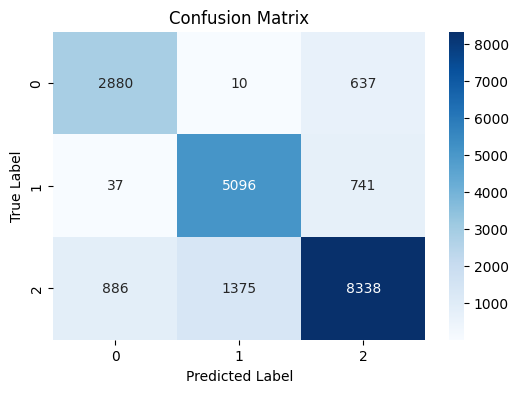

In [ ]:
# Creamos la matriz de confusión

cm = confusion_matrix(y_test, y_pred_resampled_rfc)

# Graficamos el heatmap

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Podríamos tomar RandomOverSampler como el mejor resultado, aunque no son considerables las diferencias, hemos logrado incrementar los true positives para good y bad, pero la confucion con standard se mantiene.

Seguiremos a continuación intentando mejorar nuestro modelo probando nuevas herramientas para optimizar los hyperparametros y así ver si podemos obtener mejores resultados. Probaremos alternativas a GridSearchCV sobre dicho modelo, para intentar mejorarlo, probando diferentes hiperparametros. Comenzaremos con RandomizedSearchCV y luego HalvingGridSearchCV.

### RandomizedSearchCV

Las búsquedas aleatorias son muy similares a las búsquedas en cuadrícula. Sin embargo, en lugar de probar cada combinación de hiperparámetros, las búsquedas aleatorias solo prueban una cierta cantidad de combinaciones que se seleccionan al azar.

RandomizedSearchCV pasa aleatoriamente el conjunto de hiperparámetros y calcula la puntuación y proporciona el mejor conjunto de hiperparámetros que proporciona la mejor puntuación como resultado.

In [ ]:
# Obtenemos los parámetros utilizados inicialmente

rfc.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
# Creamos el clasificador y definimos los parametros a probar

rfc_rs = RandomForestClassifier()

hiperparametros_rs = {
  "max_depth" : [None, 10, 15],
  "max_leaf_nodes" : [None, 10, 15],
  "min_samples_leaf" : [1, 2, 3],
  "min_samples_split" : [2, 4, 6],
  "n_estimators" : [100, 150, 200]
}

# Aplicamos la grilla al modelo

rand_search = RandomizedSearchCV(rfc_rs,
                                 hiperparametros_rs,
                                 cv=5,
                                 n_iter=100,
                                 scoring='f1',
                                 n_jobs=-1,
                                 verbose=2)

#Entrenamos el modelo con la grilla

rfc_rand_search = rand_search.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


In [ ]:
# Imprimimos los resultados

print("Resultados de RandomizedSearchCV\n", 79 * "_", "\n")
print("Parametros: ", str(rfc_rand_search.best_params_))
print("Puntaje: ", str(rfc_rand_search.best_score_), "\n")

Resultados de RandomizedSearchCV
 _______________________________________________________________________________ 

Parametros:  {'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 3, 'max_leaf_nodes': None, 'max_depth': None}
Puntaje:  nan 



In [ ]:
# Guardamos los resultados dentro de un dataframe

df_results_rs = pd.DataFrame(rfc_rand_search.cv_results_)

df_results_rs.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_leaf_nodes,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,53.443097,1.173505,1.101388,0.236697,150,2,3,None,None,"{'n_estimators': 150, 'min_samples_split': 2, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,22.757175,1.230257,0.370949,0.079484,200,6,2,15,None,"{'n_estimators': 200, 'min_samples_split': 6, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,56.814018,0.697604,0.825876,0.005663,200,6,1,None,15,"{'n_estimators': 200, 'min_samples_split': 6, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,10.339025,0.642972,0.166098,0.006359,100,6,3,10,None,"{'n_estimators': 100, 'min_samples_split': 6, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,28.232026,1.188445,0.608100,0.150710,100,6,1,None,15,"{'n_estimators': 100, 'min_samples_split': 6, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
5,9.991929,0.639355,0.164953,0.008668,100,4,3,10,None,"{'n_estimators': 100, 'min_samples_split': 4, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
6,23.276985,1.415075,0.425690,0.120573,200,4,1,15,15,"{'n_estimators': 200, 'min_samples_split': 4, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
7,15.189147,0.251692,0.396409,0.033232,150,4,1,10,10,"{'n_estimators': 150, 'min_samples_split': 4, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8,17.343262,1.024620,0.265699,0.004333,150,6,1,15,None,"{'n_estimators': 150, 'min_samples_split': 6, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
9,72.008375,1.472874,1.948750,0.561377,200,4,2,None,None,"{'n_estimators': 200, 'min_samples_split': 4, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
# Realizamos predicciones y calculamos la precisión del modelo

prediction_rs = rfc_rand_search.predict(x_test)
accuracy_rs = accuracy_score(y_test, prediction_rs)

# Calculamos la Matriz de Confusion

matrix_rs = confusion_matrix(y_test, prediction_rs)

# Imprimimos los resultados

print("Resultados del modelo\n", 79 * "_", "\n")
print("Exactitud: ", {accuracy_rs})
print("\nMatriz de confusión: \n")
print(matrix_rs)
print(79 * "_")

Resultados del modelo
 _______________________________________________________________________________ 

Exactitud:  {0.80905}

Matriz de confusión: 

[[2682   19  826]
 [  48 4875  951]
 [ 751 1224 8624]]
_______________________________________________________________________________


Luego de probar una grilla de hyperparametros utilizando RandomizedSearchCV, logramos un buen resultado. Inicialmente habíamos utilizado los parámetros en default, y partiendo de ellos agregamos nuevos valores. Encontramos que luego de analizar el mejor resultado, los valores se conservaron a excepción de la cantidad de arboles (n_estimators) y del número mínimo de muestras necesarias para estar en un nodo de hoja (min_samples_leaf). A continuacion utilizaremos HalvingGridSearchCV para seguir probando diferentes valores a partir de estos resultados. Además utilizaremos diferentes métodos de validación cruzada como StratifiedKFold y K-Fold, para comparar resultados.

### HalvingGridSearchCV

Esta herramienta busca sobre los valores de los parámetros especificados con una reducción sucesiva a la mitad.

La estrategia de búsqueda comienza a evaluar todos los candidatos con una pequeña cantidad de recursos y selecciona iterativamente los mejores candidatos, utilizando cada vez más recursos.

In [ ]:
# Creamos el clasificador y definimos los parametros a probar

rfc_best_params = RandomForestClassifier()

hiperparametros_hgs = {
  "max_depth" : [None, 10, 15],
  "max_leaf_nodes" : [None, 10, 15],
  "min_samples_leaf" : [3, 4, 5],
  "min_samples_split" : [2, 4, 6],
  "n_estimators" : [100, 150, 200]
}

# Aplicamos la grilla al modelo

hgs_grid = HalvingGridSearchCV(rfc_best_params,
                               param_grid=hiperparametros_hgs,
                               factor=4,
                               cv=5,
                               scoring='accuracy',
                               n_jobs=-1,
                               verbose=2)

In [ ]:
%%time

# Entrenamos el modelo con la grilla

hgs_grid.fit(x_train, y_train)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 1250
max_resources_: 80000
aggressive_elimination: False
factor: 4
----------
iter: 0
n_candidates: 243
n_resources: 1250
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
----------
iter: 1
n_candidates: 61
n_resources: 5000
Fitting 5 folds for each of 61 candidates, totalling 305 fits
----------
iter: 2
n_candidates: 16
n_resources: 20000
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 3
n_candidates: 4
n_resources: 80000
Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: user 1min 42s, sys: 7.46 s, total: 1min 49s
Wall time: 35min 42s


HalvingGridSearchCV(estimator=RandomForestClassifier(), factor=4, n_jobs=-1,
                    param_grid={'max_depth': [None, 10, 15],
                                'max_leaf_nodes': [None, 10, 15],
                                'min_samples_leaf': [3, 4, 5],
                                'min_samples_split': [2, 4, 6],
                                'n_estimators': [100, 150, 200]},
                    scoring='accuracy', verbose=2)

In [ ]:
# Imprimimos los resultados

print("Resultados de HalvingGridSearchCV\n", 79 * "_", "\n")
print("Mejores parametros", hgs_grid.best_params_)
print("Mejor CV score", hgs_grid.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_test, hgs_grid.predict(x_test)), 5)}')
print(79 * "_")

Resultados de HalvingGridSearchCV
 _______________________________________________________________________________ 

Mejores parametros {'max_depth': None, 'max_leaf_nodes': None, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 200}
Mejor CV score 0.797925
Accuracy del modelo = 0.8081
_______________________________________________________________________________


In [ ]:
# Realizamos predicciones en los conjuntos de prueba

best_estimator_hgs = hgs_grid.best_estimator_
y_pred_test_hgs = best_estimator_hgs.predict(x_test)

# Evaluamos el rendimiento de los modelos con RandomOverSampler

print("Resultados de RandomForestClassifier con HalvingGridSearchCV\n", 79 * "_")
print(classification_report(y_test, y_pred_test_hgs))
print(79 * "_")

Resultados de RandomForestClassifier con HalvingGridSearchCV
 _______________________________________________________________________________
              precision    recall  f1-score   support

           0       0.77      0.76      0.77      3527
           1       0.79      0.83      0.81      5874
           2       0.83      0.81      0.82     10599

    accuracy                           0.81     20000
   macro avg       0.80      0.80      0.80     20000
weighted avg       0.81      0.81      0.81     20000

_______________________________________________________________________________


Hemos obtenido resultados similares a los anteriores, pero los tiempos de ejecución mejoraron considerablemente en comparación a las demás herramientas (reduciendo los tiempos hasta la mitad, algo considerable teniendo en cuenta que la celda tardo casi 40 minutos), lo que nos permite ir probando una mayor cantidad de hiperparametros. Además, un estudio mas profundo de los parametros de HalvingGridSearchCV, como 'factor' o 'resource', asi como el método de validación cruzada, podría darnos mejores resultados y mejorar el rendimiento de nuestro modelo.

A continuación probaremos la grilla a partir de los anteriores resultados, además probaremos un método diferente de validación cruzada.

### K-Fold

Es un metodo que intenta crear pliegues equilibrados de modo que el número de grupos distintos sea aproximadamente el mismo en cada pliegue. La validación cruzada K-fold es una de las técnicas más populares que se utilizan comúnmente para detectar el sobreajuste.

La desventaja de este método es que el algoritmo de entrenamiento debe volver a ejecutarse desde cero k veces, lo que significa que se necesitan k veces más cálculos para realizar una evaluación.

In [ ]:
# Creamos el objeto KFold con 5 divisiones (k=5)

kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Aplicamos nuevamente la grilla al modelo

hgs_grid_kf = HalvingGridSearchCV(rfc_best_params,
                                  param_grid=hiperparametros_hgs,
                                  factor=4,
                                  cv=kfold,
                                  scoring='accuracy',
                                  n_jobs=-1,
                                  verbose=2)

In [ ]:
%%time

# Entrenamos el modelo con la grilla y kfold

hgs_grid_kf.fit(x_train, y_train)

n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 1250
max_resources_: 80000
aggressive_elimination: False
factor: 4
----------
iter: 0
n_candidates: 243
n_resources: 1250
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
----------
iter: 1
n_candidates: 61
n_resources: 5000
Fitting 5 folds for each of 61 candidates, totalling 305 fits
----------
iter: 2
n_candidates: 16
n_resources: 20000
Fitting 5 folds for each of 16 candidates, totalling 80 fits
----------
iter: 3
n_candidates: 4
n_resources: 80000
Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: user 1min 41s, sys: 7.87 s, total: 1min 49s
Wall time: 36min 55s


HalvingGridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                    estimator=RandomForestClassifier(), factor=4, n_jobs=-1,
                    param_grid={'max_depth': [None, 10, 15],
                                'max_leaf_nodes': [None, 10, 15],
                                'min_samples_leaf': [3, 4, 5],
                                'min_samples_split': [2, 4, 6],
                                'n_estimators': [100, 150, 200]},
                    scoring='accuracy', verbose=2)

In [ ]:
# Imprimimos los resultados con kflod

print("Resultados de HalvingGridSearchCV cv=kfold\n", 79 * "_", "\n")
print("Mejores parametros", hgs_grid_kf.best_params_)
print("Mejor CV score", hgs_grid_kf.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_test, hgs_grid_kf.predict(x_test)), 5)}')
print(79 * "_")

Resultados de HalvingGridSearchCV cv=kfold
 _______________________________________________________________________________ 

Mejores parametros {'max_depth': None, 'max_leaf_nodes': None, 'min_samples_leaf': 3, 'min_samples_split': 4, 'n_estimators': 200}
Mejor CV score 0.7982250000000001
Accuracy del modelo = 0.8087
_______________________________________________________________________________


In [ ]:
# Realizamos predicciones en todo el conjunto de datos utilizando el mejor estimador

best_estimator = hgs_grid_kf.best_estimator_
y_pred_kf = best_estimator.predict(x_train)

# Calcular la precisión del modelo

accuracy_kf = accuracy_score(y_train, y_pred_kf)

print(f'Accuracy Score for best estimator con KFold: {accuracy_kf}')

Accuracy Score for best estimator con KFold: 0.92475


In [ ]:
# Obtenemos los scores de todas las combinaciones de parámetros

results_kf = hgs_grid_kf.cv_results_

# Guardamos todo dentro de un dataframe

df_kf = pd.DataFrame(results_kf)

# Armamos un dataframe con lo más importante

df_kf_best = df_kf[['rank_test_score',
                    'mean_train_score',
                    'mean_test_score',
                    'params']]

df_kf_best.sort_values("rank_test_score", ascending=True)

,rank_test_score,mean_train_score,mean_test_score,params
323,1,0.927675,0.798225,"{'max_depth': None, 'max_leaf_nodes': None, 'm..."
322,2,0.927994,0.798113,"{'max_depth': None, 'max_leaf_nodes': None, 'm..."
320,3,0.927337,0.796850,"{'max_depth': None, 'max_leaf_nodes': None, 'm..."
321,4,0.903691,0.794975,"{'max_depth': None, 'max_leaf_nodes': None, 'm..."
315,5,0.936087,0.739900,"{'max_depth': None, 'max_leaf_nodes': None, 'm..."
...,...,...,...,...
46,317,0.707200,0.624000,"{'max_depth': None, 'max_leaf_nodes': 10, 'min..."
111,321,0.711800,0.623200,"{'max_depth': 10, 'max_leaf_nodes': 10, 'min_s..."
207,321,0.708200,0.623200,"{'max_depth': 15, 'max_leaf_nodes': 10, 'min_s..."
129,321,0.709600,0.623200,"{'max_depth': 10, 'max_leaf_nodes': 10, 'min_s..."


Encontramos ciertas mejoras en el modelo utilizando todas las herramientas. Ahora evaluaremos el modelo con el mejor estimador y las clases balanceadas para ver en su totalidad los resultados.

In [ ]:
# Entrenamos el mejor modelo

rfc_best = hgs_grid_kf.best_estimator_
rfc_best.fit(x_train_resampled, y_train_resampled)

RandomForestClassifier(min_samples_leaf=3, min_samples_split=4,
                       n_estimators=200)

In [ ]:
# Calculamos la puntuación de precisión

best_train_ascore = rfc_best.score(x_train_resampled, y_train_resampled)
best_test_ascore = rfc_best.score(x_test, y_test)

# Obtenemos predicción del modelo

best_y_train_pred = rfc_best.predict(x_train_resampled)
best_y_test_pred = rfc_best.predict(x_test)

# Calculamos el f1 score

best_train_fscore = f1_score(y_train_resampled, best_y_train_pred, average='macro')
best_test_fscore = f1_score(y_test, best_y_test_pred, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {best_train_ascore}")
print(f"Test - puntuación de precisión: {best_test_ascore}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {best_train_fscore}")
print(f"Test - F1-Score: {best_test_fscore}")

Train - puntuación de precisión: 0.952750048933255
Test - puntuación de precisión: 0.8097

Train - F1-Score: 0.9520619498633599
Test - F1-Score: 0.8049523089854698


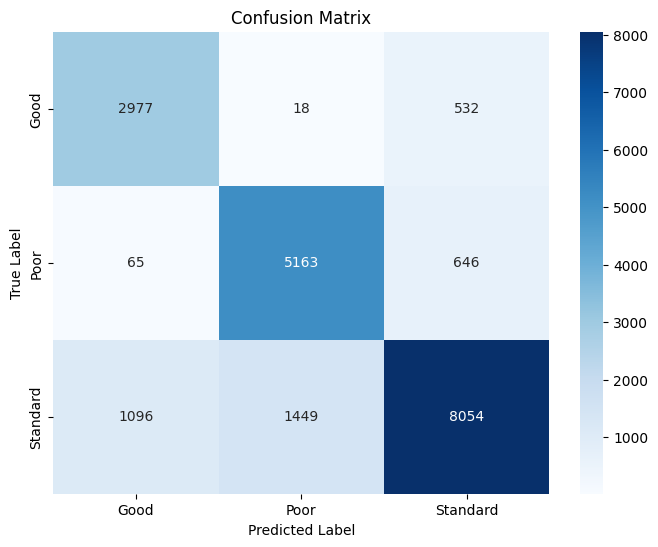



              precision    recall  f1-score   support

        Good       0.72      0.84      0.78      3527
        Poor       0.78      0.88      0.83      5874
    Standard       0.87      0.76      0.81     10599

    accuracy                           0.81     20000
   macro avg       0.79      0.83      0.80     20000
weighted avg       0.82      0.81      0.81     20000



In [ ]:
# Creamos la matriz de confusión

best_y_pred = rfc_best.predict(x_test)
best_cm_values = confusion_matrix(y_test, best_y_pred)
best_df_cm = pd.DataFrame(
    best_cm_values,
    columns=["Good", "Poor", "Standard"],
    index=["Good", "Poor", "Standard"]
    )
best_df_cm.index.name = "Actual"
best_df_cm.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(best_df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test, best_y_pred, target_names=["Good", "Poor", "Standard"]))

Luego de probar balancear las clases y optimizar los hyperparametros, hemos logrado mantener la exactitud del modelo con un 81%. En cuanto a la capacidad del modelo para manejar las clases, encontramos que la capacidad de detectar las clases Good y Poor mejoro para los verdaderos positivos, principalmente en la confusión con respecto a la clase Standard. Con respecto a esta ultima persiste la confusión, el modelo no detecta la clase muy bien, pero cuando lo hace es altamente confiable. Por otro lado, logramos evitar el claro sobreajuste que teníamos para el entrenamiento.

A continuación intentaremos mejorar el rendimiento y los resultados de nuestro segundo modelo elegido, para luego comparar los resultados finales de ambos y evaluarlos.

>- ## Segundo modelo seleccionado: XGBClassifier

Continuamos con el segundo modelo que seleccionamos a partir de los resultados, con un 79% de accuracy. Ahora buscaremos mejorar ese resultado utilizando las mismas herramientas que aplicamos para el primero.

### Feature importance

Una ventaja de utilizar un modelo potenciado por gradiente es que una vez construidos los árboles potenciados, es relativamente sencillo recuperar la puntuación de importancia de cada característica. La importancia de la característica se calcula para un único árbol de decisión por la cantidad en que el punto de división de cada atributo mejora la medida de rendimiento, ponderada por la cantidad de observaciones de las que es responsable el nodo.

Aprovecharemos la documentación que se comparte en el link para probar un enfoque y código diferente.

Link: [Calculating XGBoost Feature Importance](https://medium.com/@emilykmarsh/xgboost-feature-importance-233ee27c33a4)

Link: [An introduction to SHAP](https://shap.readthedocs.io/en/latest/example_notebooks/overviews/An%20introduction%20to%20explainable%20AI%20with%20Shapley%20values.html)

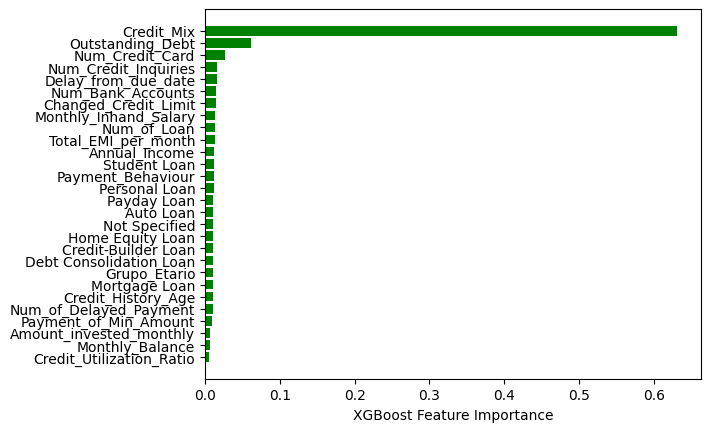

In [ ]:
# Plot feature importance

sorted_idx = modelo_xgbc.feature_importances_.argsort()

plt.barh(df_credit_end.columns[sorted_idx],
         modelo_xgbc.feature_importances_[sorted_idx],
         color='g',
         align='center')

plt.xlabel("XGBoost Feature Importance")
plt.show()

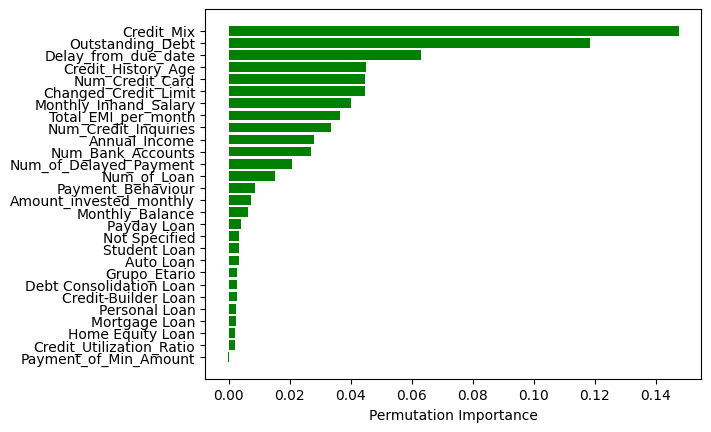

In [ ]:
# Permutation Based Feature Importance

perm_importance = permutation_importance(modelo_xgbc, x_test, y_test)
sorted_idx = perm_importance.importances_mean.argsort()

plt.barh(df_credit_end.columns[sorted_idx],
         perm_importance.importances_mean[sorted_idx],
         color='g',
         align='center')

plt.xlabel("Permutation Importance")
plt.show()

Podemos observar que los resultados varían con respecto a los analizados en el primer modelo. Esto cambia cuando analizamos la importancia de las características basada en permutación, ahí vemos un similar resultado al anterior. Probaremos a continuación un nuevo método obtenido de la nueva documentación o estudio, que el SHAP Values Method.

Los valores SHAP se determinan utilizando los valores de Shapley de la teoría de juegos para estimar cómo cada característica contribuye a la predicción. El valor SHAP en sí es la contribución individual de cada característica en la salida del modelo para cada ejemplo u observación. En comparación con el uso de coeficientes como métrica de la importancia general de cada característica, los valores SHAP evitan distorsiones y malas interpretaciones que surgen cuando las características se escalan con la escala de la variable misma. Los valores SHAP también pueden explicar la importancia local de la característica.

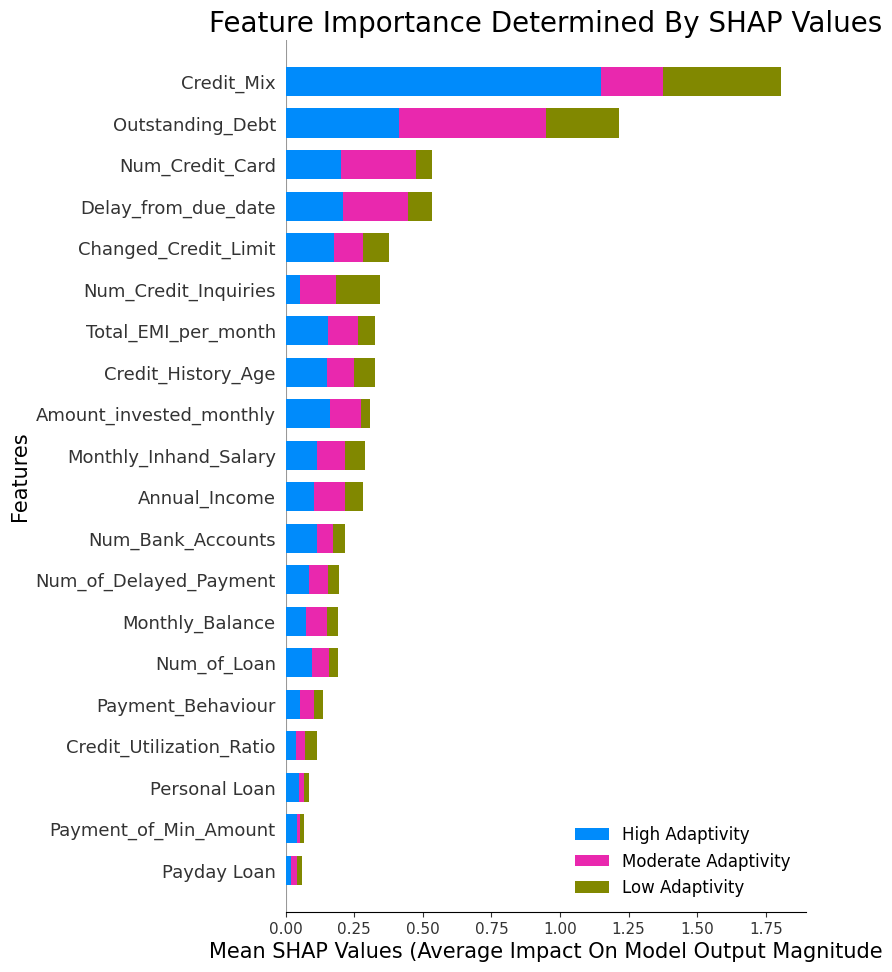

In [ ]:
# Feature Importance Computed with SHARP Values

explainer = shap.TreeExplainer(modelo_xgbc)
shap_values = explainer.shap_values(x_test)

fig_shap = shap.summary_plot(
    shap_values,
    x_test,
    show=False,
    class_names=['High Adaptivity', 'Moderate Adaptivity', 'Low Adaptivity']
    )

plt.title('Feature Importance Determined By SHAP Values', fontsize=20)
plt.xlabel('Mean SHAP Values (Average Impact On Model Output Magnitude', fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.show()

Utilizando el método SHAP podemos observar con facilidad en el grafico que características son mas importantes para cada nivel de adaptabilidad. Vemos que persiste el resultado de importancia del crédito variado y las deudas pendientes, así como toda variable relacionada, como es lógico a las deudas.

Ahora pasaremos a optimizar los hyperparametros de nuestro segundo modelo seleccionado para ver si podemos mejorar los resultados obtenidos. Comenzaremos utilizando RandomizedSearchCV.

### RandomizedSearchCV

Utilizaremos los resultados iniciales para mejorar la grilla y probar un numero mayor de hyperparametros.

In [ ]:
# Obtenemos los parámetros utilizados inicialmente

modelo_xgbc.get_params()

{'objective': 'multi:softprob',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': 0,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': 8,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'alpha': 1}

In [ ]:
# Creamos el clasificador y definimos los parametros a probar

xgbc_rs = xgb.XGBClassifier()

hiperparametros_rs_xgbc = {
    'n_estimators': [100, 150, 200],
    'max_depth' : [None, 8, 10],
    'gamma' : [0, 1, 2],
    'alpha' : [0, 1, 2],
    'subsample' : [0, 0.5, 1],
    'scale_pos_weight' : [0, 1, 2]
}

# Aplicamos la grilla al modelo

rand_search1 = RandomizedSearchCV(
    xgbc_rs,
    hiperparametros_rs_xgbc,
    cv=5,
    n_iter=100,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
    )

#Entrenamos el modelo con la grilla

xgbc_rand_search = rand_search1.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


In [ ]:
# Imprimimos los resultados

print("Resultados de RandomizedSearchCV XGBC\n", 79 * "_", "\n")
print("Parametros: ", str(xgbc_rand_search.best_params_))
print("Puntaje: ", str(xgbc_rand_search.best_score_), "\n")

Resultados de RandomizedSearchCV XGBC
 _______________________________________________________________________________ 

Parametros:  {'subsample': 1, 'scale_pos_weight': 0, 'n_estimators': 150, 'max_depth': 10, 'gamma': 0, 'alpha': 2}
Puntaje:  0.7920125 



In [ ]:
# Guardamos los resultados dentro de un dataframe

df_results_rs_xgbc = pd.DataFrame(xgbc_rand_search.cv_results_)

df_kf_best_xgbc = df_results_rs_xgbc[['rank_test_score',
                                      'mean_test_score',
                                      'params']]

df_kf_best_xgbc.sort_values("rank_test_score", ascending=True)

,rank_test_score,mean_test_score,params
6,1,0.792013,"{'subsample': 1, 'scale_pos_weight': 0, 'n_est..."
45,2,0.791838,"{'subsample': 1, 'scale_pos_weight': 2, 'n_est..."
54,3,0.791163,"{'subsample': 1, 'scale_pos_weight': 1, 'n_est..."
34,4,0.789913,"{'subsample': 1, 'scale_pos_weight': 1, 'n_est..."
18,5,0.789863,"{'subsample': 1, 'scale_pos_weight': 0, 'n_est..."
...,...,...,...
70,67,0.178762,"{'subsample': 0, 'scale_pos_weight': 1, 'n_est..."
20,67,0.178762,"{'subsample': 0, 'scale_pos_weight': 2, 'n_est..."
72,67,0.178762,"{'subsample': 0, 'scale_pos_weight': 1, 'n_est..."
76,67,0.178762,"{'subsample': 0, 'scale_pos_weight': 2, 'n_est..."


In [ ]:
# Realizamos predicciones y calculamos la precisión del modelo

prediction_rs_xgbc = xgbc_rand_search.predict(x_test)
accuracy_rs_xgbc = accuracy_score(y_test, prediction_rs_xgbc)

# Calculamos la Matriz de Confusion

matrix_rs_xgbc = confusion_matrix(y_test, prediction_rs_xgbc)

# Imprimimos los resultados

print("Resultados del modelo\n", 79 * "_", "\n")
print("Exactitud: ", {accuracy_rs_xgbc})
print("\nMatriz de confusión: \n")
print(matrix_rs_xgbc)
print(79 * "_")

Resultados del modelo
 _______________________________________________________________________________ 

Exactitud:  {0.80145}

Matriz de confusión: 

[[2656    8  863]
 [  27 4749 1098]
 [ 765 1210 8624]]
_______________________________________________________________________________


Luego de probar una mayor cantidad de hyperparametros con RandomizedSearchCV, logramos resultados similares, pero el modelo manejo mejor las clases, especialmente para Good y Poor. Siendo estas las clases de las cuales esperamos lograr los mejores resultados, seguiremos intentando mejorarlos. A continuación probaremos un diferentes métodos de validación cruzada con HalvingGridSearchCV.

### HalvingGridSearchCV

Utilizaremos esta herramienta para seguir evaluando resultados, ya que los tiempos computacionales son menores, y métodos como StratifiedKFold pueden resultar costosos desde el punto de vista computacional, especialmente para conjuntos de datos grandes. Ejecutalo requiere ajustar el modelo varias veces, lo que puede llevar mucho tiempo.

StratifiedKFold: El objeto de validación cruzada de pliegues K estratificados es una variación de KFold que devuelve pliegues estratificados. Los pliegues se realizan conservando el porcentaje de muestras de cada clase.

In [ ]:
# Crear el objeto StratifiedKFold con 5 divisiones (k=5)

s_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Aplicamos la grilla al modelo

hgs_grid_xgbc = HalvingGridSearchCV(
    xgbc_rs,
    hiperparametros_rs_xgbc,
    factor=4,
    cv=s_kfold,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
    )

In [ ]:
%%time

# Entrenamos el modelo con la grilla

hgs_grid_xgbc.fit(x_train, y_train)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 312
max_resources_: 80000
aggressive_elimination: False
factor: 4
----------
iter: 0
n_candidates: 729
n_resources: 312
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
----------
iter: 1
n_candidates: 183
n_resources: 1248
Fitting 5 folds for each of 183 candidates, totalling 915 fits
----------
iter: 2
n_candidates: 46
n_resources: 4992
Fitting 5 folds for each of 46 candidates, totalling 230 fits
----------
iter: 3
n_candidates: 12
n_resources: 19968
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 4
n_candidates: 3
n_resources: 79872
Fitting 5 folds for each of 3 candidates, totalling 15 fits
CPU times: user 1min 2s, sys: 9.55 s, total: 1min 12s
Wall time: 17min 9s


HalvingGridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                    estimator=XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importa...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...),
                    factor=4, n_jobs=-1,
                    param_grid={'alpha': [0, 1, 2], 'gamma': [0, 1, 2],
                                'max_depth': [None, 8, 10],
                                'n_estimators': [100, 150, 200],
                                'scale_pos_weight': [0, 1, 2],
                                'subsample': [0, 0.5, 1]},
                    scoring='accuracy', verbose=2)

In [ ]:
# Imprimimos los resultados

print("Resultados de HalvingGridSearchCV XGBC con StratifiedKFold\n", 79 * "_", "\n")
print("Mejores parametros", hgs_grid_xgbc.best_params_)
print("Mejor CV score", hgs_grid_xgbc.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_test, hgs_grid_xgbc.predict(x_test)), 5)}')
print(79 * "_")

Resultados de HalvingGridSearchCV XGBC con StratifiedKFold
 _______________________________________________________________________________ 

Mejores parametros {'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_estimators': 150, 'scale_pos_weight': 1, 'subsample': 1}
Mejor CV score 0.7503568298485039
Accuracy del modelo = 0.75965
_______________________________________________________________________________


In [ ]:
# Obtenemos los scores de todas las combinaciones de parámetros

results_skf = hgs_grid_xgbc.cv_results_

# Guardamos todo dentro de un dataframe

df_skf = pd.DataFrame(results_skf)

# Armamos un dataframe con lo más importante

df_skf_best = df_skf[['rank_test_score',
                     'mean_train_score',
                     'mean_test_score',
                     'params']]

df_skf_best.sort_values("rank_test_score", ascending=True)

,rank_test_score,mean_train_score,mean_test_score,params
972,1,0.793427,0.750357,"{'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_e..."
971,1,0.793427,0.750357,"{'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_e..."
970,1,0.793427,0.750357,"{'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_e..."
959,4,0.772768,0.710744,"{'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_e..."
960,4,0.772768,0.710744,"{'alpha': 2, 'gamma': 2, 'max_depth': 10, 'n_e..."
...,...,...,...,...
462,731,0.162249,0.167742,"{'alpha': 1, 'gamma': 2, 'max_depth': 10, 'n_e..."
459,731,0.162249,0.167742,"{'alpha': 1, 'gamma': 2, 'max_depth': 10, 'n_e..."
456,731,0.162249,0.167742,"{'alpha': 1, 'gamma': 2, 'max_depth': 8, 'n_es..."
543,731,0.162249,0.167742,"{'alpha': 2, 'gamma': 0, 'max_depth': 10, 'n_e..."


No hemos logrado mejorar el rendimiento del modelo a partir de los resultados anteriores con RandomizedSearchCV y validación simple, habiendo además utilizado los mismos parámetros de prueba. A continuación probaremos K-Fold para comparar los resultados que obtuvimos con StratifiedKFold.

In [ ]:
# Aplicamos la grilla al modelo

hgs_grid_xgbc1 = HalvingGridSearchCV(
    xgbc_rs,
    hiperparametros_rs_xgbc,
    factor=4,
    cv=kfold,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
    )

In [ ]:
%%time

# Entrenamos el modelo con la grilla

hgs_grid_xgbc1.fit(x_train, y_train)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 312
max_resources_: 80000
aggressive_elimination: False
factor: 4
----------
iter: 0
n_candidates: 729
n_resources: 312
Fitting 5 folds for each of 729 candidates, totalling 3645 fits
----------
iter: 1
n_candidates: 183
n_resources: 1248
Fitting 5 folds for each of 183 candidates, totalling 915 fits
----------
iter: 2
n_candidates: 46
n_resources: 4992
Fitting 5 folds for each of 46 candidates, totalling 230 fits
----------
iter: 3
n_candidates: 12
n_resources: 19968
Fitting 5 folds for each of 12 candidates, totalling 60 fits
----------
iter: 4
n_candidates: 3
n_resources: 79872
Fitting 5 folds for each of 3 candidates, totalling 15 fits
CPU times: user 1min 3s, sys: 9.85 s, total: 1min 13s
Wall time: 18min 8s


HalvingGridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
                    estimator=XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=N...
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=None, ...),
                    factor=4, n_jobs=-1,
                    param_grid={'alpha': [0, 1, 2], 'gamma': [0, 1, 2],
                                'max_depth': [None, 8, 10],
                                'n_estimators': [100, 150, 200],
                                'scale_pos_weight': [0, 1, 2],
                                'subsample': [0, 0.5, 1]},
                    scoring='accuracy', verbose=2)

In [ ]:
# Imprimimos los resultados

print("Resultados de HalvingGridSearchCV XGBC con KFold\n", 79 * "_", "\n")
print("Mejores parametros", hgs_grid_xgbc1.best_params_)
print("Mejor CV score", hgs_grid_xgbc1.best_score_)
print(f'Accuracy del modelo = {round(accuracy_score(y_test, hgs_grid_xgbc1.predict(x_test)), 5)}')
print(79 * "_")

Resultados de HalvingGridSearchCV XGBC con KFold
 _______________________________________________________________________________ 

Mejores parametros {'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_estimators': 150, 'scale_pos_weight': 1, 'subsample': 1}
Mejor CV score 0.7612495304870415
Accuracy del modelo = 0.7669
_______________________________________________________________________________


In [ ]:
# Obtenemos los scores de todas las combinaciones de parámetros

results_kf1 = hgs_grid_xgbc1.cv_results_

# Guardamos todo dentro de un dataframe

df_kf1 = pd.DataFrame(results_kf1)

# Armamos un dataframe con lo más importante

df_kf_best1 = df_kf1[['rank_test_score',
                      'mean_train_score',
                      'mean_test_score',
                      'params']]

df_kf_best1.sort_values("rank_test_score", ascending=True)

,rank_test_score,mean_train_score,mean_test_score,params
972,1,0.828468,0.761250,"{'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_e..."
971,1,0.828468,0.761250,"{'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_e..."
970,1,0.828468,0.761250,"{'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_e..."
958,4,0.837123,0.721963,"{'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_e..."
959,4,0.837123,0.721963,"{'alpha': 2, 'gamma': 1, 'max_depth': 10, 'n_e..."
...,...,...,...,...
462,731,0.181526,0.138710,"{'alpha': 1, 'gamma': 2, 'max_depth': 10, 'n_e..."
459,731,0.181526,0.138710,"{'alpha': 1, 'gamma': 2, 'max_depth': 10, 'n_e..."
456,731,0.181526,0.138710,"{'alpha': 1, 'gamma': 2, 'max_depth': 8, 'n_es..."
543,731,0.181526,0.138710,"{'alpha': 2, 'gamma': 0, 'max_depth': 10, 'n_e..."


In [ ]:
# Realizamos predicciones y calculamos la precisión del modelo

prediction_hgs_xgbc = hgs_grid_xgbc1.predict(x_test)
accuracy_hgs_xgbc = accuracy_score(y_test, prediction_hgs_xgbc)

# Calculamos la Matriz de Confusion

matrix_hgs_xgbc = confusion_matrix(y_test, prediction_hgs_xgbc)

# Imprimimos los resultados

print("Resultados del modelo\n", 79 * "_", "\n")
print("Exactitud: ", {accuracy_hgs_xgbc})
print("\nMatriz de confusión: \n")
print(matrix_hgs_xgbc)
print(79 * "_")

Resultados del modelo
 _______________________________________________________________________________ 

Exactitud:  {0.7669}

Matriz de confusión: 

[[2597   37  893]
 [ 209 4397 1268]
 [ 974 1281 8344]]
_______________________________________________________________________________


Logramos mejorar un poco la exactitud con kfold, pero los resultados son similares. El modelo no maneja tan bien las clases como los resultados obtenidos con RandomizedSearchCV y validación simple logrados anteriormente. probaremos a continuación analizar los datos del mejor modelo y evaluarlo en su totalidad.

In [ ]:
# Entrenamos el mejor modelo

xgbc_best = xgbc_rand_search.best_estimator_
xgbc_best.fit(x_train, y_train)

XGBClassifier(alpha=2, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=150, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
# Calculamos la puntuación de precisión

best_train_ascore1 = xgbc_best.score(x_train, y_train)
best_test_ascore1 = xgbc_best.score(x_test, y_test)

# Obtenemos predicción del modelo

best_y_train_pred1 = xgbc_best.predict(x_train)
best_y_test_pred1 = xgbc_best.predict(x_test)

# Calculamos el f1 score

best_train_fscore1 = f1_score(y_train, best_y_train_pred1, average='macro')
best_test_fscore1 = f1_score(y_test, best_y_test_pred1, average='macro')

# Resultado de train y test de puntuación de precisión

print(f"Train - puntuación de precisión: {best_train_ascore1}")
print(f"Test - puntuación de precisión: {best_test_ascore1}\n")

# Print train and test macro f1 score

print(f"Train - F1-Score: {best_train_fscore1}")
print(f"Test - F1-Score: {best_test_fscore1}")

Train - puntuación de precisión: 0.9952375
Test - puntuación de precisión: 0.80145

Train - F1-Score: 0.9952236759756198
Test - F1-Score: 0.7926348851113882


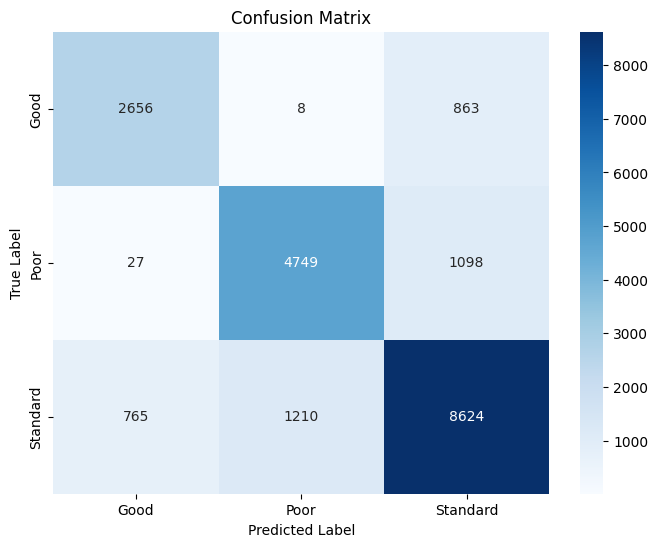



              precision    recall  f1-score   support

        Good       0.77      0.75      0.76      3527
        Poor       0.80      0.81      0.80      5874
    Standard       0.81      0.81      0.81     10599

    accuracy                           0.80     20000
   macro avg       0.79      0.79      0.79     20000
weighted avg       0.80      0.80      0.80     20000



In [ ]:
# Creamos la matriz de confusión

best_y_pred1 = xgbc_best.predict(x_test)
best_cm_values1 = confusion_matrix(y_test, best_y_pred1)
best_df_cm1 = pd.DataFrame(
    best_cm_values1,
    columns=["Good", "Poor", "Standard"],
    index=["Good", "Poor", "Standard"]
    )
best_df_cm1.index.name = "Actual"
best_df_cm1.columns.name = "Predicted"

# Graficamos la matriz de confusión

plt.figure(figsize=(8, 6))
sns.heatmap(best_df_cm1, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Resultados del reporte

print('\n')
print(classification_report(y_test, best_y_pred1, target_names=["Good", "Poor", "Standard"]))

Hemos conseguido mejorar la exactitud del modelo luego de probar y optimizar los hyperparametros, con una exactitud del 80%. Ha mejorado el manejo de las clases en algunos aspectos como la clasificación de Good y Poor, llevando al mínimo de todos los modelos que hemos probado los falsos positivos que mayor relevancia tienen. En cuanto a la confusión con Standard persiste al igual que los anteriores modelos, con un leve incremento para la confusión con la clase Good. También observamos un posible sobreajuste para el entrenamiento. El modelo podría mejorarse aún más.

Lamentablemente no podremos evaluar la curva ROC y AUC con nuestros des mejores modelos seleccionados, ya que al hacerlo se satura la memoria de la sesión y perdemos la ejecución de todas las celdas. A partir de este punto culminamos con el modelado, y con los resultados obtenidos pasamos a realizar las conclusiones y recomendaciones correspondientes.

---
<center>
 <h1><font color= "green" size="+5">Conclusiones, Insights y Recomendaciones</font></h1>
</center>

## Conclusión e Insights:

Comenzamos nuestro trabajo a partir del análisis del negocio y nuestro objetivo, el cual consistía en desarrollar un modelo que pudiera clasificar a los clientes según su puntaje de crédito, tomando toda la información crediticia. A partir de ahí iniciamos nuestro análisis de los datos para ver con que información contábamos, así como la cantidad de muestras y variables con las que podíamos trabajar.

Atreves de un análisis exploratorio de datos (EDA), fuimos analizando individualmente cada variable y sus datos para identificar relaciones, calidad de los datos y ir entendiendo que limpieza e ingeniería requerirían los datos para poder trabajar con ellos.
Pudimos detectar valores erróneos, formatos incorrectos, valores faltantes y posibles outliers a manejar.
También pudimos observar que contábamos con una variable objetivo desbalanceada, con una tendencia marcada al puntaje de crédito Standard.

Luego se procedió a realizar la limpieza de datos correspondiente, donde se procedió a procesar cada variable para corregir los ingresos erróneos, completar los valores faltantes a partir de la información de cada cliente, así como a corregir los formatos y modificar las variables que lo requerían.

Con la información lista, se procedió a realizar un análisis más profundo, a plantear las preguntas de interés, y desarrollar las correspondientes hipótesis.
Pudimos ver como se relacionaba la variable objetivo con el resto de las features, que variables representaban un papel más importante y relevante a la hora de clasificar a los clientes. Descubrimos que las deudas tienen un papel importante, así como la información mas personal o profesional del cliente no eran relevantes.
Todo este análisis nos permitió entender en su totalidad que pasos debíamos seguir, que herramientas podríamos utilizar, así como que modelos y métricas tener en cuenta para el proyecto.

A partir de ahí se comenzó con el proceso de selección de modelos y preparación de los datos.
Nos encontramos con una variable objetivo ordinal no balanceada, multiclase y que las variables no eran independientes.
Se decidió utilizar modelos de aprendizaje supervisado de clasificación y sus correspondientes métricas.
Utilizamos herramientas como LabelEncoder y OneHotEncoder para codificar las variables categóricas. Además se utilizo RobustScaler que aplica un escalado a las características de forma que sean más robustas a los valores atípicos o outliers.
Luego se dividieron los datos en conjuntos de entrenamiento y prueba para poder evaluar el rendimiento del modelo en datos no vistos.

Se procedió a probar seis modelos de aprendizaje supervisado, los cuales dieron resultados en algunos casos muy buenos. Nos dieron un análisis y resultados a partir de sus métricas, el puntaje y como manejaban las clases a la hora de realizar las predicciones. Esto nos permitió realizar una selección del, los modelos con mejor rendimiento, para poder optimizarlos a continuación y lograr el mejor resultado posible.

A partir de los resultados se seleccionaron dos modelos, RandomForestClassifier y XGBClassifier,
siendo estos modelos los que mejor desempeño mostraron atreves del análisis de sus métricas, reportes y predicción de clases.

### RandomForestClassifier:

 >-El modelo arrojo un resultado inicial del 81% de exactitud, el más alto de los modelos probados. El reporte mostro un equilibrio en los valores, no habiendo mucha diferencia en la capacidad del modelo para identificar las clases correctamente.

 >-Analizando la matriz, encontramos que el modelo logro el menor margen de error para las clases Good y Poor respectivamente, pero que persistía la confusión al igual que el resto de los modelos para Standard.

 >-Por ultimo se observo un sobreajuste para el entrenamiento que debía manejarse a partir de la optimización del mismo.

 >-Al analizar la importancia de las características se pudo observar lo que ya se había corroborado en el análisis exploratorio, sobre la importancia de las variables relacionadas a las deudas para determinar el puntaje de crédito.

 >-Se utilizo para balancear la variable objetivo RandomOverSampler, y se logró mejorar un poco el desempeño del clasificador. Los resultados no fueron considerables, pero se logro incrementar los true positives para Good y Poor, pero aun así persistió la confusión con standard.

 >-A continuación se procedió a mejor el desempeño del modelo con las herramientas RandomizedSearchCV y HalvingGridSearchCV, además de utilizar diferentes métodos de validación cruzada. Se analizaron y probaron diferentes combinaciones de hyperparametros para lograr el mejor desempeño del modelo, consiguiendo manejar el sobreajuste para los datos de entrenamiento, así como la capacidad del modelo de identificar las clases correctamente.

### XGBClassifier:

 >-El segundo modelo que elegimos, inicialmente nos dio un resultado del 79%, el segundo mejor de los probados. No presento un sobreajuste para el entrenamiento, y el manejo de las clases era dentro de los mismos niveles.

 >-Se utilizo los valores SHAP para identificar la importancia de las características, y encontramos que persistía lo analizado anteriormente, como la importancia del crédito variado y las deudas pendientes, así como toda variable relacionada, como es lógico a las deudas.

 >-Luego se utilizaron las mismas herramientas para la optimización del modelo y la selección de hyperparametros, partiendo de los analizados inicialmente. Los resultados fueron en general similares, aunque se consiguió mejorar la capacidad del modelo para manejar las clases, especialmente para Good y Poor. Siendo estas las clases de las cuales esperábamos lograr los mejores resultados.

 >-Se utilizaron los métodos de validación cruzada, StratifiedKFold y Kfold, ya que los tiempos de ejecución, así como los recursos computacionales fueron menores que con el primer modelo seleccionado.

 >-Luego de utilizar estas herramientas se logro mejorar la exactitud del modelo a un 80%, aunque el análisis de precisión nos dejo un posible sobreajuste sobre los datos de entrenamiento que no encontramos inicialmente, el modelo podría mejorarse considerablemente.

 >-El modelo mejoro en el manejo de las clases en algunos aspectos como la clasificación de Good y Poor, llevando al mínimo de todos los modelos que hemos probado los falsos positivos que mayor relevancia tienen. En cuanto a la confusión con Standard persiste al igual que los anteriores modelos, con un leve incremento para la confusión con la clase Good.

## Recomendaciones:

A partir de todo lo planteado anteriormente, el análisis completo que se a hecho sobre los datos, como su proceso y modelado, podemos realizar las siguientes recomendaciones para mejorar no solo los datos, sino que también el desempeño del modelo elegido para conseguir resolver el problema planteado y lograr el objetivo deseado.

>- Con respecto a los datos, se recomienda optimizar el ingreso de los mismos, para que el proceso de limpieza e ingenieria sea mas simple y rapido, lo que mejoraria los tiempos y la recarga de trabajo en el procesamiento de ellos. Adems se reduciria el codigo necesario para dicha limpieza, lo que optimizaria los recursos computacionales, asi como los tiempos.

>- Utilizar una mayor cantidad de datos para poder, no solo probar el modelo en datos nunca vistos, sino que tambien seguir evaluando su desempeño y mejorandolo.

>- Se recomienda finalmente el modelo de clasificación XGBClassifier. La razón de elegir este modelo es, no solo por los resultados obtenidos, sino que además en la actualidad esta clase de modelos son los mas utilizados para estos problemas de clasificación.

>- Las herramientas recomendadas para seguir mejorando el modelo y sus resultados son, RandomizedSearchCV y HalvingGridSearchCV para cuando se requiera una menor cantidad de recursos computacionales. Además se recomienda utilizarlos con diferentes métodos de validación cruzada. Recordar siempre utilizar las métricas adecuadas y evaluar siempre el modelo con un reporte y su correspondiente matriz de confusión.

>- Por ultimo se recomienda a partir de los resultados evaluar la clasificación inicial de los clientes para detectar si la clase Standard se encuentra correctamente clasificada, y así poder detectar si el manejo de esa clase y su confusión, no se debe a un error inicial y que el modelo puede estar corrigiendo esos errores clasificando a posibles clientes dentro de las categorías Poor y Good, donde podrían estar, dichos clientes, inicialmente.